# BOT GENERATOR EXPERIMENT (EDITED)

Pretrains the bot on random and user maps using the fake Twitter eval

### DEFINE EXPERIMENTS TO RUN HERE

In [1]:
'''
Include the numbers to have the experiment run in the notebook
 #1 - Straight interactive evolution
 #2 - Deep interactive evolution
 #3 - RL Model 
 #4 - Variational Autoencoder
 #5 - Evo Fitness NN

'''
EXPERIMENTS = [5,5.5]

#### Imports

In [2]:
import math
import os
import random
import sys
from datetime import date

from level_gen_sql import Tileset, AsciiLevel, SQLLevelSet
import TPKLDiv as tpkl

from PIL import Image
import numpy as np
import tensorflow as tf
from keras import Sequential
from keras.layers import Dense, BatchNormalization, Conv2DTranspose, LeakyReLU, Reshape, ReLU, Conv2D, Flatten, MaxPooling2D
import matplotlib.pyplot as plt
import mysql.connector
import pandas as pd
from tqdm import tqdm
import cma


%matplotlib inline

# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

#### Global use functions

In [3]:
#show an ascii 2d map as an image
def showMap(m,tilename):
    t = Tileset(tilename)
    am = AsciiLevel(t,m.shape)
    am.importLevel(m)
    img = am.makeLevelImg()
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    
#show multiple maps in one cell
def showMultiMaps(ms,tilename,text='',textArr=None):
    t = Tileset(tilename)
    imgs = []
    #make an image for each map
    for m in ms:
        am = AsciiLevel(t,m.shape)
        am.importLevel(m)
        img = am.makeLevelImg()
        imgs.append(img)
        
    plt.figure(figsize=(20,7))
    col = 8
    for i, im in enumerate(imgs):
        plt.subplot(int(len(imgs) / col) + 1, col, i + 1)
        plt.imshow(im)
        plt.axis('off')
        
        #add sublabels
        if (textArr != None) and (i < len(textArr)):
            addtext = ""
            #sub label + title on middle entry
            if text != '' and i == (min(len(imgs),col)//2):
                addtext = f"{text.upper()}\n"
            plt.title(f"{addtext}{textArr[i]}")
            
        #add plot title only
        else:
            if text != '' and i == (min(len(imgs),col)//2):
                plt.title(text.upper())
    plt.show()
        
        

<ipython-input-4-5b5958434762>:11: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(sm)


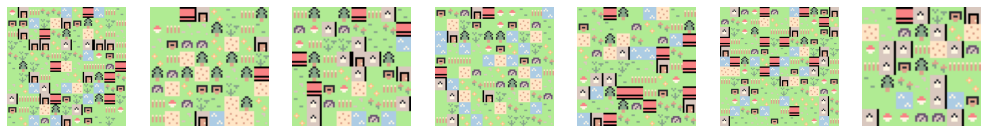

<ipython-input-4-5b5958434762>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(sm)


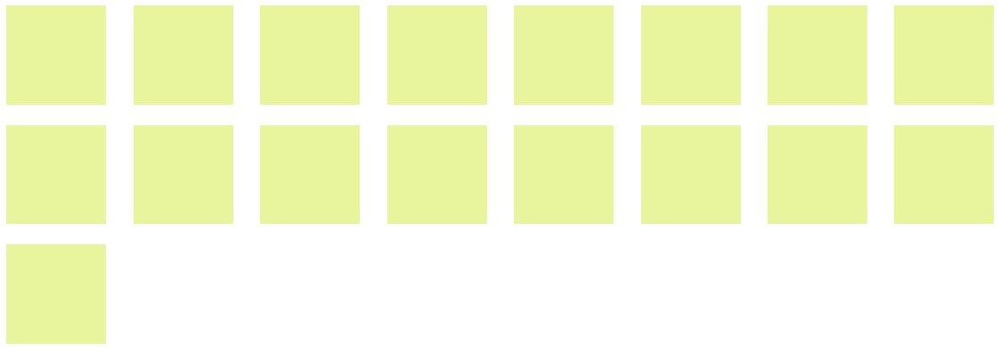

In [4]:
#show random set of randomly generated maps
def makeRandomAscMaps(num_maps,map_size=None):
    sm = []
    for i in range(num_maps):
        if map_size == None:
            s = random.randint(6,12)
        else:
            s = map_size
        sm.append(np.random.randint(0, 16, size=(s, s)))
        
    return np.array(sm)

def makeBlankAscMaps(num_maps,map_size=None):
    sm = []
    for i in range(num_maps):
        if map_size == None:
            s = random.randint(6,12)
        else:
            s = map_size
        sm.append(np.zeros(shape=(s, s),dtype=int))
        
    return np.array(sm)
    
showMultiMaps(makeRandomAscMaps(random.randint(3,32)),random.choice(['pokemon','zelda','pacman','dungeon','amongus']))
showMultiMaps(makeBlankAscMaps(random.randint(3,32)),random.choice(['pokemon','zelda','pacman','dungeon','amongus']))

Pre-processing (for the neural networks)

In [5]:
#split 2d map into one hot encoded channels (3d array)
def encodeMap(m,channels=16):
    map3d = np.zeros((m.shape[0],m.shape[1],channels))
    for r in range(m.shape[0]):
        for c in range(m.shape[1]):
            v = m[r][c]
            map3d[r][c][v] = 1
    return map3d
    
#convert 3d encoded channel map into 2d array format
def decodeMap(m3c):
    return np.argmax(m3c,axis=2)

m = makeRandomAscMaps(1)[0]
print(m)
m3 = encodeMap(m)
print(m3)
print(m3.shape)
print(decodeMap(m3))

[[ 7  2  0  3 12 14  9]
 [ 8  2  0  3  2 15 12]
 [ 6 11 12 14  6  9  8]
 [ 7  5  0  4  4 13  3]
 [ 4  7  1  4  2 15  1]
 [11 10 15  0  3  6  7]
 [ 8 10  1 15  3 15 12]]
[[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.

In [7]:
#normalizes the values in the map between 0-1
def normalizeMap(m,maxtiles=16):
    return m/maxtiles
    
#unnormalizes the map back to its original integer value
def unnormalizeMap(m,maxtiles=16):
    return np.around(m*maxtiles).astype(int)
    
m = makeRandomAscMaps(1)[0]
print(m)
print(m.shape)
nm = normalizeMap(m)
print(nm)
print(nm.shape)
print(unnormalizeMap(nm))
nm2 = np.array([[np.clip(0,x+random.uniform(0.01,0.25),15/16) for x in r] for r in nm])
print(nm2)
print(unnormalizeMap(nm2))

[[ 2  8 15  6  8  2 15]
 [ 6  1 12 13  5 12  9]
 [10  9  2 10  7  2  3]
 [ 6  3  9 15  7  6 10]
 [ 7 14  0 10  6  4  6]
 [ 3 15  8  2  8  5  6]
 [ 5 10  5 15  8 10  6]]
(7, 7)
[[0.125  0.5    0.9375 0.375  0.5    0.125  0.9375]
 [0.375  0.0625 0.75   0.8125 0.3125 0.75   0.5625]
 [0.625  0.5625 0.125  0.625  0.4375 0.125  0.1875]
 [0.375  0.1875 0.5625 0.9375 0.4375 0.375  0.625 ]
 [0.4375 0.875  0.     0.625  0.375  0.25   0.375 ]
 [0.1875 0.9375 0.5    0.125  0.5    0.3125 0.375 ]
 [0.3125 0.625  0.3125 0.9375 0.5    0.625  0.375 ]]
(7, 7)
[[ 2  8 15  6  8  2 15]
 [ 6  1 12 13  5 12  9]
 [10  9  2 10  7  2  3]
 [ 6  3  9 15  7  6 10]
 [ 7 14  0 10  6  4  6]
 [ 3 15  8  2  8  5  6]
 [ 5 10  5 15  8 10  6]]
[[0.23385837 0.61326091 0.9375     0.44810684 0.52238055 0.35280733
  0.9375    ]
 [0.41815041 0.12449119 0.82138607 0.9375     0.40920225 0.8539452
  0.66140503]
 [0.87132872 0.81153642 0.29986936 0.7660862  0.50302585 0.26983697
  0.30639553]
 [0.59243234 0.32222431 0.67643685 0.9

#### Import tilesets

In [8]:
zelda_tileset = Tileset("zelda")
pokemon_tileset = Tileset("pokemon")
pacman_tileset = Tileset("pacman")
amongus_tileset = Tileset("amongus")
dungeon_tileset = Tileset("dungeon")

Show user levels

<ipython-input-9-ad4a7f2d4327>:7: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  tmaps = np.array(tmaps)


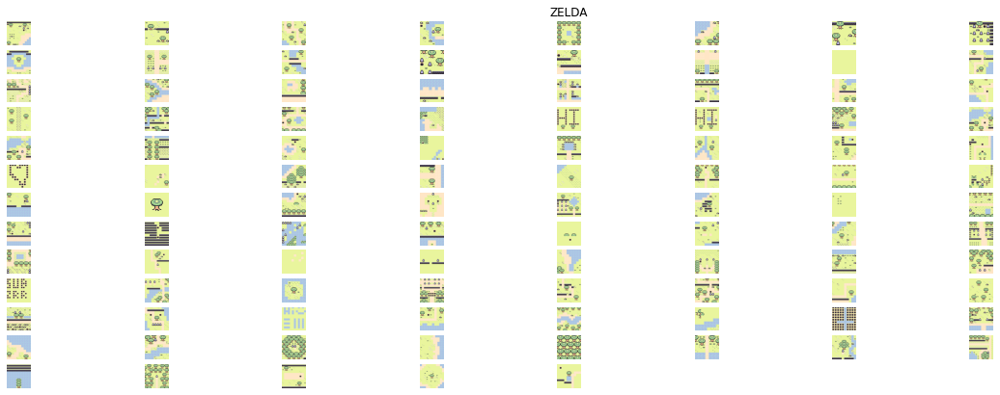

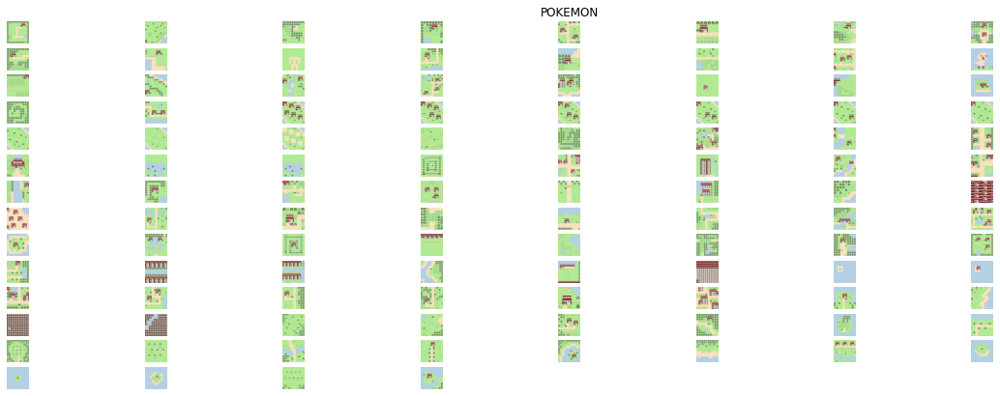

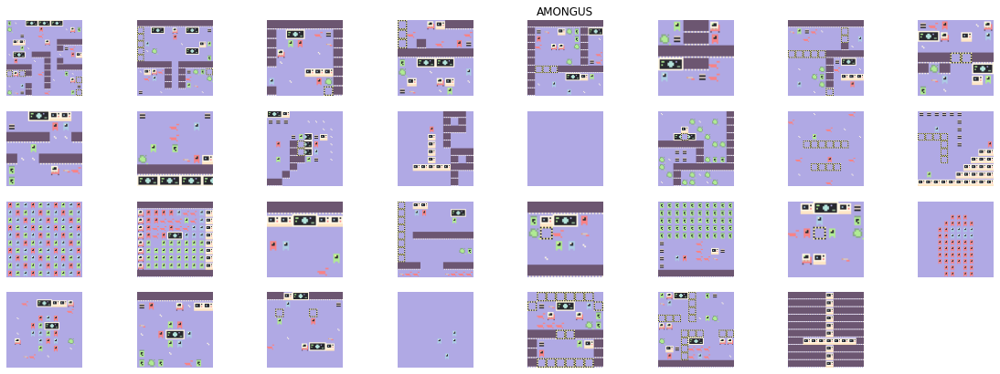

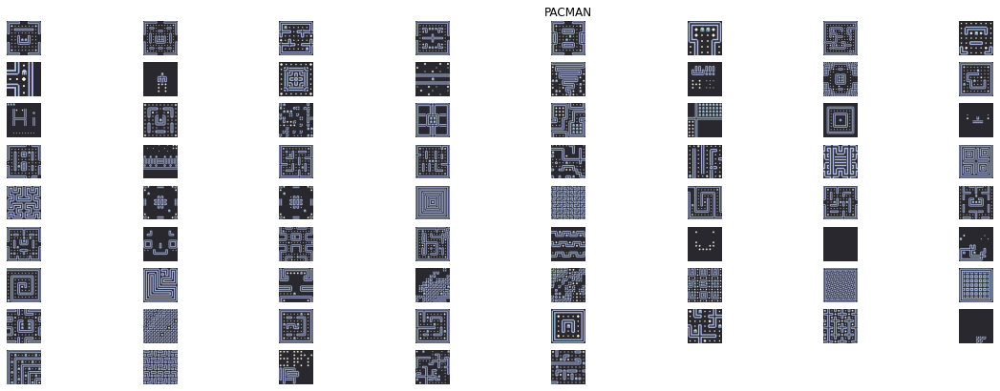

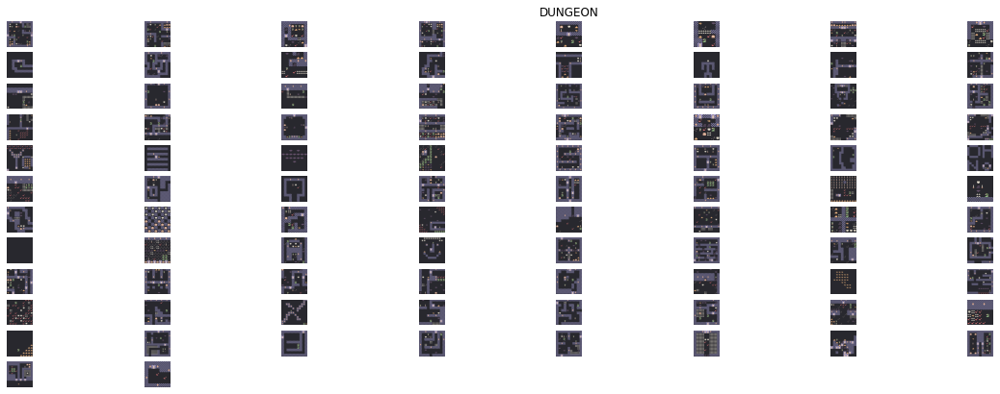

In [9]:
for t in ["zelda","pokemon","amongus","pacman","dungeon"]:
    sqlLevels = SQLLevelSet("user",t)
    tmaps = []
    for ls in sqlLevels.levelSet:
        larr = ls.ascii_level.level
        tmaps.append(larr.astype(int))
    tmaps = np.array(tmaps)
    showMultiMaps(tmaps,t,t)

#### Fitness function = fake user rating

In [10]:
# Custom Shitty Fitness Function Setups
# take as input a 2d array ascii map

#normal entropy function
def entropy(m):
    num_tiles = np.prod(m.shape)

    # get tile entropy #
    tileCts = {}
    for a in range(16):  #16 tiles
        tileCts[a] = 0

    for r in m:
        for t in r:
            tileCts[t]+=1

    tileProbs = {}
    for k,v in tileCts.items():
        tileProbs[k] = v/num_tiles

    return sum([-1*(p * math.log10(p)) for p in tileProbs.values() if p > 0])


#entropy and derivative entropy fitness function
def double_entropy(m):
    num_tiles = np.prod(m.shape)

    # get tile entropy #
    tileCts = {}
    for a in range(16):  #16 tiles
        tileCts[a] = 0

    for r in m:
        for t in r:
            tileCts[t]+=1

    tileProbs = {}
    for k,v in tileCts.items():
        tileProbs[k] = v/num_tiles

    entropy = sum([-1*(p * math.log10(p)) for p in tileProbs.values() if p > 0])

    #get tile derivative entropy (count # differing surrounding tiles)
    i = 0
    tileDiffCts = {}
    for a in range(5):  #4 directions, five possibilities
        tileDiffCts[a]=0

    for r in m:
        for t in r:
            n = getTileNeighbors(i,m)
            c = sum(map(lambda x: 0 if x == t else 1,n))
            tileDiffCts[c]+=1
            i+=1

    tileDiffProbs = {}
    for k,v in tileDiffCts.items():
        tileDiffProbs[k] = v/num_tiles

    der_entropy = -1*sum([(p * math.log10(p)) for p in tileDiffProbs.values() if p > 0])
    
    #print(f"e probs: {tileProbs} | de probs {tileDiffProbs}")
    #print(f"e probs sum: {sum(list(tileProbs.values()))} | de probs sum {sum(list(tileDiffProbs.values()))}")
    #print(f"entr: {(1-entropy)} | der entr: {(1-der_entropy)}")
    
    #return portion of both
    return 0.5*(1.0-entropy)+0.5*(1.0-der_entropy)
    
    
#get the neighbors of a specific tile index
def getTileNeighbors(i,m):
    c = i % m.shape[1]
    r = math.floor(i / m.shape[1])
    
    n = []
    if r > 0:
        n.append(m[r-1][c])
    if r < (m.shape[0]-1):
        n.append(m[r+1][c])
    if c > 0:
        n.append(m[r][c-1])
    if c < (m.shape[1]-1):
        n.append(m[r][c+1])
        
    return n

#check if the map has a pattern match with multiple tiles placed specifically (house, tree, etc)
def hasPattern(m,pat,ct=False):
    i = 0
    cts = 0
    for i in range(np.prod(m.shape)):
        c = i % m.shape[1]
        r = math.floor(i / m.shape[1])
        
        if c > m.shape[1]-pat.shape[1]:
            continue
        elif r > m.shape[0]-pat.shape[0]:
            continue
        else:
            m_sub = makeSubArr(m,i,pat.shape)
            if(np.array_equal(m_sub,pat)):
                cts+=1
                if not ct:
                    return True
    if not ct:
        return False
    else:
        return cts

    
#grab subset 2d array from index
def makeSubArr(m,i,shape):
    c = i % m.shape[1]
    r = math.floor(i / m.shape[1])
    
    return m[r:r+(shape[1]), c:c+(shape[0])]

#check if map is of a good size (up to 1) - so much goddamn math
def perfSize(m,s):
    return xsq(m.shape[0],s)

#curvature for proximity to number
def xsq(x,n):
    return 1/(((x-n)**2)+1)

#weigh the tiles and their occurrence (similar to entropy)
def tileWeight(m,weights):
    num_tiles = np.prod(m.shape)

    # get tile entropy #
    tileCts = {}
    for a in range(16):  #16 tiles
        tileCts[a] = 0

    for r in m:
        for t in r:
            tileCts[t]+=1

    tileProbs = {}
    for k,v in tileCts.items():
        tileProbs[k] = v/num_tiles
        
    #now get approximation to desired weights
    s = 0
    for t in tileProbs:
        s += xsq(tileProbs[t],weights[t])
        
    return s/16  #16 tiles - 16 weights

#setup tile weights by dividing value until at index into lower indexes
#idfk - don't think too hard about it
def tw_setup(tl): 
    weights = {}
    ci = 0
    ws = list(tl.keys())
    for i in range(16):
        k = ws[ci]
        if i < k:
            weights[i] = (tl[k]/((k+1) if ci == 0 else (k)-(ws[ci-1])))/100
        elif i == k:
            weights[i] = (tl[k]/((k+1) if ci == 0 else (k)-(ws[ci-1])))/100
            ci+=1
    
    return weights

# like a toddler, only says whether or not it likes the food (food is the map given) 
# and only has a perfect 1 when it is the exact map (when food = mac-n-cheese)
# will get higher as map gets closer to looking like exact map
def toddler(food,mac_n_chz):
    too_big = False
    sm_map = None
    
    #smaller
    if np.prod(food.shape) > np.prod(mac_n_chz.shape):
        sm_map = mac_n_chz
        too_big = True
    else:
        sm_map = food
        
    num_tiles = np.prod(sm_map.shape)
    match = 0
    for i in range(num_tiles):
        c = i % sm_map.shape[1]
        r = math.floor(i / sm_map.shape[1])
        
        if food[r][c] == mac_n_chz[r][c]:
            match+=1
            
    
    #subtract missing
    if too_big:
        match -= abs(np.prod(food.shape)-np.prod(mac_n_chz.shape))
    
    return match/np.prod(mac_n_chz.shape)


In [11]:
TILELIST = ["zelda","pokemon","amongus","pacman","dungeon"]
TILE = "zelda"

#custom patterns
house = np.array([[12,12],[13,14]])
tree = np.array([[12,13],[14,15]])
console = np.array([[9,10]])
exit = np.array([[15,13,15]])
TILE_PATTERN_SET = {"pokemon":house, "zelda":tree, "amongus":console,"dungeon":exit,"pacman":np.array([[]])}

#custom tile weights
zelda_w = tw_setup({1:35,3:10,7:10,11:20,15:25})
pokemon_w = tw_setup({5:40,6:5,11:35,15:20})
amongus_w = tw_setup({1:25,7:12,8:13,12:25,15:25})
dungeon_w = tw_setup({0:35,4:15,8:8,12:12,15:30})
pacman_w = tw_setup({0:1,2:25,13:60,14:5,15:9})
TILE_WEIGHT_SET = {"pokemon":pokemon_w,"zelda":zelda_w,'amongus':amongus_w,"dungeon":dungeon_w,"pacman":pacman_w}

#custom maps (for toddler algorithm)
zelda_m = np.array([
        [9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9],
        [8, 12, 13, 0, 0, 0, 0, 0, 12, 13, 0, 3],
        [0, 14, 15, 0, 0, 0, 7, 5, 14, 15, 5, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 10, 0, 7, 0],
        [0, 2, 0, 1, 0, 0, 0, 1, 8, 5, 0, 0],
        [0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 1],
        [0, 3, 3, 3, 0, 0, 0, 0, 0, 4, 4, 4],
        [0, 3, 7, 3, 0, 0, 0, 4, 4, 4, 4, 6],
        [2, 3, 0, 3, 0, 1, 0, 4, 4, 6, 6, 11],
        [0, 0, 0, 0, 0, 0, 0, 4, 4, 6, 11, 11],
        [12, 13, 0, 0, 0, 0, 4, 4, 6, 11, 11, 11],
        [14, 15, 2, 7, 7, 3, 4, 6, 11, 11, 11, 11]
      ])
pokemon_m = np.array([
        [10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10],
        [10, 3, 9, 9, 0, 0, 0, 0, 12, 12, 0, 10],
        [10, 0, 0, 0, 0, 0, 0, 8, 13, 14, 3, 10],
        [10, 0, 2, 0, 0, 6, 6, 6, 6, 0, 0, 10],
        [10, 5, 0, 0, 0, 6, 0, 0, 0, 0, 5, 10],
        [10, 0, 0, 0, 0, 6, 0, 2, 0, 0, 0, 10],
        [10, 0, 5, 0, 0, 6, 0, 0, 0, 0, 0, 10],
        [10, 4, 0, 0, 0, 6, 0, 0, 0, 11, 11, 10],
        [10, 7, 4, 6, 6, 6, 6, 6, 6, 11, 11, 10],
        [10, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 10],
        [10, 0, 0, 0, 0, 0, 5, 0, 0, 2, 0, 10],
        [10, 10, 10, 10, 10, 10, 10, 10, 10, 7, 7, 10]
      ])
amongus_m = np.array([
        [7, 1, 0, 9, 10, 9, 10, 9, 10, 0, 0, 0],
        [4, 0, 0, 0, 0, 13, 0, 0, 0, 1, 12, 7],
        [0, 0, 3, 0, 0, 2, 0, 0, 0, 0, 0, 0],
        [0, 11, 11, 0, 0, 0, 12, 0, 8, 8, 8, 8],
        [0, 0, 15, 1, 0, 0, 0, 0, 8, 3, 2, 0],
        [1, 9, 10, 0, 8, 8, 8, 0, 1, 0, 13, 11],
        [0, 13, 0, 0, 1, 0, 8, 0, 8, 0, 0, 0],
        [8, 8, 8, 8, 0, 0, 8, 0, 8, 8, 8, 8],
        [5, 12, 5, 8, 0, 2, 8, 0, 0, 7, 1, 0],
        [0, 0, 0, 0, 0, 0, 8, 1, 0, 0, 12, 5],
        [1, 0, 14, 8, 0, 0, 8, 0, 0, 0, 0, 3],
        [4, 6, 3, 8, 0, 0, 2, 0, 0, 0, 15, 5]
      ])
dungeon_m = np.array([
        [15, 15, 14, 15, 15, 15, 13, 15, 15, 15, 15, 15],
        [15, 0, 0, 0, 5, 0, 0, 15, 0, 0, 4, 15],
        [15, 0, 9, 0, 12, 2, 0, 15, 11, 0, 0, 15],
        [15, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 15],
        [15, 3, 0, 8, 0, 0, 0, 15, 10, 0, 0, 15],
        [15, 0, 0, 0, 0, 0, 0, 15, 15, 15, 15, 14],
        [13, 0, 7, 11, 0, 0, 0, 0, 0, 0, 0, 13],
        [15, 15, 15, 15, 0, 2, 5, 8, 0, 2, 0, 15],
        [15, 0, 0, 0, 9, 9, 0, 0, 0, 0, 0, 15],
        [15, 0, 5, 15, 0, 0, 0, 0, 0, 11, 8, 15],
        [15, 8, 12, 15, 0, 0, 3, 0, 0, 8, 0, 15],
        [15, 15, 15, 14, 15, 15, 15, 15, 15, 14, 15, 15]
      ])
pacman_m = np.array([
        [11, 7, 7, 7, 6, 0, 0, 4, 7, 7, 7, 10],
        [8, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 8],
        [8, 1, 4, 6, 1, 0, 0, 1, 4, 6, 1, 8],
        [8, 1, 1, 1, 1, 4, 6, 1, 1, 1, 1, 8],
        [5, 1, 3, 1, 1, 1, 1, 1, 1, 3, 1, 5],
        [0, 1, 8, 1, 3, 15, 15, 3, 1, 8, 1, 0],
        [0, 1, 8, 1, 8, 15, 15, 8, 1, 8, 1, 0],
        [3, 1, 5, 1, 12, 7, 7, 13, 1, 5, 1, 3],
        [8, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 8],
        [8, 1, 4, 6, 1, 4, 6, 1, 4, 6, 1, 8],
        [8, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 8],
        [12, 7, 7, 7, 6, 0, 0, 4, 7, 7, 7, 13]
      ])
TILE_BEST_MAPS = {"zelda":zelda_m, "pokemon":pokemon_m,"amongus":amongus_m,"pacman":pacman_m,"dungeon":dungeon_m}

#user training sets + tpdict (for Tile Pattern KL-divergence algorithm)
KL_WINDOW_SIZE = 2

user_maps = {}
for t in TILELIST:
    sqlLevels = SQLLevelSet("user",t)
    tmaps = []
    for ls in sqlLevels.levelSet:
        larr = ls.ascii_level.level
        tmaps.append(larr.astype(int))
    tmaps = np.array(tmaps)
    user_maps[t] = tmaps
    
user_maps_tpdict = {}
for t in TILELIST:
    user_maps_tpdict[t] = tpkl.getTPProb(user_maps[t],KL_WINDOW_SIZE)

#overall fitness function for the basic agent
def final_fitness(ms):
    global TILE_BEST_MAPS, TILE_WEIGHT_SET, TILE
    fset = []
    for m in ms:
        
        f = tpkl.tp_fitness(m,user_maps_tpdict[TILE],WINDOW=KL_WINDOW_SIZE)
        
#         f = toddler(m,TILE_BEST_MAPS[TILE])
        
        
#         f = 0.3*double_entropy(m)
#         f += 0.4*(1 if hasPattern(m,TILE_PATTERN_SET[TILE]) else 0)
#         f += 0.05*perfSize(m,8)
#         f += 0.25*tileWeight(m,TILE_WEIGHT_SET[TILE])
        fset.append(f)
    return fset
    

<ipython-input-11-485557d6e311>:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  tmaps = np.array(tmaps)


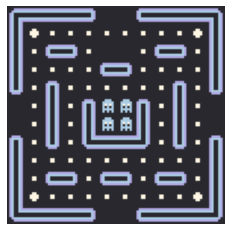

[-5.159805721935863]
0.013888888888888888
-5.159805721935863


In [12]:
#tester for real level
TILE = "pacman"
showMap(TILE_BEST_MAPS[TILE],TILE)
print(final_fitness([TILE_BEST_MAPS[TILE]]))
print(toddler(m,TILE_BEST_MAPS[TILE]))
print(tpkl.tp_fitness(TILE_BEST_MAPS[TILE],user_maps_tpdict[TILE]))

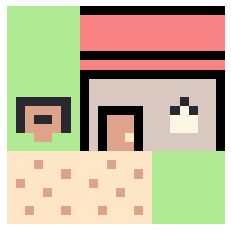

-6.867137830828593


In [13]:
fake_map = np.array([[0,12,12],[8,13,14],[6,6,0]])
showMap(fake_map,'pokemon')
print(tpkl.tp_fitness(fake_map,user_maps_tpdict['pokemon']))

#### Generator 1 - Straight interactive evolution

In [14]:
%matplotlib
#Normal evolutionary algorithm that evolves a population of ascii maps towards a fitness value
class StraightBot():
    def __init__(self,tileset,popSize,mutrate):
        self.tileset = tileset    #use the Tileset class
        self.pop_size = popSize
        self.population = []
        self.user_fun = None
        self.mutRate = mutrate
        self.changeFit = []
        
    #creates a new randomized map population
    def new_pop(self):
        self.population = makeRandomAscMaps(self.pop_size,TILE_BEST_MAPS[TILE].shape[0])
        
    #mu + lambda population update
    def evolve_pop(self):
        next_gen_pop = []
        pop_fitness = [i[0] for i in sorted(enumerate(self.user_fun(self.population)), key=lambda x:x[1],reverse=True)]
        
        #total = sum(list(range(self.pop_size+1)))
        #probs = [x/total for x in range(1,self.pop_size+1)]
        #print(pop_fitness)
        
        #get the best samples from the population
        best_population = []
        for p in pop_fitness:
            best_population.append(self.population[p])
            
        #add mutated maps
        wpop = list(range(1,self.pop_size+1))
        wpop.reverse()
        mut_maps = random.choices(best_population,weights=wpop,k=int(self.pop_size/2))
        for m in mut_maps:
            next_gen_pop.append(self.mutate(m))
            
        #add top maps
        for b in range(int(self.pop_size/2)):
            i = pop_fitness[b]
            next_gen_pop.append(self.population[i])
            
        self.population = np.array(next_gen_pop)
        
    #get the highest fitness in the population
    def high_pop_fit(self):
        return max(self.user_fun(self.population))
    
    #get the average fitness in the population
    def avg_pop_fit(self):
        return np.average(self.user_fun(self.population))
    
    #get the map from the population with the 
    def best_map(self):
        return self.population[np.argmax(self.user_fun(self.population))]
        
        
    #mutate a map 
    def mutate(self,m):
        m2 = m.copy()
        mr = random.random()
        
        #change the dimensions
        if mr <= 0.01:
            r = random.random()
            #decrease
            if r < 0.5 and m.shape[0]>6:
                m2 = m2[:m.shape[0]-1, :m.shape[1]-1]
            #increase
            elif m.shape[0] < 12:
                m2 = np.random.randint(0,16,size=(m.shape[0]+1,m.shape[1]+1))
                m2[0:m.shape[0], 0:m.shape[1]] = m.copy()
                #print(f"m:{m.shape} - m2:{m2.shape}")
                
        #change tiles randomly
        for i in range(np.prod(m2.shape)):
            c = i % m2.shape[1]
            r = math.floor(i / m2.shape[1])
            
            tr = random.random()
            if tr <= self.mutRate:
                m2[r][c] = random.randint(0,self.tileset.num_tiles-1)
                
        return np.array(m2)
            
        
    #evolve a population from scratch for a number of epochs
    def train(self,epochs,showPop=False):
        #initialize a new population if one not created already
        if len(self.population) == 0:
            self.new_pop()
            self.changeFit = []
        
        #don't show population as evolved
        if not showPop:
            with tqdm(total=epochs) as pbar:
                for e in range(epochs):
                    pbar.update(1)
                    self.evolve_pop()
                    self.changeFit.append(self.avg_pop_fit())  #append the averaged population fitness to show changes
                    pbar.set_description(f'epoch: {1 + e} - fit: {self.high_pop_fit():.2f}')
        #show the population while evolving
        else:
            for e in range(epochs):
                self.evolve_pop()
                
                self.changeFit.append(self.avg_pop_fit())  #append the averaged population fitness to show changes

                #show the population so far
                if showPop and ((e+1) % 100 == 0 or e == 0):
                    showMultiMaps(self.population,self.tileset.tileFile,f"EPOCH: {e+1} - fitness: {self.high_pop_fit()}")


Using matplotlib backend: <object object at 0x14a654b50>


In [17]:
%matplotlib inline
#show change in fitness over epochs for each tileset
def showFitnessGraphs(fitsets, epochs,max_f=1.0):
    plt.figure(figsize=(20,7))
    i=0
    for TILE in fitsets.keys():
        tfc = fitsets[TILE]
        axs = plt.subplot(2, 5, i + 1)
        for t in range(len(tfc)):
            axs.plot(list(range(epochs))[::10],tfc[t][::10],label=f'Trial #{t}')   #use every 10th 
            axs.set_ylim(-15,0)
        i+=1
        plt.title(TILE)
        
if 1 in EXPERIMENTS:
    showFitnessGraphs(mu_fit_sets,EPOCHS,1)

#### Generator 5: Evolved Fitness Neural Network

*Algorithm*: 

    1. Neural network evolves a population based on its "trained" value (A iterations)
    2. Select the best map from the evolved population
    3. Pass the generated map to the "real" fitness function along with a user map to get its score
    4. Train the NN on the generated map and its score and the user map and its score
    5. Repeat 1-4 B times

Step 1.1: Create a neural network that takes in as input a tilemap and outputs a score (-inf,inf) to represent the estimated voting difference

In [32]:
# a regression model that outputs a value (representing user vote) based on an input map
class FitnessCNN():
    def __init__(self,tileset,output='whole'):
        self.tileset = tileset
        self.mod = 'encode'
        self.nn_size = 4   #minimum size of the maps
        self.channels = tileset.num_tiles
        self.nn_out = output
        
        self.makeModel()
        
        
    #make a regression model to try to predict the rating value
    def makeModel(self):
        rm = Sequential()

        rm.add(Conv2D(self.channels*4,(2,2),strides=(2,2),padding='same',input_shape=[self.nn_size,self.nn_size,self.channels]))
        rm.add(BatchNormalization())
        rm.add(ReLU())
        rm.add(MaxPooling2D(pool_size=(2, 2),strides=(1, 1), padding='same'))

        rm.add(Conv2D(self.channels*2,(2,2),strides=(2,2),padding='same'))
#         rm.add(Conv2D(self.channels*2,(2,2),strides=(2,2),padding='same',input_shape=[self.nn_size,self.nn_size,self.channels]))
        rm.add(BatchNormalization())
        rm.add(ReLU())
        rm.add(MaxPooling2D(pool_size=(2, 2),strides=(1, 1), padding='same'))

        rm.add(Conv2D(self.channels,(2,2),strides=(2,2),padding='same'))
        rm.add(BatchNormalization())
        rm.add(ReLU())

        rm.add(Flatten())
        rm.add(Dense(self.channels, activation='relu'))
        
        # use whole values to predict (raw vote difference model)
        if self.nn_out == 'whole':
            rm.add(Dense(1, activation="linear"))
        # use 0-1 to predict (vote percentage model)
        else:
            rm.add(Dense(1,activation='sigmoid'))
    
        rm.compile(loss="mse", optimizer="adam",metrics=['accuracy'])
        if DEBUG:
            rm.summary()
        self.reg_model = rm
    
    #convert the maps to be input into the neural network
    def convert_maps(self,maps):
        tmaps = []
        submap_set = {}
        
        #get all levels in the set
        smi = 0
        for li in range(len(maps)):
            l = maps[li]
            
            #crop to the smallest shape
            for i in range(np.prod(l.shape)):
                c = i % l.shape[0]
                r = math.floor(i / l.shape[0])

                #check if out of bounds
                if((r+self.nn_size)>l.shape[0] or (c+self.nn_size)>l.shape[0]):
                    continue

                #get the map crop area (window)
                twin = l[r:r+self.nn_size,c:c+self.nn_size]
                
                #save
                tmaps.append(twin.astype(int))
                submap_set[smi] = li   #save the tmap ID to the associated og map
                smi+=1

        if DEBUG: 
            print(f"> Created {len(tmaps)} cropped sub-levels from the tileset")
            
        #save the original maps (before preprocessing)
        tmaps = np.array(tmaps)
         
        #encode maps
        if self.mod == 'encode':
            return np.array([encodeMap(m) for m in tmaps]), submap_set
        
        #normalize maps
        else:
            return np.array([normalizeMap(m) for m in tmaps]), submap_set

    #evaluate a population of maps 
    def eval_map_population(self,pop):
        #convert the maps to an appropriate format
        conv_pop, pop_key = self.convert_maps(pop)
        
        #return the predictions
        raw_preds = np.array(self.reg_model(conv_pop,training=False)).squeeze()
        
        #get the combined scores for each item
        pop_score = {}
        for i in range(len(pop)):
            pop_score[i] = []
        for pi in range(len(raw_preds)):
            pop_score[pop_key[pi]].append(raw_preds[pi])
            
        #return the averaged score for each set
        all_avgs = [np.average(np.array(x)) for x in pop_score.values()]
        return all_avgs
        
            
    #train the network on the input maps (selected generated and user map) and their associated scores (from the fitness function)
    def train(self,epochs,input_maps,input_scores):
        if DEBUG:
            print(f"-- TRAINING REG MODEL ON [ {self.tileset.tileFile} ] for [ {epochs} ] EPOCHS --")
            
        #split up the maps and scores to associate and train individually
        real_maps = input_maps['real']
        conv_rm,rm_key = self.convert_maps(real_maps)
        fake_maps = input_maps['fake']
        conv_fm,fm_key = self.convert_maps(fake_maps)
            
        #expand scores for each subset map
        real_scores = []
        for k in rm_key.values():
            real_scores.append(input_scores['real'][k])
        fake_scores = []
        for k in fm_key.values():
            fake_scores.append(input_scores['fake'][k])
            
        #use the minimum number as the number of patterns to try on and randomly select from the larger
        max_num_patt = max(len(conv_rm),len(conv_fm))
        print(f"# real:{len(conv_rm)} / # fake:{len(conv_fm)} => {max_num_patt}")
        if len(conv_fm) > len(conv_rm):   #add more to real
            ind = random.choices(range(len(conv_rm)),k=(max_num_patt-len(conv_rm)))
            conv_rm = np.concatenate((conv_rm,conv_rm[ind]),axis=0)
            real_scores += np.array(real_scores)[ind].tolist()
        elif len(conv_rm) > len(conv_fm):   #add more to fake
            ind = random.choices(range(len(conv_fm)),k=(max_num_patt-len(conv_fm)))
            conv_fm = np.concatenate((conv_fm,conv_fm[ind]),axis=0)
            fake_scores += np.array(fake_scores)[ind].tolist()

                    
        #sanity check
#         unenc = [decodeMap(m) for m in conv_rm[:32]]
#         s = real_scores[:32]
#         showMultiMaps(unenc,self.tileset.tileFile,'',s)

        #combine to X and y
        X_tr = np.concatenate((conv_rm,conv_fm),axis=0)
        y_tr = np.concatenate((real_scores,fake_scores),axis=0)
            
        #train regression model for X epochs on Y batches of maps
        history = self.reg_model.fit(X_tr,y_tr,epochs=epochs,batch_size=min(16,len(X_tr)),shuffle=True,verbose=False)
        eloss = history.history['loss']
        acc = history.history['accuracy']
                
        return np.array(eloss), np.array(acc)
    
    #export the model to a folder
    def exportModel(self,loc,name):
        if not os.path.exists(loc):
            os.makedirs(loc,exist_ok=True)
        
        self.reg_model.save(os.path.join(loc,name)+".h5")
        
     #import the model to a folder
    def importModel(self,loc,name):
        filename = os.path.join(loc,name)+".h5"
        if not os.path.exists(filename):
            #try to find an appoximation
            new_name = self.getModel(loc,name)
            if new_name != None:
                filename = os.path.join(loc,new_name)
            else:
                print(f"ERROR: {filename} does not exist or file with partial name not found in location: {loc}!")
                return
        
        self.reg_model = tf.keras.models.load_model(filename)
        
    #find a model's full filename based on the approximate name given
    def getModel(self,directory,approx_name):
        d = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]
        for f in d:
            if approx_name in f:
                return f
        return None

        
        

#### Set the training maps (user, winner, profile) and tile pattern set

** ERROR: Level ID [ 68 ] from [ gen ] dataset not found! **


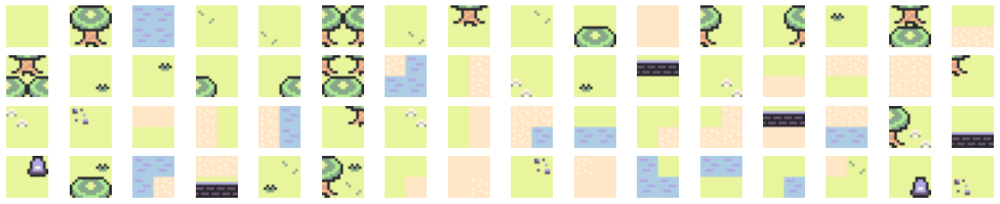

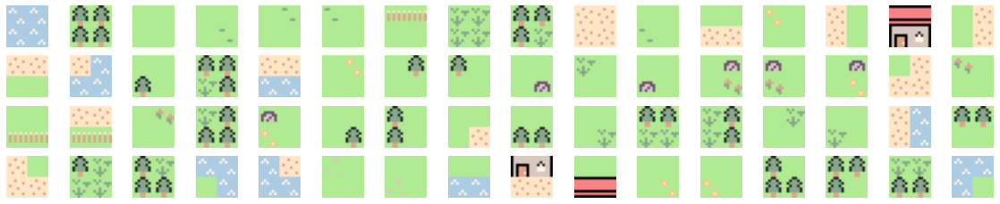

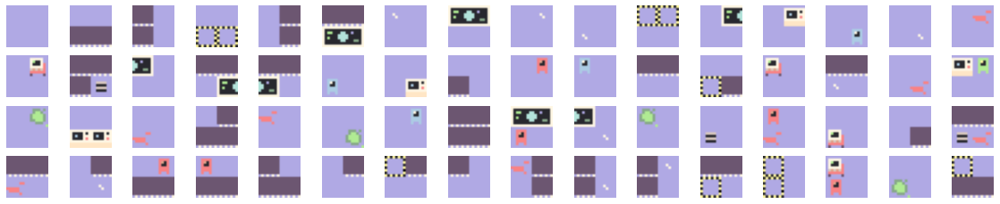

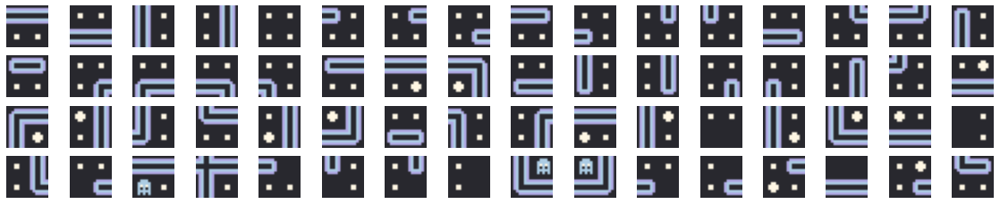

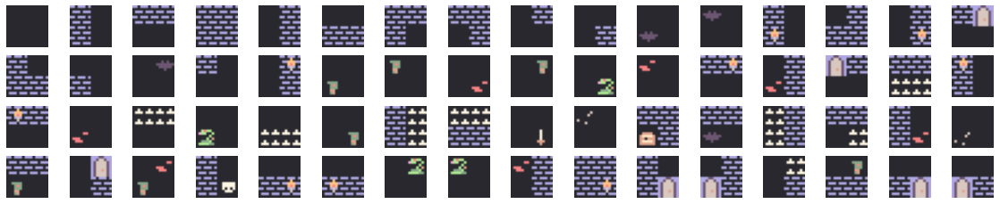

In [33]:
import utils

# import groups of pairings and levels for training
USER_LEVELS = {}
for t in ["zelda","pokemon","amongus","pacman","dungeon"]:
    USER_LEVELS[t] = utils.getAscUserLevels(t)
WIN_LEVELS = utils.getWinningLevelSet()
#PROFILE_LEVELS = utils.getProfileLevelSet(["@MasterMilkX"])
PROFILE_LEVELS = utils.getProfileLevelSet(["@MasterMilkX","@Nifflas"])

# set used maps
TRAIN_MAPS = WIN_LEVELS
TWIT_LEVELS = WIN_LEVELS
TP_LEVELS = PROFILE_LEVELS

#make tilepatterns
TWIT_PATT_DICT = {}
EVO_PATT_2D = {}
for t in ["zelda","pokemon","amongus","pacman","dungeon"]:
    TWIT_PATT_DICT[t] = tpkl.getTPProb(TWIT_LEVELS[t])    #for use in pseudotwitter
    EVO_PATT_2D[t] = tpkl.getPatternList2dSorted(TP_LEVELS[t])   #for use with evolver
    
    utils.showTilePat(EVO_PATT_2D[t][:64],t)

In [34]:
# USE_WIN = True

# if USE_WIN:

#     import utils
#     KL_WINDOW_SIZE = 2
    
#     win_maps = utils.getWinningLevelSet()
#     user_maps_tpdict = {}
#     for t in TILELIST:
#         user_maps_tpdict[t] = tpkl.getTPProb(win_maps[t],KL_WINDOW_SIZE)
#         showMultiMaps(win_maps[t],t,f"WIN MAPS - {t}")
    

In [35]:
# #export tile patterns to 2d array subsets
# user_patt2d = {}
# for t in ["zelda","pokemon","amongus","pacman","dungeon"]:
#     tile_tpdict = TILE_PATT_DICT[t]
#     pats = sorted(tile_tpdict, key=tile_tpdict.get,reverse=True)  # sort by value
#     train_patt2d[t] = np.array([np.array([int(i,16) for i in list(x)]).reshape(KL_WINDOW_SIZE,KL_WINDOW_SIZE) for x in pats])
    
#     utils.showTilePat(train_patt2d[t][:64],t)

Step 1.2: Update the evolutionary bot to mutate based on tile patterns instead of flips

In [36]:
#Normal evolutionary algorithm that evolves a population of ascii maps towards a fitness value
class StraightBotTP():
    def __init__(self,tileset,popSize,mutrate,tilepatterns,rank_tp_sel=False,mu=0.5):
        self.tileset = tileset    #use the Tileset class
        self.pop_size = popSize
        self.population = [] 
        self.user_fun = None      #fitness function to act as the user evaluation of a level
        self.mutRate = mutrate
        self.changeFit = []
        self.mut_tilepats = tilepatterns
        self.mu = mu              #mu lambda mutation for evolution and population reselection
        self.rank_tp_sel = rank_tp_sel   #select the tile patterns in ranked form
        
    #creates a new randomized map population
    def new_pop(self,randomInit=True):
        if randomInit:
            self.population = makeRandomAscMaps(self.pop_size,9)
        else:
            self.population = makeBlankAscMaps(self.pop_size)
        
    #mu + lambda population update
    def evolve_pop(self):
        next_gen_pop = []
        pop_fitness = [i[0] for i in sorted(enumerate(self.user_fun(self.population)), key=lambda x:x[1],reverse=True)]
        
        #total = sum(list(range(self.pop_size+1)))
        #probs = [x/total for x in range(1,self.pop_size+1)]
        #print(pop_fitness)
        
        #get the best samples from the population
        best_population = []
        for p in pop_fitness:
            best_population.append(self.population[p])
            
        #add mutated maps (mu many)
        wpop = list(range(1,self.pop_size+1))
        wpop.reverse()
        mut_maps = random.choices(best_population,weights=wpop,k=int(self.pop_size*self.mu))
        for m in mut_maps:
            next_gen_pop.append(self.mutate(m))
            
        #add top maps
        for b in range(self.pop_size-len(next_gen_pop)):
            i = pop_fitness[b]
            next_gen_pop.append(self.population[i])
            
        self.population = np.array(next_gen_pop)
        
    #get the highest fitness in the population
    def high_pop_fit(self):
        return max(self.user_fun(self.population))
    
    #get the average fitness in the population
    def avg_pop_fit(self):
        return np.average(self.user_fun(self.population))
    
    #get the map from the population with the 
    def best_map(self):
        return self.population[np.argmax(self.user_fun(self.population))]
    
    #get the average NxN size of the population
    def avg_pop_size(self):
        return np.average([len(x) for x in self.population])
        
    #mutate a map 
    def mutate(self,m):
        m2 = m.copy()
        mr = random.random()
        
        #change the dimensions
        if mr <= 0.01:
            r = random.random()
            #decrease
            if r < 0.5 and m.shape[0]>6:
                m2 = m2[:m.shape[0]-1, :m.shape[1]-1]
            #increase
            elif m.shape[0] < 12:
                m2 = np.random.randint(0,16,size=(m.shape[0]+1,m.shape[1]+1))
                m2[0:m.shape[0], 0:m.shape[1]] = m.copy()
                #print(f"m:{m.shape} - m2:{m2.shape}")
                
        #change tiles randomly based on tile pattern set
        for i in range(np.prod(m2.shape)):
            c = i % m2.shape[1]
            r = math.floor(i / m2.shape[1])
            
            #replace tiles at position with randomly selected tile pattern
            tr = random.random()
            if tr <= self.mutRate:
                if self.rank_tp_sel:
                    tweights = [i for i in range(len(self.mut_tilepats),0,-1)]
                    rep_tp = random.choices(self.mut_tilepats,weights=tweights,k=1)[0]
                else:
                    rep_tp = random.choice(self.mut_tilepats)
                
                #keep within bounds
                h = min(m2.shape[0],r+KL_WINDOW_SIZE) - r  
                w = min(m2.shape[1],c+KL_WINDOW_SIZE) - c
                
                if h == 0 or w == 0:
                    continue
                
                m2[r:r+h, c:c+w] = rep_tp[:h,:w]
                
                
        return np.array(m2)
            
        
    #evolve a population from scratch for a number of epochs
    def train(self,epochs,randomInit=True,showPop=False):
        #initialize a new population if one not created already
        if len(self.population) == 0:
            self.new_pop(randomInit)
            self.changeFit = []
                    
        #don't show population as evolved
        with tqdm(total=epochs) as pbar:
            for e in range(epochs):
                pbar.update(1)
                self.evolve_pop()
                self.changeFit.append(self.avg_pop_fit())  #append the averaged population fitness to show changes
                pbar.set_description(f'epoch: {1 + e} - fit: {self.high_pop_fit():.2f} - N: {self.avg_pop_size():.2f}')
                
                if showPop:
                    showMultiMaps(self.population,self.tileset.tileFile)


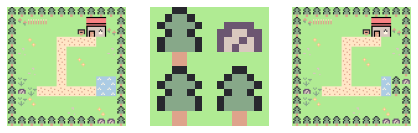

<ipython-input-4-5b5958434762>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(sm)
  0%|          | 0/4 [00:00<?, ?it/s]<ipython-input-36-58c9b2305946>:47: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.population = np.array(next_gen_pop)
epoch: 1 - fit: -5.75 - N: 7.50:  25%|██▌       | 1/4 [00:00<00:00, 64.66it/s]

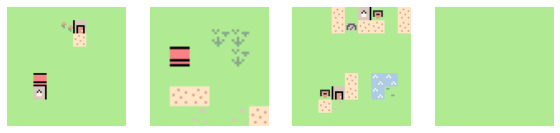

epoch: 2 - fit: -5.75 - N: 6.75:  50%|█████     | 2/4 [00:00<00:00, 14.66it/s]

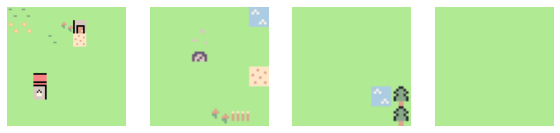

epoch: 3 - fit: -5.75 - N: 6.00:  75%|███████▌  | 3/4 [00:00<00:00, 14.66it/s]

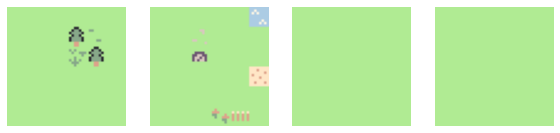

epoch: 4 - fit: -5.75 - N: 6.00: 100%|██████████| 4/4 [00:00<00:00, 10.16it/s]

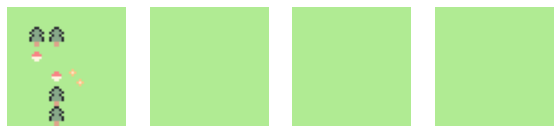

epoch: 4 - fit: -5.75 - N: 6.00: 100%|██████████| 4/4 [00:00<00:00,  8.16it/s]


In [37]:
#test the new evolver mutation
new_map = TILE_BEST_MAPS['pokemon'].copy()

i = random.choice(range(np.prod(new_map.shape)))
ci = i % new_map.shape[1]
ri = math.floor(i / new_map.shape[1])
replace_set = random.choice(EVO_PATT_2D['pokemon'])

h = min(new_map.shape[0],ri+KL_WINDOW_SIZE) - ri  
w = min(new_map.shape[1],ci+KL_WINDOW_SIZE) - ci
new_map[ri:ri+h, ci:ci+w] = replace_set[:h,:w]

showMultiMaps([TILE_BEST_MAPS['pokemon'],replace_set,new_map],'pokemon')


#test actual evaluator
stp = StraightBotTP(pokemon_tileset,4,0.03,EVO_PATT_2D['pokemon'],True,0.9)
stp.user_fun = final_fitness
stp.train(4,False,True)

Step 2: Define "twitter" fitness function

In [38]:
names = ["zelda","pokemon","amongus","pacman","dungeon"]
SAMP_WEIGHT = 0.1         #P vs. Q WEIGHT FOR TPKL-DIV
TWIT_MULT = 3              #TWITTER SCORE MULTIPLIER FOR THE TPKL-DIV
TWIT_OFFSET = 0            #ADD TO THE SCORE TO MAKE MORE POSITIVE
TWIT_VAR = 5              #ADD TO THE REAL SCORE TO ADD VARIANCE

MIN_USER_MAP_KLDIV = {}   #minimum score of all of the usermap levels
#set the min score
for t in names:
    MIN_USER_MAP_KLDIV[t] = min([tpkl.tp_fitness(x,TWIT_PATT_DICT[t],WEIGHT=SAMP_WEIGHT,WINDOW=KL_WINDOW_SIZE) for x in user_maps[t]])
    
print(MIN_USER_MAP_KLDIV)


    
#return the "TWITTER" defined fitness
def twitterFit(m):
    return tpkl.tp_fitness(m,TWIT_PATT_DICT[TILE],WEIGHT=SAMP_WEIGHT,WINDOW=KL_WINDOW_SIZE)+abs(MIN_USER_MAP_KLDIV[TILE])+TWIT_OFFSET
    
#simulate a twitter rating by returning the difference between a real map and fake map (using custom fitness)
def twitterScore(realMap,fakeMap,percentage=False):
    #TWIT_NORM = np.random.normal(TWIT_MULT,1)
    real_score = round(twitterFit(realMap)*TWIT_MULT*entropy(realMap))+(random.randint(-TWIT_VAR,TWIT_VAR))  #add offset to simulate votes and prevent overfitting
    fake_score = round(twitterFit(fakeMap)*TWIT_MULT*entropy(fakeMap))

    #return difference in scores
    if not percentage:
        print(f"[TWITTER RESULT] r:{real_score}  f:{fake_score} => r:{(real_score-fake_score)} f:{(fake_score-real_score)}")
        return (real_score-fake_score),(fake_score-real_score)
                
    # return difference in percentage scores
    else:
        total = abs(real_score) + abs(fake_score)
        
        if fake_score <= 0:
            print(f"[TWITTER RESULT] r:{real_score}  f:{fake_score} => r:1.0 f:0.0")
            return 1.0, 0.0
        elif real_score <= 0:
            print(f"[TWITTER RESULT] r:{real_score}  f:{fake_score} => r:0.0 f:1.0")
            return 0.0, 1.0
        else:
            print(f"[TWITTER RESULT] r:{real_score}  f:{fake_score} => r:{(real_score/total):.3f} f:{(fake_score/total):.3f}")
            return real_score/total, fake_score/total


{'zelda': -12.706942741579482, 'pokemon': -12.887689283917853, 'amongus': -13.176968684945841, 'pacman': -13.610368558041118, 'dungeon': -12.71874528788876}


4.687086099535572


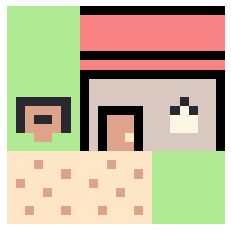

1.0616711770129914


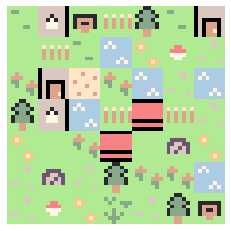

In [39]:
TILE = 'pokemon'
print(twitterFit(fake_map))
showMap(fake_map,'pokemon')
rand_map = makeRandomAscMaps(1)[0]
print(twitterFit(rand_map))
showMap(rand_map,'pokemon')

Step 2.1: Test pretraining

In [40]:
#shows the score distributions on a number line
def showScoreDist(rs,fs,rs2=None,fs2=None,BINARY=False):
    fullset = np.concatenate((rs,fs))
    if rs2 != None:
        fullset = np.concatenate((fullset,rs2))
    if fs2 != None:
        fullset = np.concatenate((fullset,fs2))
    extremeMax = max([abs(x) for x in fullset])+5
    
    fig,axs = plt.subplots(1, 1, figsize=(20,1))
    axs.plot(rs,[0]*len(rs),"x",color='b')
    axs.plot(fs,[0]*len(fs),"x",color='r')
    if rs2 != None:
        axs.plot(rs2,[0]*len(rs2),"x",color='c')
    if fs2 != None:
        axs.plot(fs2,[0]*len(fs2),"x",color='#ffad00')
    
    mean = np.average(fullset)
    axs.plot([mean],[0],'v',color='m')
    if not BINARY:
        plt.xlim(-extremeMax,extremeMax)
        plt.title(f"Fake: ({int(min(fs))},{int(max(fs))}) | Mean: {mean:.2f} | Real: ({int(min(rs))},{int(max(rs))})")
    else:
        plt.xlim(-0.05,1.05)
        plt.title(f"Fake: ({min(fs):.2f},{max(fs):2f}) | Mean: {mean:.2f} | Real: ({min(rs):.2f},{max(rs):.2f})")
    plt.yticks([])
    
    
    plt.show()

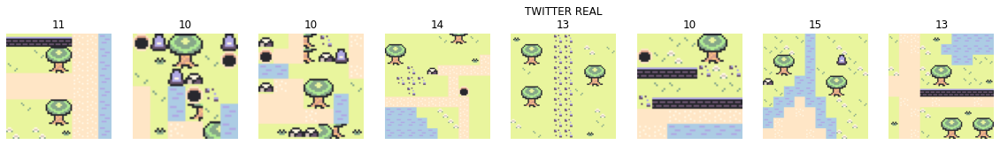

<ipython-input-4-5b5958434762>:11: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(sm)


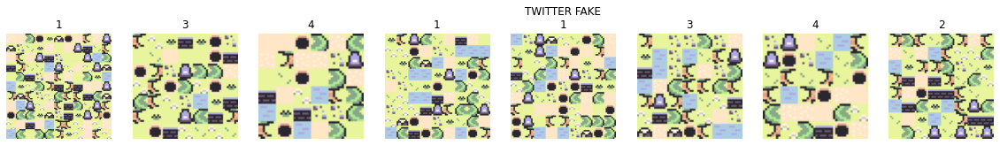

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 2, 2, 64)          4160      
                                                                 
 batch_normalization (BatchN  (None, 2, 2, 64)         256       
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 2, 2, 64)          0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 2, 2, 64)         0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 1, 1, 32)          8224      
                                                                 
 batch_normalization_1 (Batc  (None, 1, 1, 32)         1

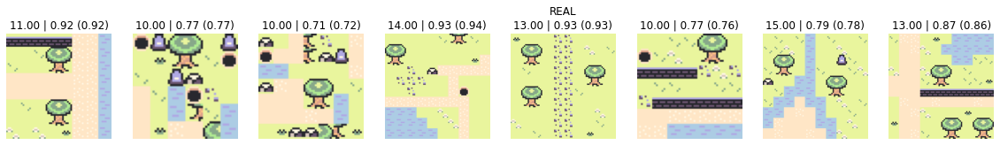

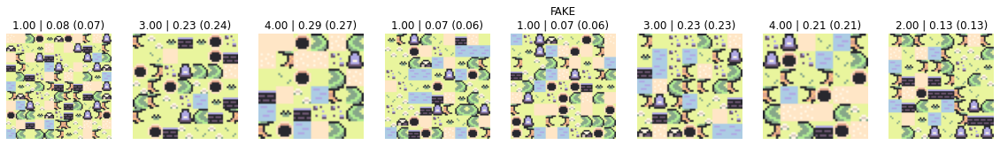

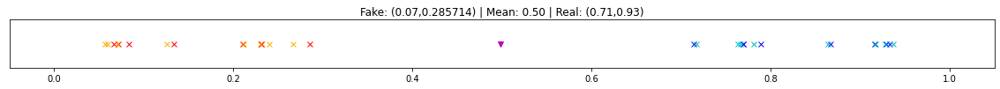

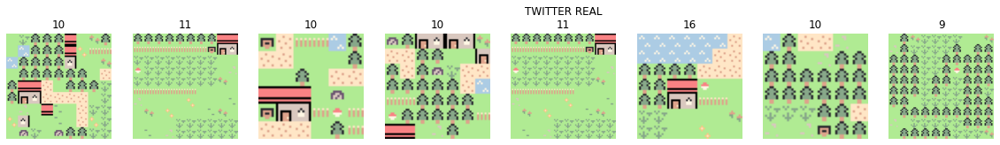

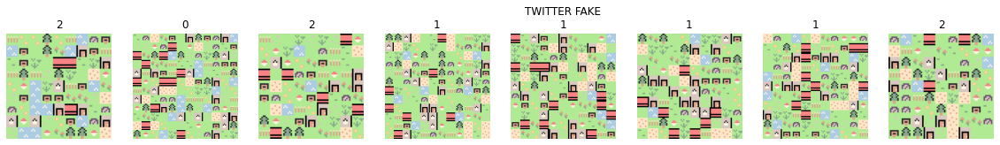

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 2, 2, 64)          4160      
                                                                 
 batch_normalization_3 (Batc  (None, 2, 2, 64)         256       
 hNormalization)                                                 
                                                                 
 re_lu_3 (ReLU)              (None, 2, 2, 64)          0         
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 2, 2, 64)         0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 1, 32)          8224      
                                                                 
 batch_normalization_4 (Batc  (None, 1, 1, 32)        

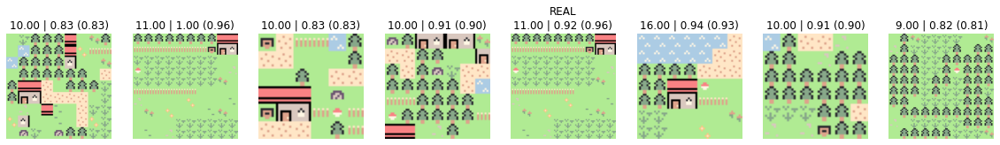

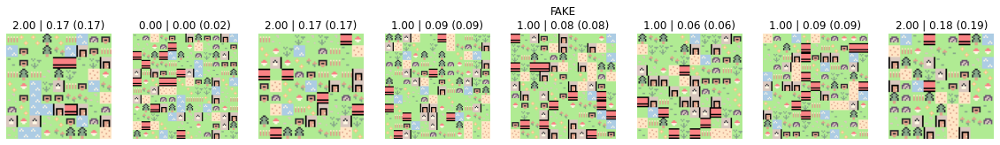

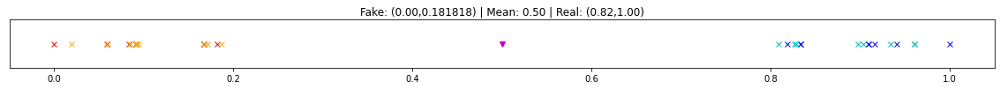

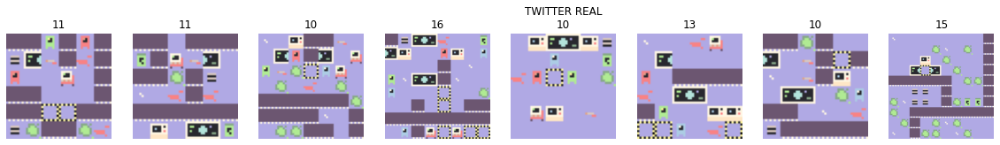

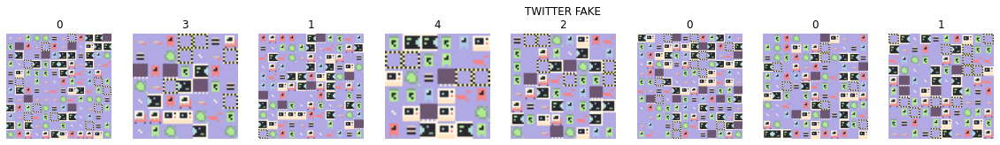

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 2, 2, 64)          4160      
                                                                 
 batch_normalization_6 (Batc  (None, 2, 2, 64)         256       
 hNormalization)                                                 
                                                                 
 re_lu_6 (ReLU)              (None, 2, 2, 64)          0         
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 2, 2, 64)         0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 1, 1, 32)          8224      
                                                                 
 batch_normalization_7 (Batc  (None, 1, 1, 32)        

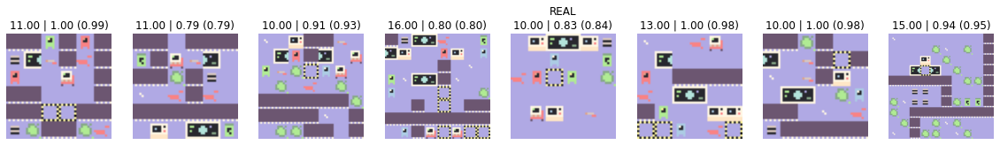

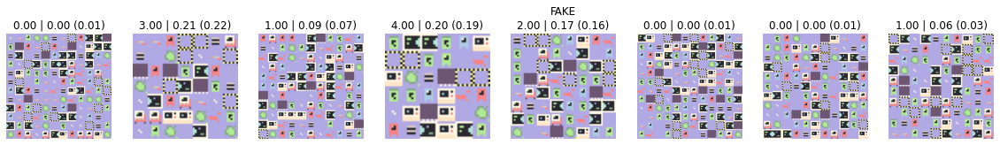

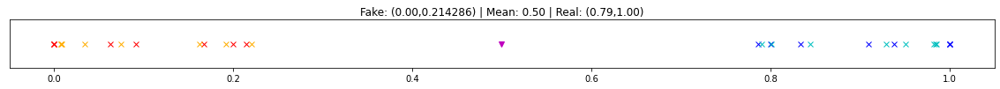

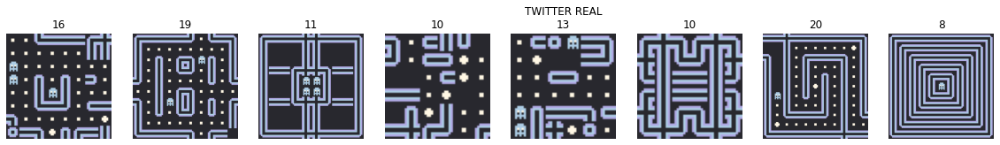

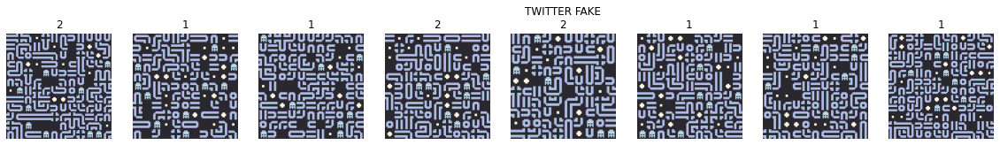

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 2, 2, 64)          4160      
                                                                 
 batch_normalization_9 (Batc  (None, 2, 2, 64)         256       
 hNormalization)                                                 
                                                                 
 re_lu_9 (ReLU)              (None, 2, 2, 64)          0         
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 2, 2, 64)         0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 1, 1, 32)          8224      
                                                                 
 batch_normalization_10 (Bat  (None, 1, 1, 32)        

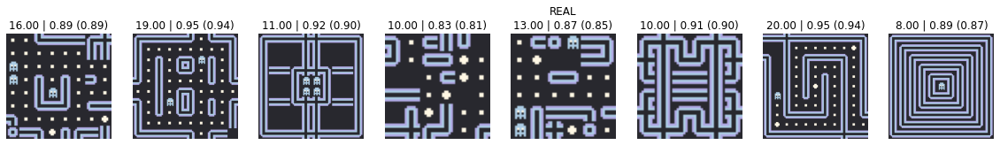

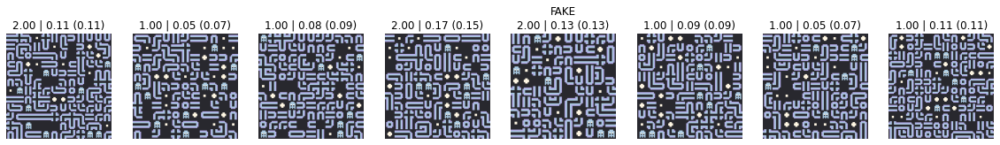

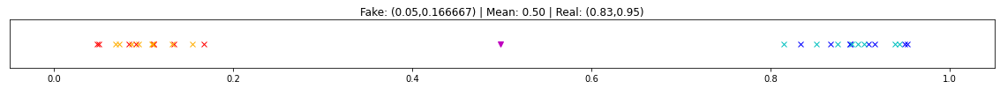

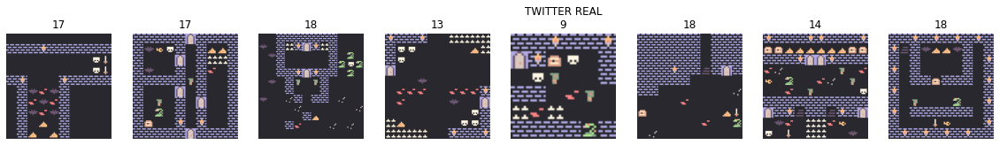

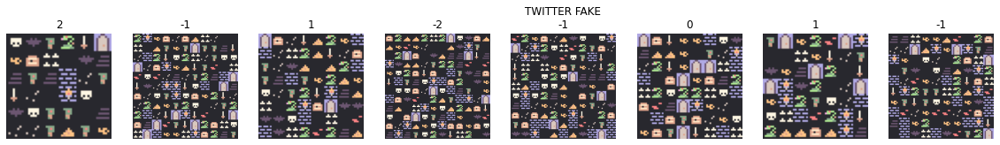

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 2, 2, 64)          4160      
                                                                 
 batch_normalization_12 (Bat  (None, 2, 2, 64)         256       
 chNormalization)                                                
                                                                 
 re_lu_12 (ReLU)             (None, 2, 2, 64)          0         
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 2, 2, 64)         0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 1, 1, 32)          8224      
                                                                 
 batch_normalization_13 (Bat  (None, 1, 1, 32)        

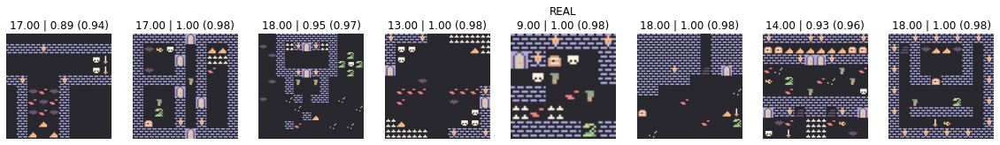

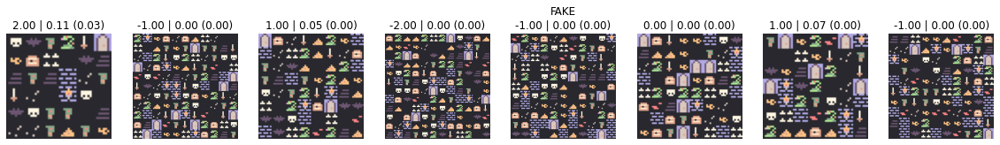

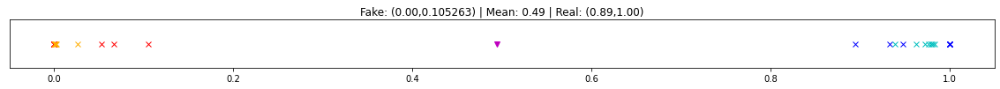

In [41]:
#test on twitter fitness
DEBUG = False
BINARY = True

tset = [zelda_tileset,pokemon_tileset,amongus_tileset,pacman_tileset,dungeon_tileset]
names = ["zelda","pokemon","amongus","pacman","dungeon"]
MAX_LEVELS = 8
for tt,name in zip(tset,names):
    
    TILE = name
    tils = tt

    prereal_maps = random.choices(TRAIN_MAPS[TILE],k=8)
    prereal_scores = [round(twitterFit(m)*TWIT_MULT) for m in prereal_maps]
    showMultiMaps(prereal_maps,TILE,'TWITTER REAL',prereal_scores)

    prefake_maps = makeRandomAscMaps(len(prereal_maps))
    prefake_scores = [round(twitterFit(m)*TWIT_MULT) for m in prefake_maps]
    showMultiMaps(prefake_maps,TILE,'TWITTER FAKE',prefake_scores)


    # test on cnn output
    test_cnn = FitnessCNN(tils,('binary' if BINARY else "whole"))
    test_cnn.reg_model.summary()

    # raw difference
    if not BINARY:
        rs = [prereal_scores[i] - prefake_scores[i] for i in range(len(prereal_scores))]
        fs = [prefake_scores[i] - prereal_scores[i] for i in range(len(prefake_scores))]
    
    # percentage scores
    else:
        rs = []
        fs = []
        for i in range(len(prereal_scores)):
            ri = prereal_scores[i]
            fi = prefake_scores[i]
            total = abs(ri) + abs(fi)
            if fi <= 0:
                rs.append(1.0)
                fs.append(0.0)
            elif ri <= 0:
                fs.append(1.0)
                rs.append(0.0)
            else:
                fs.append(fi/total)
                rs.append(ri/total)
        
    
    test_cnn.train(100,{'real':prereal_maps,'fake':prefake_maps},{'real':rs,'fake':fs})

    cnnreal_scores = test_cnn.eval_map_population(prereal_maps)
    cnnfake_scores = test_cnn.eval_map_population(prefake_maps)

    showMultiMaps(prereal_maps,TILE,'REAL',[f"{prereal_scores[x]:.2f} | {(rs[x]):.2f} ({cnnreal_scores[x]:.2f})" for x in range(len(cnnreal_scores))])
    showMultiMaps(prefake_maps,TILE,'FAKE',[f"{prefake_scores[x]:.2f} | {(fs[x]):.2f} ({cnnfake_scores[x]:.2f})" for x in range(len(cnnfake_scores))])

    #show the distribution of scores
    showScoreDist(rs,fs,cnnreal_scores,cnnfake_scores,BINARY)
    
    test_cnn.exportModel("test_models",TILE)
    

<ipython-input-4-5b5958434762>:11: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(sm)
<__array_function__ internals>:180: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


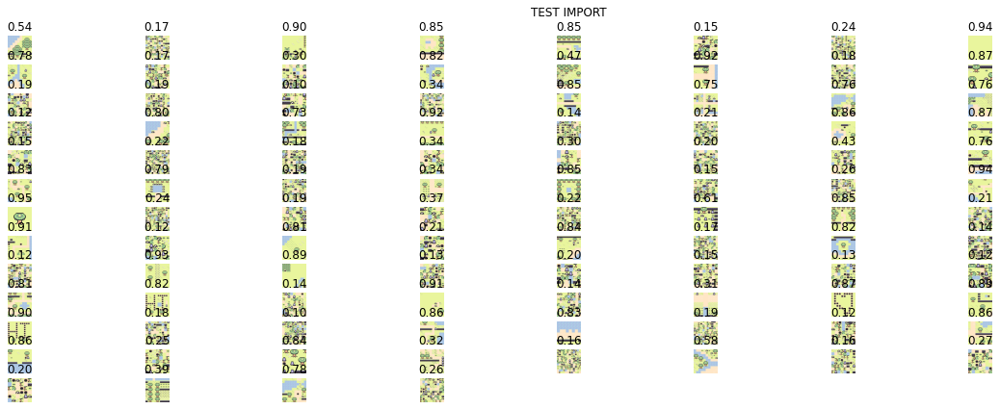

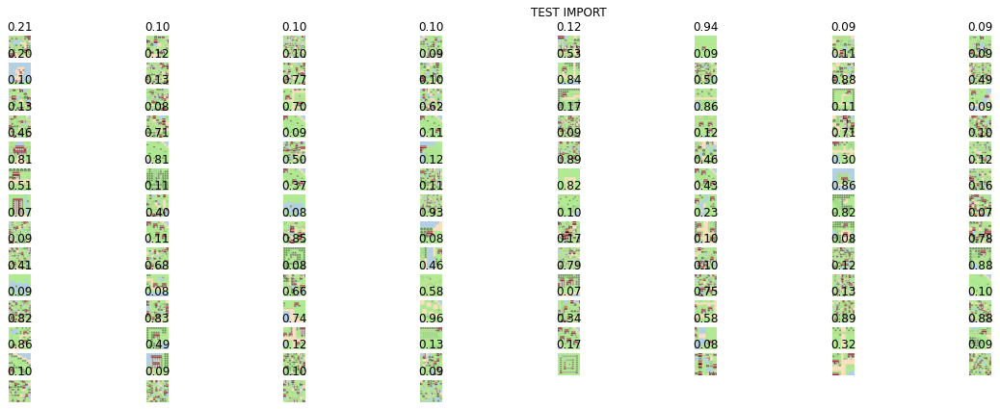

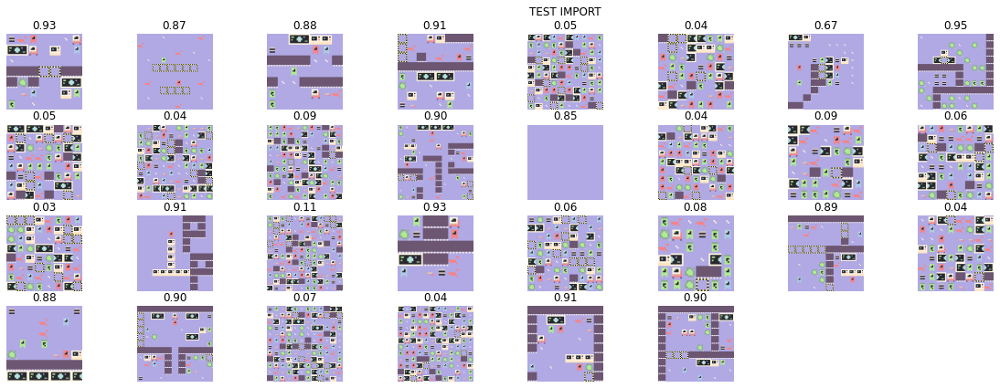

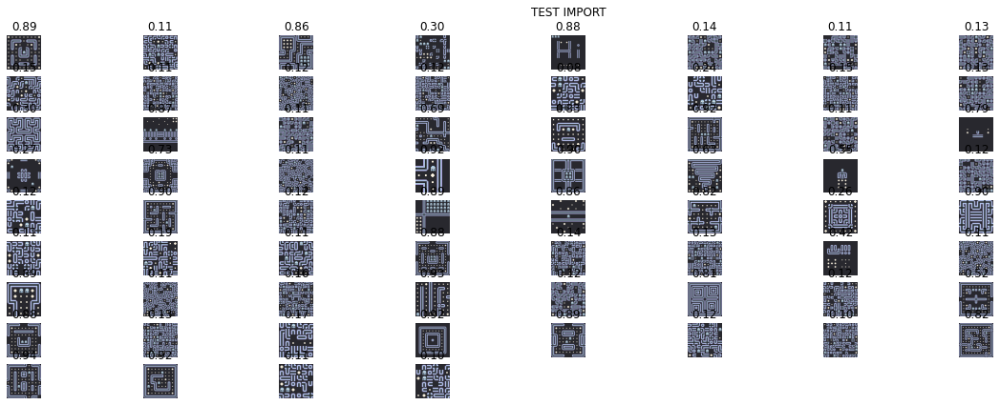

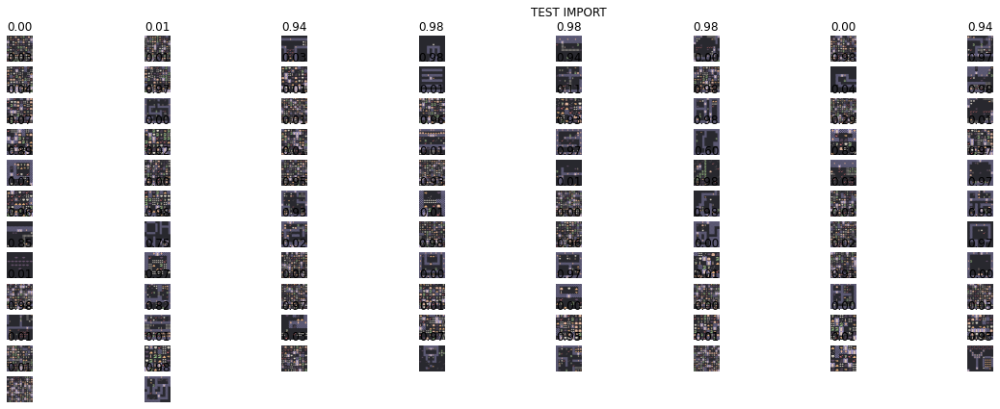

In [42]:
#test import
for tt,name in zip(tset,names):
    
    TILE = name
    tils = tt

    # test on cnn output
    test_cnn = FitnessCNN(tils,('binary' if BINARY else 'whole'))
    test_cnn.importModel("test_models",TILE)
    prereal_maps = USER_LEVELS[TILE][:(len(USER_LEVELS[TILE])//2)]
    prefake_maps = makeRandomAscMaps((len(USER_LEVELS[TILE])//2))
    all_maps = np.concatenate((prereal_maps, prefake_maps),axis=0)
    np.random.shuffle(all_maps)
    cnnim_scores = test_cnn.eval_map_population(all_maps)
    
    showMultiMaps(all_maps,TILE,'Test import',[f"{cnnim_scores[x]:.2f}" for x in range(len(cnnim_scores))])
    

In [43]:
#for showing the fitness of the evolver in between iterations
def showFitnessGraphs2(fitsets,epochs,indexes):
    plt.figure(figsize=(20,3))
    for t in range(len(fitsets)):
        axs = plt.subplot(2, 5, t + 1)
        axs.plot(epochs[t][::10],fitsets[t][::10])   #use every 10th 
        plt.title(f'{indexes[t]}')
    plt.show()

Step 3: Run the experiment

**Tests**

*CONSTANTS*
   - W=0.35 (old 0.5)
   - TWIT_MULT = 3            
   - TWIT_OFFSET = 1  => needs to adjust so that random score ~= - score of real maps
   - TWIT_VAR = 5
   
   - POP_SIZE = 16
   - MUT_RATE = 0.03
   - ALLOW_BLANK = False
   - EVO_EPOCHS = 250
   - ADD_EVO_EPOCHS = 100
   - MIN_FIT_MU = 1.0
   
   - NN_EPOCHS = 10
   - EXP_ITERS = 50
   - PRE_TRAIN_NN_EPOCHS = 100
   
   - MAXimum set TRAINing data
   - NN SIZE 4
   
---
[X] A) Start from blank maps as well (every other iteration)
   - Better maps but not always from blank maps (blank maps start to dominate)

[X] B) Change TPKL-Div weights
   - B1) 0.5 => Large empty-ish maps = training is more curvature and plateaued
   - B2) 0.9 => Considers blank maps/small maps as best
   - B3) 0.6 => Still bonsiders blank maps/small maps as best
   - B4) 0.3 => Small and random but diverse
   - B5) 0.1 => More diverse looking maps
    
[X] C) Equal # of training data (randomly select patterns to match minimum # of patterns in each map)
   - C1) minimum set (reduce maps) => better loss curve
   - C2) maximum set (copy maps)   => even better loss curve
    
[X] D) Train on old data as well
   - => longer to train (needs more iterations); insanely good looking maps ; very critical, but learns better ; loss curve very small


[X] E) Mutate with tile patterns instead
   - => Much better looking maps
    
[X] F) Randomize (normal distribution) twitter multiplier value
   - => more disconnected maps ; inconsistent rating and wavy loss over time ; final loss is small and flat

[X] G) Change the neural network input size (->4, ->3)
   - G1) 4 => Incredibly good looking maps ; actually won some matchups ; great loss curve
   - G2) 3 => Messier/boring looking maps ; chaotic loss curve
 
[X] H) Use minimum rating score to evaluate CNN
   - => smaller maps, harsher eval ; chaotic loss
---
[X] I) Train on user-user pairs + gen-gen pairs as well
   - => better prediction on fitnesses ; wavier loss ; 
   
[X] J) Mu+Lambda change for evolution (less elites in og population)
   - => spikier loss but GREAT looking maps per iteration
   
[X] K) Use percentage values as Y instead of raw vote difference (and reflect real twitter pollings w/ no negatives) : train 50 vote sessions
   - => approaches 50/50 voting quickly ; tiny loss ; maps are meh (mostly blank)
   
[X] L) Use ranked tile pattern selection (and change TP weights [0.7])
   - L1) Binary => Starts to maximize using blank templates mostly ; still predicting at 50/50
   - L2) Whole => Similar result but worse prediction accuracy
   
[X] M) Include entropy in the twitter fitness calculation
   - M1) KLDIV w = 0.7 => much better maps overall but less variance 
   - M2) KLDIV w = 0.35 => meh levels - way more disconnection
   
[X] N) Use winning maps as TP-KLDIV reference and patterning
   - not much improvement... but maps have degraded TPKLDiv quality scoring overall >-<
   
   
---

[ ] O) Use different sets for different purposes and reduce CNN architecture and reset train everytime
   - O1) [PAIR_SET = user, TWIT_SET = profile (Milk, Nifflas), EVO_SET = winner] => bad :P
   - O2) [PAIR_SET = winner, TWIT_SET = winner, EVO_SET = profile (Milk, Nifflas)] => better than first but still meh (for Zelda and Pokemon)
   - O3) Same as above but different KL Weight (0.1 -> 0.85) => MUCH better **ALWAYS USE HIGH WEIGHTING**
   - O4) Same as above but without Binary training =>
    

 -- trials = 1, evo epochs = 250, nn epochs = 10, popsize = 16 --
> zelda tileset
 ------- TRIAL #1 --------


<ipython-input-4-5b5958434762>:11: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(sm)


[TWITTER RESULT] r:31  f:-15 => r:46 f:-46
[TWITTER RESULT] r:15  f:-15 => r:30 f:-30
[TWITTER RESULT] r:25  f:-16 => r:41 f:-41
[TWITTER RESULT] r:22  f:-13 => r:35 f:-35
[TWITTER RESULT] r:30  f:-13 => r:43 f:-43
[TWITTER RESULT] r:14  f:-13 => r:27 f:-27
[TWITTER RESULT] r:24  f:-13 => r:37 f:-37
[TWITTER RESULT] r:18  f:-12 => r:30 f:-30
[TWITTER RESULT] r:16  f:-15 => r:31 f:-31
[TWITTER RESULT] r:20  f:-12 => r:32 f:-32
[TWITTER RESULT] r:28  f:-13 => r:41 f:-41
[TWITTER RESULT] r:23  f:-13 => r:36 f:-36
[TWITTER RESULT] r:22  f:-13 => r:35 f:-35
[TWITTER RESULT] r:28  f:-15 => r:43 f:-43
[TWITTER RESULT] r:2  f:-13 => r:15 f:-15
[TWITTER RESULT] r:29  f:-16 => r:45 f:-45
[TWITTER RESULT] r:27  f:-14 => r:41 f:-41
[TWITTER RESULT] r:22  f:-11 => r:33 f:-33
[TWITTER RESULT] r:22  f:-15 => r:37 f:-37
[TWITTER RESULT] r:16  f:-12 => r:28 f:-28
[TWITTER RESULT] r:4  f:-14 => r:18 f:-18
[TWITTER RESULT] r:23  f:-17 => r:40 f:-40
[TWITTER RESULT] r:30  f:-12 => r:42 f:-42
[TWITTER RESU

<ipython-input-4-5b5958434762>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(sm)


   >> EXP 1 / 100 -- last fitness: 0.00 | last twit score: 0.00 | last loss: 0.0000


  0%|          | 0/250 [00:00<?, ?it/s]<ipython-input-36-58c9b2305946>:47: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.population = np.array(next_gen_pop)
epoch: 250 - fit: 42.95 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 44.69it/s]


[TWITTER RESULT] r:19  f:11 => r:8 f:-8
# real:49 / # fake:9 => 49
   >> EXP 2 / 100 -- last fitness: 42.95 | last twit score: -8.00 | last loss: 14.5477


epoch: 250 - fit: 14.51 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 37.35it/s]


[TWITTER RESULT] r:27  f:8 => r:19 f:-19
# real:113 / # fake:18 => 113
   >> EXP 3 / 100 -- last fitness: 14.51 | last twit score: -19.00 | last loss: 16.1113


epoch: 250 - fit: 10.99 - N: 12.00: 100%|██████████| 250/250 [00:21<00:00, 11.83it/s]


[TWITTER RESULT] r:5  f:12 => r:-7 f:7
# real:162 / # fake:99 => 162
   >> EXP 4 / 100 -- last fitness: 10.99 | last twit score: 7.00 | last loss: 42.3386


epoch: 250 - fit: 12.87 - N: 9.00: 100%|██████████| 250/250 [00:12<00:00, 20.62it/s]


[TWITTER RESULT] r:28  f:14 => r:14 f:-14
# real:211 / # fake:135 => 211
   >> EXP 5 / 100 -- last fitness: 12.87 | last twit score: -14.00 | last loss: 76.2511


epoch: 250 - fit: 8.60 - N: 9.00: 100%|██████████| 250/250 [00:15<00:00, 16.10it/s] 


SHOWING FITNESS GRAPHS


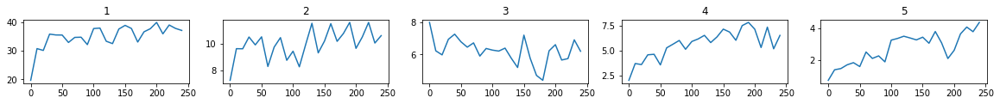

[TWITTER RESULT] r:19  f:11 => r:8 f:-8
# real:247 / # fake:171 => 247
   >> EXP 6 / 100 -- last fitness: 8.60 | last twit score: -8.00 | last loss: 52.8801


epoch: 250 - fit: 15.12 - N: 6.00: 100%|██████████| 250/250 [00:09<00:00, 26.59it/s]


[TWITTER RESULT] r:9  f:4 => r:5 f:-5
# real:272 / # fake:180 => 272
   >> EXP 7 / 100 -- last fitness: 15.12 | last twit score: -5.00 | last loss: 40.7139


epoch: 250 - fit: 9.47 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 25.66it/s]


[TWITTER RESULT] r:27  f:14 => r:13 f:-13
# real:281 / # fake:205 => 281
   >> EXP 8 / 100 -- last fitness: 9.47 | last twit score: -13.00 | last loss: 40.7802


epoch: 250 - fit: 9.30 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 45.58it/s]


[TWITTER RESULT] r:15  f:9 => r:6 f:-6
# real:306 / # fake:214 => 306
   >> EXP 9 / 100 -- last fitness: 9.30 | last twit score: -6.00 | last loss: 35.4093


epoch: 250 - fit: 19.23 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 48.35it/s]


[TWITTER RESULT] r:18  f:12 => r:6 f:-6
# real:355 / # fake:223 => 355
   >> EXP 10 / 100 -- last fitness: 19.23 | last twit score: -6.00 | last loss: 27.2456


epoch: 250 - fit: 14.05 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 46.53it/s]


SHOWING FITNESS GRAPHS


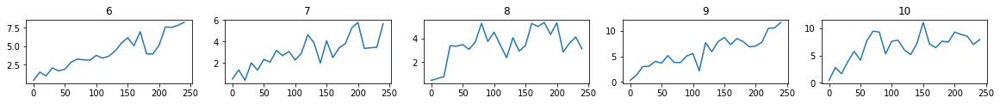

[TWITTER RESULT] r:21  f:9 => r:12 f:-12
# real:371 / # fake:232 => 371
[42.953815, 14.514942, 10.991762, 12.871128, 8.5959015, 15.1160755, 9.47417, 9.302155, 19.226715, 14.054834]


<ipython-input-52-1085056f2266>:212: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  best5_maps = np.array(pre_twit_maps)[best5]


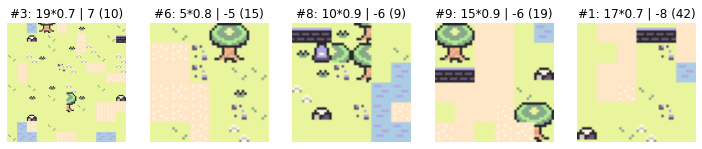

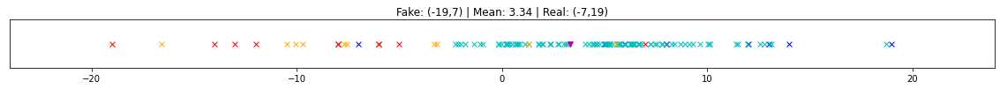

   >> EXP 11 / 100 -- last fitness: 14.05 | last twit score: -12.00 | last loss: 22.2798


epoch: 250 - fit: 9.47 - N: 8.00: 100%|██████████| 250/250 [00:08<00:00, 29.38it/s]


[TWITTER RESULT] r:20  f:10 => r:10 f:-10
# real:420 / # fake:257 => 420
   >> EXP 12 / 100 -- last fitness: 9.47 | last twit score: -10.00 | last loss: 24.0887


epoch: 250 - fit: 10.49 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.04it/s]


[TWITTER RESULT] r:11  f:8 => r:3 f:-3
# real:421 / # fake:273 => 421
   >> EXP 13 / 100 -- last fitness: 10.49 | last twit score: -3.00 | last loss: 19.2880


epoch: 250 - fit: 11.86 - N: 6.88: 100%|██████████| 250/250 [00:06<00:00, 37.24it/s]


[TWITTER RESULT] r:19  f:16 => r:3 f:-3
# real:470 / # fake:289 => 470
   >> EXP 14 / 100 -- last fitness: 11.86 | last twit score: -3.00 | last loss: 18.5598


epoch: 250 - fit: 10.75 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 33.71it/s]


[TWITTER RESULT] r:7  f:13 => r:-6 f:6
# real:551 / # fake:305 => 551
   >> EXP 15 / 100 -- last fitness: 10.75 | last twit score: 6.00 | last loss: 13.9535


epoch: 250 - fit: 13.62 - N: 6.94: 100%|██████████| 250/250 [00:07<00:00, 34.27it/s]


SHOWING FITNESS GRAPHS


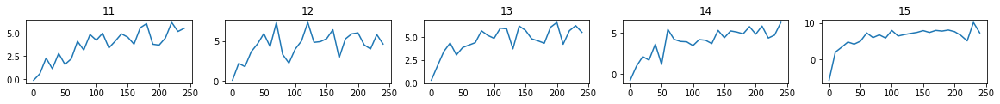

[TWITTER RESULT] r:22  f:2 => r:20 f:-20
# real:560 / # fake:321 => 560
   >> EXP 16 / 100 -- last fitness: 13.62 | last twit score: -20.00 | last loss: 14.3139


epoch: 250 - fit: 10.84 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.04it/s]


[TWITTER RESULT] r:16  f:10 => r:6 f:-6
# real:609 / # fake:337 => 609
   >> EXP 17 / 100 -- last fitness: 10.84 | last twit score: -6.00 | last loss: 12.0964


epoch: 250 - fit: 12.99 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.61it/s]


[TWITTER RESULT] r:8  f:10 => r:-2 f:2
# real:658 / # fake:346 => 658
   >> EXP 18 / 100 -- last fitness: 12.99 | last twit score: 2.00 | last loss: 9.4083


epoch: 250 - fit: 11.95 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.89it/s]


[TWITTER RESULT] r:5  f:8 => r:-3 f:3
# real:739 / # fake:355 => 739
   >> EXP 19 / 100 -- last fitness: 11.95 | last twit score: 3.00 | last loss: 8.0232


epoch: 250 - fit: 6.23 - N: 9.12: 100%|██████████| 250/250 [00:12<00:00, 20.83it/s]


[TWITTER RESULT] r:26  f:7 => r:19 f:-19
# real:788 / # fake:391 => 788
   >> EXP 20 / 100 -- last fitness: 6.23 | last twit score: -19.00 | last loss: 14.4068


epoch: 250 - fit: 8.98 - N: 8.12: 100%|██████████| 250/250 [00:08<00:00, 28.87it/s]


SHOWING FITNESS GRAPHS


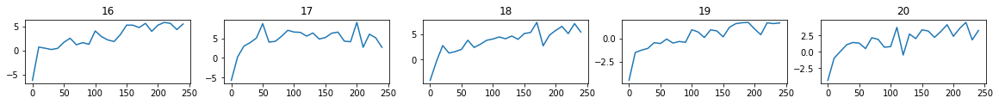

[TWITTER RESULT] r:19  f:11 => r:8 f:-8
# real:837 / # fake:416 => 837
[9.465085, 10.494955, 11.859179, 10.751201, 13.619035, 10.840643, 12.991992, 11.945842, 6.2265573, 8.977445]


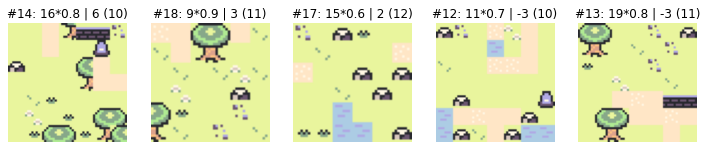

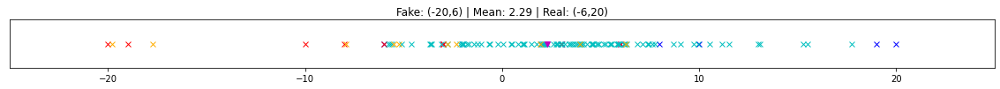

   >> EXP 21 / 100 -- last fitness: 8.98 | last twit score: -8.00 | last loss: 10.8595


epoch: 250 - fit: 14.03 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 41.59it/s]


[TWITTER RESULT] r:24  f:-2 => r:26 f:-26
# real:886 / # fake:425 => 886
   >> EXP 22 / 100 -- last fitness: 14.03 | last twit score: -26.00 | last loss: 14.8070


epoch: 250 - fit: 19.52 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.95it/s]


[TWITTER RESULT] r:20  f:9 => r:11 f:-11
# real:935 / # fake:434 => 935
   >> EXP 23 / 100 -- last fitness: 19.52 | last twit score: -11.00 | last loss: 13.5059


epoch: 250 - fit: 7.11 - N: 11.00: 100%|██████████| 250/250 [00:16<00:00, 14.80it/s]


[TWITTER RESULT] r:12  f:14 => r:-2 f:2
# real:1016 / # fake:498 => 1016
   >> EXP 24 / 100 -- last fitness: 7.11 | last twit score: 2.00 | last loss: 12.1180


epoch: 250 - fit: 12.03 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 45.28it/s]


[TWITTER RESULT] r:16  f:10 => r:6 f:-6
# real:1080 / # fake:507 => 1080
   >> EXP 25 / 100 -- last fitness: 12.03 | last twit score: -6.00 | last loss: 10.7280


epoch: 250 - fit: 14.59 - N: 7.00: 100%|██████████| 250/250 [00:10<00:00, 24.71it/s]


SHOWING FITNESS GRAPHS


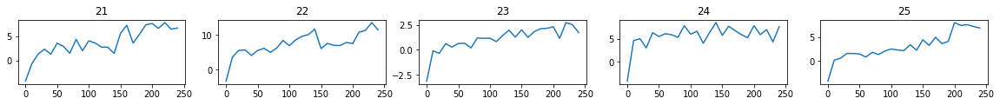

[TWITTER RESULT] r:26  f:15 => r:11 f:-11
# real:1129 / # fake:523 => 1129
   >> EXP 26 / 100 -- last fitness: 14.59 | last twit score: -11.00 | last loss: 10.9022


epoch: 250 - fit: 3.48 - N: 10.00: 100%|██████████| 250/250 [00:13<00:00, 17.94it/s]


[TWITTER RESULT] r:10  f:9 => r:1 f:-1
# real:1210 / # fake:572 => 1210
   >> EXP 27 / 100 -- last fitness: 3.48 | last twit score: -1.00 | last loss: 11.1947


epoch: 250 - fit: 10.04 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 45.83it/s]


[TWITTER RESULT] r:7  f:7 => r:0 f:0
# real:1291 / # fake:581 => 1291
   >> EXP 28 / 100 -- last fitness: 10.04 | last twit score: 0.00 | last loss: 10.1364


epoch: 250 - fit: 12.57 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 43.27it/s]


[TWITTER RESULT] r:1  f:15 => r:-14 f:14
# real:1340 / # fake:590 => 1340
   >> EXP 29 / 100 -- last fitness: 12.57 | last twit score: 14.00 | last loss: 10.9737


epoch: 250 - fit: 11.65 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 25.65it/s]


[TWITTER RESULT] r:0  f:14 => r:-14 f:14
# real:1389 / # fake:615 => 1389
   >> EXP 30 / 100 -- last fitness: 11.65 | last twit score: 14.00 | last loss: 11.4501


epoch: 250 - fit: 7.34 - N: 10.00: 100%|██████████| 250/250 [00:17<00:00, 14.36it/s]


SHOWING FITNESS GRAPHS


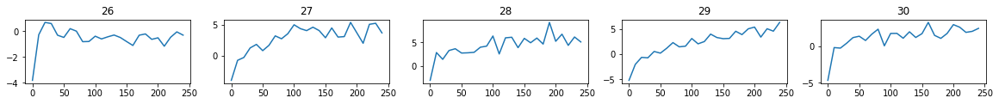

[TWITTER RESULT] r:11  f:12 => r:-1 f:1
# real:1438 / # fake:664 => 1438
[14.028286, 19.516659, 7.111554, 12.032931, 14.589734, 3.4841719, 10.03867, 12.573273, 11.649303, 7.3400207]


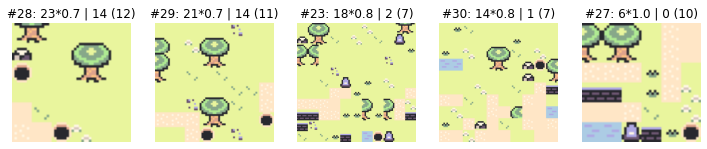

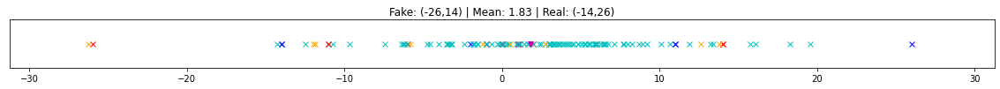

   >> EXP 31 / 100 -- last fitness: 7.34 | last twit score: 1.00 | last loss: 12.9755


epoch: 250 - fit: 14.27 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 45.27it/s]


[TWITTER RESULT] r:22  f:6 => r:16 f:-16
# real:1487 / # fake:673 => 1487
   >> EXP 32 / 100 -- last fitness: 14.27 | last twit score: -16.00 | last loss: 12.3459


epoch: 250 - fit: 7.38 - N: 10.00: 100%|██████████| 250/250 [00:14<00:00, 17.82it/s]


[TWITTER RESULT] r:-2  f:12 => r:-14 f:14
# real:1536 / # fake:722 => 1536
   >> EXP 33 / 100 -- last fitness: 7.38 | last twit score: 14.00 | last loss: 11.2985


epoch: 250 - fit: 6.54 - N: 10.00: 100%|██████████| 250/250 [00:17<00:00, 14.45it/s]


[TWITTER RESULT] r:29  f:12 => r:17 f:-17
# real:1585 / # fake:771 => 1585
   >> EXP 34 / 100 -- last fitness: 6.54 | last twit score: -17.00 | last loss: 15.1775


epoch: 250 - fit: 9.42 - N: 8.00: 100%|██████████| 250/250 [00:08<00:00, 28.82it/s]


[TWITTER RESULT] r:22  f:9 => r:13 f:-13
# real:1634 / # fake:796 => 1634
   >> EXP 35 / 100 -- last fitness: 9.42 | last twit score: -13.00 | last loss: 14.6434


epoch: 250 - fit: 14.14 - N: 6.00: 100%|██████████| 250/250 [00:07<00:00, 34.80it/s]


SHOWING FITNESS GRAPHS


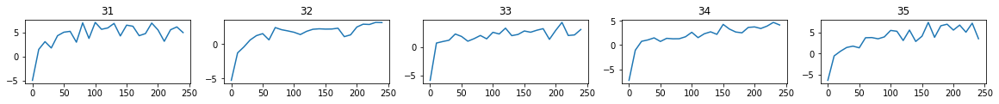

[TWITTER RESULT] r:19  f:8 => r:11 f:-11
# real:1683 / # fake:805 => 1683
   >> EXP 36 / 100 -- last fitness: 14.14 | last twit score: -11.00 | last loss: 14.5521


epoch: 250 - fit: 9.95 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 48.60it/s]


[TWITTER RESULT] r:30  f:10 => r:20 f:-20
# real:1732 / # fake:814 => 1732
   >> EXP 37 / 100 -- last fitness: 9.95 | last twit score: -20.00 | last loss: 15.5212


epoch: 250 - fit: 16.98 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.84it/s]


[TWITTER RESULT] r:24  f:5 => r:19 f:-19
# real:1781 / # fake:823 => 1781
   >> EXP 38 / 100 -- last fitness: 16.98 | last twit score: -19.00 | last loss: 16.2750


epoch: 250 - fit: 14.56 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.19it/s]


[TWITTER RESULT] r:29  f:8 => r:21 f:-21
# real:1830 / # fake:832 => 1830
   >> EXP 39 / 100 -- last fitness: 14.56 | last twit score: -21.00 | last loss: 17.4636


epoch: 250 - fit: 14.74 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 36.30it/s]


[TWITTER RESULT] r:5  f:0 => r:5 f:-5
# real:1879 / # fake:848 => 1879
   >> EXP 40 / 100 -- last fitness: 14.74 | last twit score: -5.00 | last loss: 14.4073


epoch: 250 - fit: 16.50 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.80it/s]


SHOWING FITNESS GRAPHS


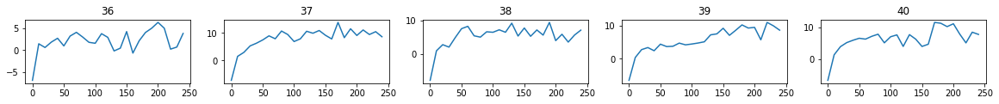

[TWITTER RESULT] r:2  f:10 => r:-8 f:8
# real:1960 / # fake:857 => 1960
[14.271831, 7.3758345, 6.5412674, 9.421092, 14.140791, 9.94905, 16.984154, 14.564119, 14.739784, 16.502234]


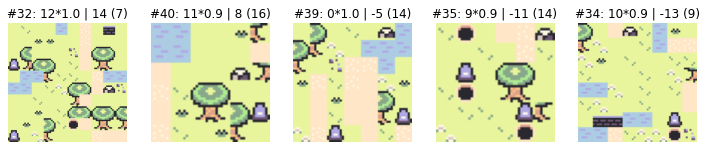

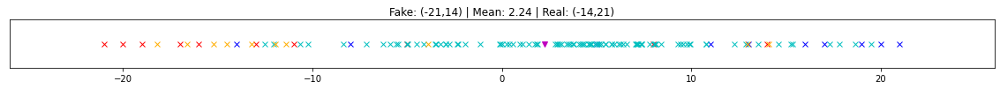

   >> EXP 41 / 100 -- last fitness: 16.50 | last twit score: 8.00 | last loss: 15.7729


epoch: 250 - fit: 17.18 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.98it/s]


[TWITTER RESULT] r:28  f:-3 => r:31 f:-31
# real:2009 / # fake:866 => 2009
   >> EXP 42 / 100 -- last fitness: 17.18 | last twit score: -31.00 | last loss: 19.6264


epoch: 250 - fit: 12.42 - N: 8.06: 100%|██████████| 250/250 [00:08<00:00, 28.93it/s]


[TWITTER RESULT] r:19  f:8 => r:11 f:-11
# real:2073 / # fake:891 => 2073
   >> EXP 43 / 100 -- last fitness: 12.42 | last twit score: -11.00 | last loss: 19.8455


epoch: 250 - fit: 6.45 - N: 11.00: 100%|██████████| 250/250 [00:16<00:00, 15.02it/s]


[TWITTER RESULT] r:11  f:11 => r:0 f:0
# real:2089 / # fake:955 => 2089
   >> EXP 44 / 100 -- last fitness: 6.45 | last twit score: 0.00 | last loss: 17.6578


epoch: 250 - fit: 18.97 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 46.58it/s]


[TWITTER RESULT] r:15  f:9 => r:6 f:-6
# real:2114 / # fake:964 => 2114
   >> EXP 45 / 100 -- last fitness: 18.97 | last twit score: -6.00 | last loss: 15.7065


epoch: 250 - fit: 10.90 - N: 6.81: 100%|██████████| 250/250 [00:06<00:00, 36.82it/s]


SHOWING FITNESS GRAPHS


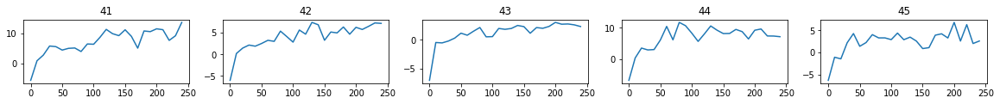

[TWITTER RESULT] r:2  f:5 => r:-3 f:3
# real:2163 / # fake:980 => 2163
   >> EXP 46 / 100 -- last fitness: 10.90 | last twit score: 3.00 | last loss: 17.0302


epoch: 250 - fit: 17.08 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.73it/s]


[TWITTER RESULT] r:16  f:14 => r:2 f:-2
# real:2212 / # fake:996 => 2212
   >> EXP 47 / 100 -- last fitness: 17.08 | last twit score: -2.00 | last loss: 16.5807


epoch: 250 - fit: 9.79 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.42it/s]


[TWITTER RESULT] r:1  f:11 => r:-10 f:10
# real:2261 / # fake:1032 => 2261
   >> EXP 48 / 100 -- last fitness: 9.79 | last twit score: 10.00 | last loss: 15.1689


epoch: 250 - fit: 9.90 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.51it/s]


[TWITTER RESULT] r:21  f:8 => r:13 f:-13
# real:2310 / # fake:1068 => 2310
   >> EXP 49 / 100 -- last fitness: 9.90 | last twit score: -13.00 | last loss: 16.1228


epoch: 250 - fit: 11.39 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 36.05it/s]


[TWITTER RESULT] r:3  f:6 => r:-3 f:3
# real:2359 / # fake:1084 => 2359
   >> EXP 50 / 100 -- last fitness: 11.39 | last twit score: 3.00 | last loss: 15.0452


epoch: 250 - fit: 6.36 - N: 10.00: 100%|██████████| 250/250 [00:14<00:00, 17.80it/s]


SHOWING FITNESS GRAPHS


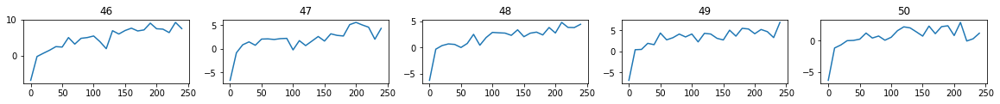

[TWITTER RESULT] r:21  f:9 => r:12 f:-12
# real:2408 / # fake:1133 => 2408
[17.182215, 12.423221, 6.44734, 18.972103, 10.895252, 17.080696, 9.79211, 9.899945, 11.388996, 6.3569193]


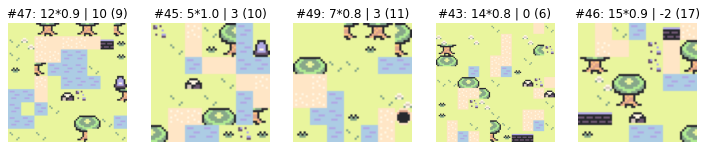

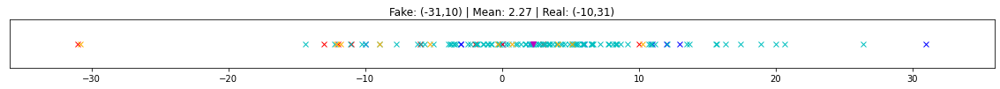

   >> EXP 51 / 100 -- last fitness: 6.36 | last twit score: -12.00 | last loss: 15.5141


epoch: 250 - fit: 17.48 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 49.19it/s]


[TWITTER RESULT] r:3  f:8 => r:-5 f:5
# real:2457 / # fake:1142 => 2457
   >> EXP 52 / 100 -- last fitness: 17.48 | last twit score: 5.00 | last loss: 15.2726


epoch: 250 - fit: 11.35 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.50it/s]


[TWITTER RESULT] r:4  f:8 => r:-4 f:4
# real:2521 / # fake:1151 => 2521
   >> EXP 53 / 100 -- last fitness: 11.35 | last twit score: 4.00 | last loss: 14.9806


epoch: 250 - fit: 11.14 - N: 8.06: 100%|██████████| 250/250 [00:11<00:00, 22.28it/s]


[TWITTER RESULT] r:11  f:12 => r:-1 f:1
# real:2570 / # fake:1176 => 2570
   >> EXP 54 / 100 -- last fitness: 11.14 | last twit score: 1.00 | last loss: 15.2178


epoch: 250 - fit: 12.64 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 45.79it/s]


[TWITTER RESULT] r:24  f:4 => r:20 f:-20
# real:2586 / # fake:1185 => 2586
   >> EXP 55 / 100 -- last fitness: 12.64 | last twit score: -20.00 | last loss: 16.0401


epoch: 250 - fit: 12.92 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.05it/s]


SHOWING FITNESS GRAPHS


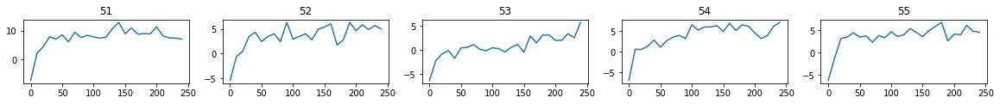

[TWITTER RESULT] r:12  f:5 => r:7 f:-7
# real:2635 / # fake:1194 => 2635
   >> EXP 56 / 100 -- last fitness: 12.92 | last twit score: -7.00 | last loss: 15.0892


epoch: 250 - fit: 6.81 - N: 10.00: 100%|██████████| 250/250 [00:14<00:00, 16.69it/s]


[TWITTER RESULT] r:20  f:13 => r:7 f:-7
# real:2684 / # fake:1243 => 2684
   >> EXP 57 / 100 -- last fitness: 6.81 | last twit score: -7.00 | last loss: 16.2163


epoch: 250 - fit: 13.51 - N: 6.06: 100%|██████████| 250/250 [00:06<00:00, 37.68it/s]


[TWITTER RESULT] r:28  f:-1 => r:29 f:-29
# real:2765 / # fake:1252 => 2765
   >> EXP 58 / 100 -- last fitness: 13.51 | last twit score: -29.00 | last loss: 19.4111


epoch: 250 - fit: 19.74 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 38.06it/s]


[TWITTER RESULT] r:22  f:11 => r:11 f:-11
# real:2814 / # fake:1261 => 2814
   >> EXP 59 / 100 -- last fitness: 19.74 | last twit score: -11.00 | last loss: 18.0214


epoch: 250 - fit: 15.75 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 40.13it/s]


[TWITTER RESULT] r:24  f:7 => r:17 f:-17
# real:2863 / # fake:1270 => 2863
   >> EXP 60 / 100 -- last fitness: 15.75 | last twit score: -17.00 | last loss: 18.5845


epoch: 250 - fit: 20.45 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.20it/s]


SHOWING FITNESS GRAPHS


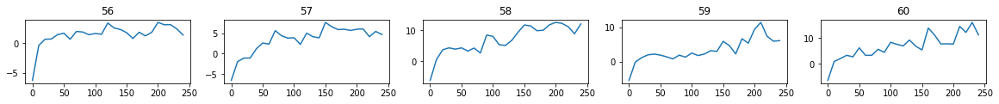

[TWITTER RESULT] r:22  f:9 => r:13 f:-13
# real:2912 / # fake:1279 => 2912
[17.475958, 11.347994, 11.140794, 12.63938, 12.91542, 6.809297, 13.507604, 19.737894, 15.745917, 20.448334]


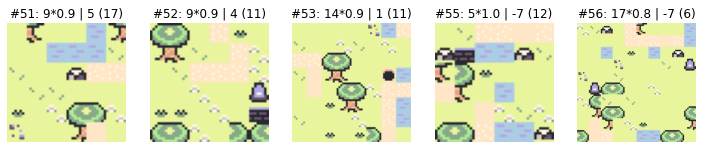

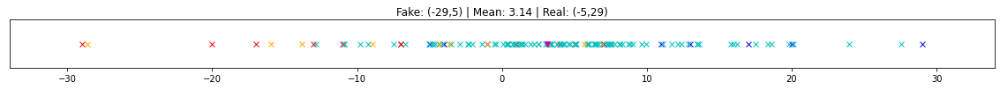

   >> EXP 61 / 100 -- last fitness: 20.45 | last twit score: -13.00 | last loss: 18.1450


epoch: 250 - fit: 15.35 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 36.15it/s]


[TWITTER RESULT] r:19  f:14 => r:5 f:-5
# real:2928 / # fake:1295 => 2928
   >> EXP 62 / 100 -- last fitness: 15.35 | last twit score: -5.00 | last loss: 18.9714


epoch: 250 - fit: 14.98 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 46.83it/s]


[TWITTER RESULT] r:3  f:8 => r:-5 f:5
# real:2977 / # fake:1304 => 2977
   >> EXP 63 / 100 -- last fitness: 14.98 | last twit score: 5.00 | last loss: 17.8102


epoch: 250 - fit: 20.03 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.18it/s]


[TWITTER RESULT] r:4  f:8 => r:-4 f:4
# real:3026 / # fake:1313 => 3026
   >> EXP 64 / 100 -- last fitness: 20.03 | last twit score: 4.00 | last loss: 15.6262


epoch: 250 - fit: 10.91 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.29it/s]


[TWITTER RESULT] r:3  f:8 => r:-5 f:5
# real:3075 / # fake:1329 => 3075
   >> EXP 65 / 100 -- last fitness: 10.91 | last twit score: 5.00 | last loss: 15.6606


epoch: 250 - fit: 8.28 - N: 10.06: 100%|██████████| 250/250 [00:13<00:00, 18.16it/s]


SHOWING FITNESS GRAPHS


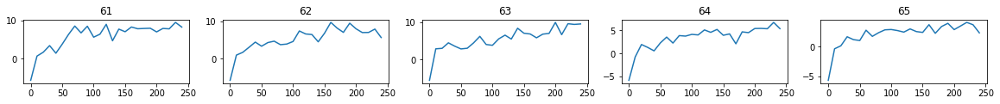

[TWITTER RESULT] r:18  f:10 => r:8 f:-8
# real:3124 / # fake:1378 => 3124
   >> EXP 66 / 100 -- last fitness: 8.28 | last twit score: -8.00 | last loss: 16.0754


epoch: 250 - fit: 10.68 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.39it/s]


[TWITTER RESULT] r:20  f:11 => r:9 f:-9
# real:3173 / # fake:1394 => 3173
   >> EXP 67 / 100 -- last fitness: 10.68 | last twit score: -9.00 | last loss: 16.8289


epoch: 250 - fit: 12.19 - N: 7.00: 100%|██████████| 250/250 [00:08<00:00, 30.25it/s]


[TWITTER RESULT] r:7  f:11 => r:-4 f:4
# real:3222 / # fake:1410 => 3222
   >> EXP 68 / 100 -- last fitness: 12.19 | last twit score: 4.00 | last loss: 16.0468


epoch: 250 - fit: 20.37 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 49.27it/s]


[TWITTER RESULT] r:13  f:10 => r:3 f:-3
# real:3271 / # fake:1419 => 3271
   >> EXP 69 / 100 -- last fitness: 20.37 | last twit score: -3.00 | last loss: 14.9309


epoch: 250 - fit: 4.57 - N: 11.00: 100%|██████████| 250/250 [00:16<00:00, 14.92it/s]


[TWITTER RESULT] r:27  f:7 => r:20 f:-20
# real:3320 / # fake:1483 => 3320
   >> EXP 70 / 100 -- last fitness: 4.57 | last twit score: -20.00 | last loss: 19.1392


epoch: 250 - fit: 11.85 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 49.10it/s]


SHOWING FITNESS GRAPHS


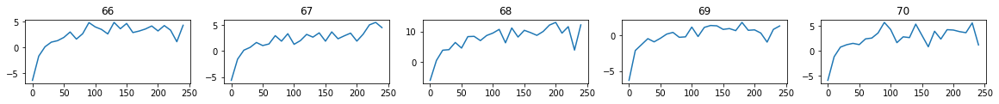

[TWITTER RESULT] r:20  f:11 => r:9 f:-9
# real:3369 / # fake:1492 => 3369
[15.354718, 14.984667, 20.033047, 10.907232, 8.281868, 10.681015, 12.1889515, 20.374653, 4.5719213, 11.850861]


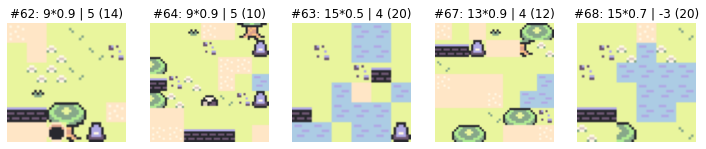

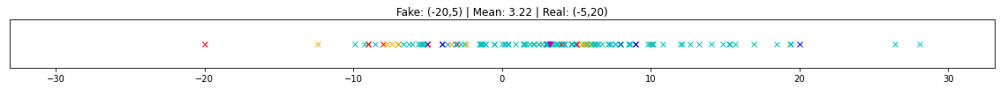

   >> EXP 71 / 100 -- last fitness: 11.85 | last twit score: -9.00 | last loss: 17.9485


epoch: 250 - fit: 12.22 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.08it/s]


[TWITTER RESULT] r:17  f:10 => r:7 f:-7
# real:3418 / # fake:1501 => 3418
   >> EXP 72 / 100 -- last fitness: 12.22 | last twit score: -7.00 | last loss: 17.5015


epoch: 250 - fit: 22.08 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 44.96it/s]


[TWITTER RESULT] r:15  f:11 => r:4 f:-4
# real:3467 / # fake:1510 => 3467
   >> EXP 73 / 100 -- last fitness: 22.08 | last twit score: -4.00 | last loss: 16.5594


epoch: 250 - fit: 5.47 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.13it/s]


[TWITTER RESULT] r:20  f:9 => r:11 f:-11
# real:3516 / # fake:1546 => 3516
   >> EXP 74 / 100 -- last fitness: 5.47 | last twit score: -11.00 | last loss: 17.2770


epoch: 250 - fit: 14.07 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 47.86it/s]


[TWITTER RESULT] r:27  f:13 => r:14 f:-14
# real:3565 / # fake:1555 => 3565
   >> EXP 75 / 100 -- last fitness: 14.07 | last twit score: -14.00 | last loss: 16.7310


epoch: 250 - fit: 6.81 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.61it/s]


SHOWING FITNESS GRAPHS


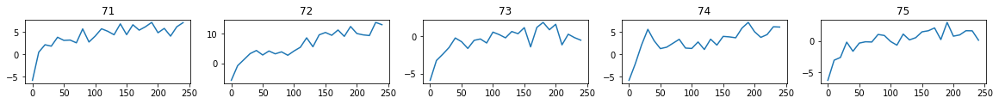

[TWITTER RESULT] r:0  f:10 => r:-10 f:10
# real:3646 / # fake:1591 => 3646
   >> EXP 76 / 100 -- last fitness: 6.81 | last twit score: 10.00 | last loss: 16.5047


epoch: 250 - fit: 16.04 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.97it/s]


[TWITTER RESULT] r:18  f:7 => r:11 f:-11
# real:3695 / # fake:1600 => 3695
   >> EXP 77 / 100 -- last fitness: 16.04 | last twit score: -11.00 | last loss: 16.7705


epoch: 250 - fit: 6.68 - N: 9.06: 100%|██████████| 250/250 [00:15<00:00, 16.06it/s] 


[TWITTER RESULT] r:21  f:15 => r:6 f:-6
# real:3744 / # fake:1636 => 3744
   >> EXP 78 / 100 -- last fitness: 6.68 | last twit score: -6.00 | last loss: 16.7645


epoch: 250 - fit: 1.74 - N: 12.00: 100%|██████████| 250/250 [00:19<00:00, 12.73it/s]


[TWITTER RESULT] r:21  f:11 => r:10 f:-10
# real:3780 / # fake:1717 => 3780
   >> EXP 79 / 100 -- last fitness: 1.74 | last twit score: -10.00 | last loss: 17.4079


epoch: 250 - fit: 14.68 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 46.51it/s]


[TWITTER RESULT] r:20  f:8 => r:12 f:-12
# real:3829 / # fake:1726 => 3829
   >> EXP 80 / 100 -- last fitness: 14.68 | last twit score: -12.00 | last loss: 17.2399


epoch: 250 - fit: 3.77 - N: 11.00: 100%|██████████| 250/250 [00:16<00:00, 14.89it/s]


SHOWING FITNESS GRAPHS


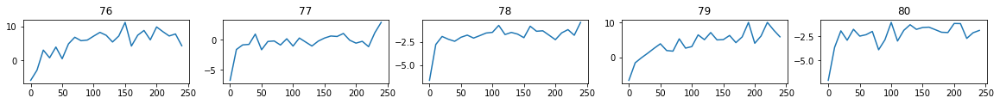

[TWITTER RESULT] r:17  f:16 => r:1 f:-1
# real:3910 / # fake:1790 => 3910
[12.219478, 22.075443, 5.4708147, 14.0663805, 6.814931, 16.04279, 6.6776, 1.7376157, 14.684036, 3.771228]


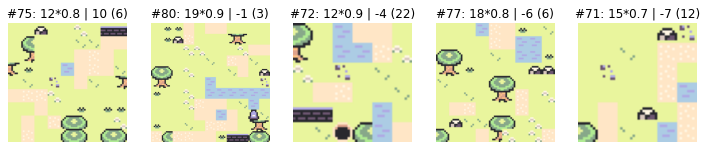

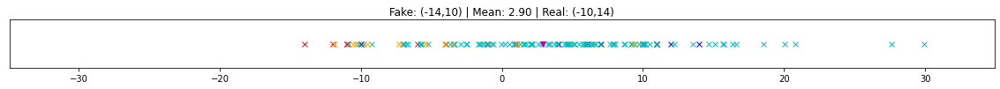

   >> EXP 81 / 100 -- last fitness: 3.77 | last twit score: -1.00 | last loss: 17.0900


epoch: 250 - fit: 6.92 - N: 10.00: 100%|██████████| 250/250 [00:17<00:00, 14.52it/s]


[TWITTER RESULT] r:14  f:11 => r:3 f:-3
# real:3974 / # fake:1839 => 3974
   >> EXP 82 / 100 -- last fitness: 6.92 | last twit score: -3.00 | last loss: 16.6700


epoch: 250 - fit: 7.72 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.86it/s]


[TWITTER RESULT] r:31  f:9 => r:22 f:-22
# real:4023 / # fake:1875 => 4023
   >> EXP 83 / 100 -- last fitness: 7.72 | last twit score: -22.00 | last loss: 19.4528


epoch: 250 - fit: 14.66 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.75it/s]


[TWITTER RESULT] r:-1  f:6 => r:-7 f:7
# real:4104 / # fake:1884 => 4104
   >> EXP 84 / 100 -- last fitness: 14.66 | last twit score: 7.00 | last loss: 16.7506


epoch: 250 - fit: 8.83 - N: 8.00: 100%|██████████| 250/250 [00:08<00:00, 29.79it/s]


[TWITTER RESULT] r:6  f:8 => r:-2 f:2
# real:4129 / # fake:1909 => 4129
   >> EXP 85 / 100 -- last fitness: 8.83 | last twit score: 2.00 | last loss: 16.9425


epoch: 250 - fit: 10.75 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.84it/s]


SHOWING FITNESS GRAPHS


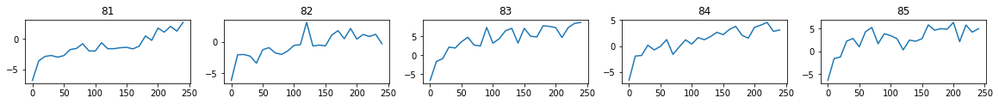

[TWITTER RESULT] r:5  f:13 => r:-8 f:8
# real:4154 / # fake:1925 => 4154
   >> EXP 86 / 100 -- last fitness: 10.75 | last twit score: 8.00 | last loss: 17.1902


epoch: 250 - fit: 15.48 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 31.49it/s]


[TWITTER RESULT] r:-1  f:1 => r:-2 f:2
# real:4235 / # fake:1941 => 4235
   >> EXP 87 / 100 -- last fitness: 15.48 | last twit score: 2.00 | last loss: 16.6053


epoch: 250 - fit: 8.28 - N: 6.88: 100%|██████████| 250/250 [00:07<00:00, 35.04it/s]


[TWITTER RESULT] r:24  f:8 => r:16 f:-16
# real:4284 / # fake:1957 => 4284
   >> EXP 88 / 100 -- last fitness: 8.28 | last twit score: -16.00 | last loss: 16.2441


epoch: 250 - fit: 14.63 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.63it/s]


[TWITTER RESULT] r:17  f:8 => r:9 f:-9
# real:4309 / # fake:1966 => 4309
   >> EXP 89 / 100 -- last fitness: 14.63 | last twit score: -9.00 | last loss: 17.0293


epoch: 250 - fit: 10.93 - N: 8.00: 100%|██████████| 250/250 [00:08<00:00, 28.87it/s]


[TWITTER RESULT] r:18  f:11 => r:7 f:-7
# real:4358 / # fake:1991 => 4358
   >> EXP 90 / 100 -- last fitness: 10.93 | last twit score: -7.00 | last loss: 17.0423


epoch: 250 - fit: 9.61 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 38.35it/s]


SHOWING FITNESS GRAPHS


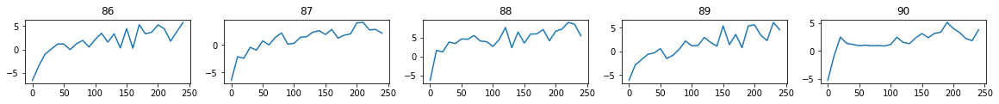

[TWITTER RESULT] r:0  f:9 => r:-9 f:9
# real:4439 / # fake:2007 => 4439
[6.922037, 7.7186413, 14.65649, 8.83193, 10.745086, 15.484393, 8.278707, 14.629003, 10.930377, 9.605784]


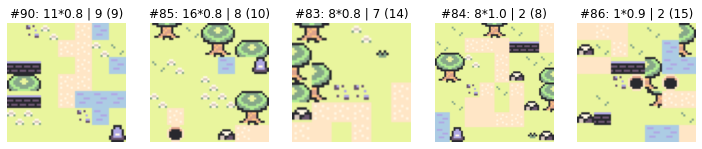

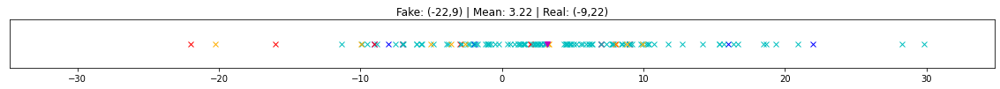

   >> EXP 91 / 100 -- last fitness: 9.61 | last twit score: 9.00 | last loss: 15.8594


epoch: 250 - fit: 12.38 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 46.15it/s]


[TWITTER RESULT] r:1  f:9 => r:-8 f:8
# real:4488 / # fake:2016 => 4488
   >> EXP 92 / 100 -- last fitness: 12.38 | last twit score: 8.00 | last loss: 15.7766


epoch: 250 - fit: 13.25 - N: 7.00: 100%|██████████| 250/250 [00:08<00:00, 29.97it/s]


[TWITTER RESULT] r:26  f:12 => r:14 f:-14
# real:4537 / # fake:2032 => 4537
   >> EXP 93 / 100 -- last fitness: 13.25 | last twit score: -14.00 | last loss: 17.9427


epoch: 250 - fit: 10.85 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 36.61it/s]


[TWITTER RESULT] r:16  f:16 => r:0 f:0
# real:4586 / # fake:2041 => 4586
   >> EXP 94 / 100 -- last fitness: 10.85 | last twit score: 0.00 | last loss: 16.7426


epoch: 250 - fit: 14.92 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 46.67it/s]


[TWITTER RESULT] r:2  f:7 => r:-5 f:5
# real:4635 / # fake:2050 => 4635
   >> EXP 95 / 100 -- last fitness: 14.92 | last twit score: 5.00 | last loss: 16.9123


epoch: 250 - fit: 6.07 - N: 10.00: 100%|██████████| 250/250 [00:15<00:00, 16.43it/s]


SHOWING FITNESS GRAPHS


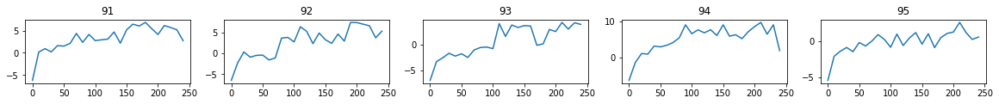

[TWITTER RESULT] r:4  f:11 => r:-7 f:7
# real:4684 / # fake:2099 => 4684
   >> EXP 96 / 100 -- last fitness: 6.07 | last twit score: 7.00 | last loss: 17.8175


epoch: 250 - fit: 9.68 - N: 8.94: 100%|██████████| 250/250 [00:12<00:00, 20.74it/s]


[TWITTER RESULT] r:7  f:12 => r:-5 f:5
# real:4733 / # fake:2135 => 4733
   >> EXP 97 / 100 -- last fitness: 9.68 | last twit score: 5.00 | last loss: 16.8541


epoch: 250 - fit: 2.96 - N: 12.00: 100%|██████████| 250/250 [00:19<00:00, 12.52it/s]


[TWITTER RESULT] r:12  f:11 => r:1 f:-1
# real:4734 / # fake:2216 => 4734
   >> EXP 98 / 100 -- last fitness: 2.96 | last twit score: -1.00 | last loss: 16.2751


epoch: 250 - fit: 5.74 - N: 10.00: 100%|██████████| 250/250 [00:13<00:00, 18.10it/s]


[TWITTER RESULT] r:26  f:5 => r:21 f:-21
# real:4815 / # fake:2265 => 4815
   >> EXP 99 / 100 -- last fitness: 5.74 | last twit score: -21.00 | last loss: 18.0203


epoch: 250 - fit: 7.51 - N: 8.00: 100%|██████████| 250/250 [00:08<00:00, 29.62it/s]


[TWITTER RESULT] r:15  f:7 => r:8 f:-8
# real:4864 / # fake:2290 => 4864
   >> EXP 100 / 100 -- last fitness: 7.51 | last twit score: -8.00 | last loss: 18.6973


epoch: 250 - fit: 3.74 - N: 10.00: 100%|██████████| 250/250 [00:15<00:00, 16.20it/s]


SHOWING FITNESS GRAPHS


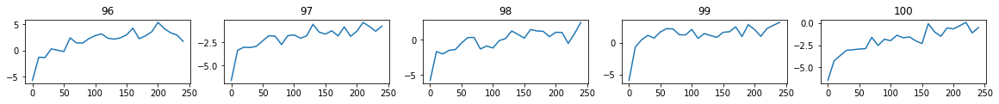

[TWITTER RESULT] r:15  f:9 => r:6 f:-6
# real:4900 / # fake:2339 => 4900
[12.380627, 13.24873, 10.8471, 14.918537, 6.065581, 9.683452, 2.9623713, 5.7365737, 7.506694, 3.7439902]


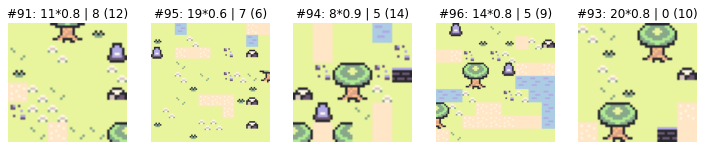

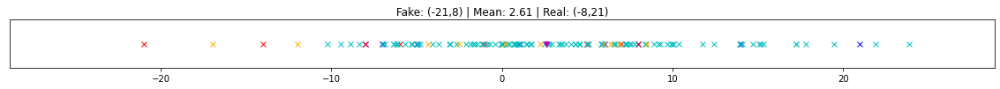

> pokemon tileset
 ------- TRIAL #1 --------
[TWITTER RESULT] r:21  f:-13 => r:34 f:-34
[TWITTER RESULT] r:29  f:-13 => r:42 f:-42
[TWITTER RESULT] r:20  f:-13 => r:33 f:-33
[TWITTER RESULT] r:18  f:-14 => r:32 f:-32
[TWITTER RESULT] r:23  f:-14 => r:37 f:-37
[TWITTER RESULT] r:15  f:-13 => r:28 f:-28
[TWITTER RESULT] r:23  f:-12 => r:35 f:-35
[TWITTER RESULT] r:25  f:-13 => r:38 f:-38
[TWITTER RESULT] r:22  f:-13 => r:35 f:-35
[TWITTER RESULT] r:25  f:-14 => r:39 f:-39
[TWITTER RESULT] r:6  f:-16 => r:22 f:-22
[TWITTER RESULT] r:32  f:-15 => r:47 f:-47
[TWITTER RESULT] r:27  f:-16 => r:43 f:-43
[TWITTER RESULT] r:26  f:-13 => r:39 f:-39
[TWITTER RESULT] r:23  f:-16 => r:39 f:-39
[TWITTER RESULT] r:14  f:-13 => r:27 f:-27
[TWITTER RESULT] r:22  f:-11 => r:33 f:-33
[TWITTER RESULT] r:20  f:-13 => r:33 f:-33
[TWITTER RESULT] r:29  f:-13 => r:42 f:-42
[TWITTER RESULT] r:26  f:-12 => r:38 f:-38
[TWITTER RESULT] r:25  f:-16 => r:41 f:-41
[TWITTER RESULT] r:11  f:-13 => r:24 f:-24
[TWITTER R

epoch: 250 - fit: 44.73 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 36.00it/s]


[TWITTER RESULT] r:10  f:5 => r:5 f:-5
# real:49 / # fake:16 => 49
   >> EXP 2 / 100 -- last fitness: 44.73 | last twit score: -5.00 | last loss: 10.8365


epoch: 250 - fit: 27.57 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.63it/s]


[TWITTER RESULT] r:11  f:12 => r:-1 f:1
# real:98 / # fake:25 => 98
   >> EXP 3 / 100 -- last fitness: 27.57 | last twit score: 1.00 | last loss: 8.6201


epoch: 250 - fit: 15.41 - N: 8.00: 100%|██████████| 250/250 [00:08<00:00, 28.07it/s]


[TWITTER RESULT] r:10  f:7 => r:3 f:-3
# real:147 / # fake:50 => 147
   >> EXP 4 / 100 -- last fitness: 15.41 | last twit score: -3.00 | last loss: 8.1077


epoch: 250 - fit: 4.68 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 27.57it/s]


[TWITTER RESULT] r:17  f:10 => r:7 f:-7
# real:196 / # fake:75 => 196
   >> EXP 5 / 100 -- last fitness: 4.68 | last twit score: -7.00 | last loss: 16.9814


epoch: 250 - fit: 3.78 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 46.13it/s]


SHOWING FITNESS GRAPHS


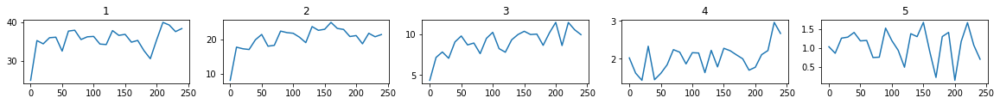

[TWITTER RESULT] r:17  f:12 => r:5 f:-5
# real:245 / # fake:84 => 245
   >> EXP 6 / 100 -- last fitness: 3.78 | last twit score: -5.00 | last loss: 14.6633


epoch: 250 - fit: 10.01 - N: 8.06: 100%|██████████| 250/250 [00:07<00:00, 33.61it/s]


[TWITTER RESULT] r:24  f:-9 => r:33 f:-33
# real:294 / # fake:109 => 294
   >> EXP 7 / 100 -- last fitness: 10.01 | last twit score: -33.00 | last loss: 28.9342


epoch: 250 - fit: 31.65 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.90it/s]


[TWITTER RESULT] r:8  f:2 => r:6 f:-6
# real:343 / # fake:118 => 343
   >> EXP 8 / 100 -- last fitness: 31.65 | last twit score: -6.00 | last loss: 13.5134


epoch: 250 - fit: 19.40 - N: 8.94: 100%|██████████| 250/250 [00:12<00:00, 20.54it/s]


[TWITTER RESULT] r:26  f:12 => r:14 f:-14
# real:392 / # fake:154 => 392
   >> EXP 9 / 100 -- last fitness: 19.40 | last twit score: -14.00 | last loss: 23.0988


epoch: 250 - fit: 16.22 - N: 9.00: 100%|██████████| 250/250 [00:12<00:00, 19.44it/s]


[TWITTER RESULT] r:12  f:10 => r:2 f:-2
# real:441 / # fake:190 => 441
   >> EXP 10 / 100 -- last fitness: 16.22 | last twit score: -2.00 | last loss: 16.3152


epoch: 250 - fit: 9.97 - N: 7.94: 100%|██████████| 250/250 [00:09<00:00, 27.10it/s]


SHOWING FITNESS GRAPHS


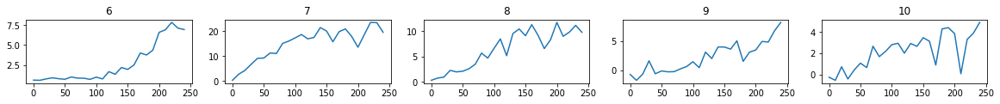

[TWITTER RESULT] r:9  f:11 => r:-2 f:2
# real:490 / # fake:215 => 490
[44.72603, 27.567423, 15.414377, 4.682829, 3.7751868, 10.0062275, 31.64559, 19.395618, 16.224958, 9.968093]


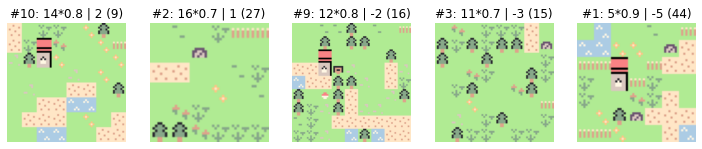

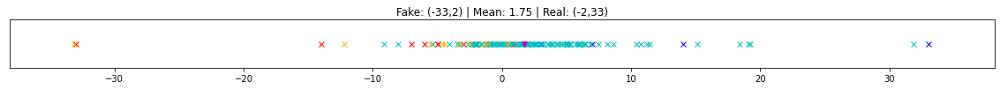

   >> EXP 11 / 100 -- last fitness: 9.97 | last twit score: 2.00 | last loss: 13.5726


epoch: 250 - fit: 3.71 - N: 10.00: 100%|██████████| 250/250 [00:15<00:00, 16.06it/s]


[TWITTER RESULT] r:16  f:9 => r:7 f:-7
# real:554 / # fake:264 => 554
   >> EXP 12 / 100 -- last fitness: 3.71 | last twit score: -7.00 | last loss: 14.8108


epoch: 250 - fit: 0.67 - N: 8.94: 100%|██████████| 250/250 [00:12<00:00, 20.49it/s]


[TWITTER RESULT] r:8  f:11 => r:-3 f:3
# real:635 / # fake:300 => 635
   >> EXP 13 / 100 -- last fitness: 0.67 | last twit score: 3.00 | last loss: 11.6273


epoch: 250 - fit: 5.50 - N: 9.00: 100%|██████████| 250/250 [00:12<00:00, 20.33it/s]


[TWITTER RESULT] r:20  f:11 => r:9 f:-9
# real:644 / # fake:336 => 644
   >> EXP 14 / 100 -- last fitness: 5.50 | last twit score: -9.00 | last loss: 9.7205


epoch: 250 - fit: 4.67 - N: 10.00: 100%|██████████| 250/250 [00:14<00:00, 16.80it/s]


[TWITTER RESULT] r:11  f:11 => r:0 f:0
# real:725 / # fake:385 => 725
   >> EXP 15 / 100 -- last fitness: 4.67 | last twit score: 0.00 | last loss: 9.4473


epoch: 250 - fit: 7.00 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 25.70it/s]


SHOWING FITNESS GRAPHS


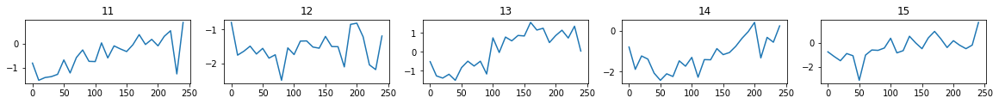

[TWITTER RESULT] r:-4  f:11 => r:-15 f:15
# real:774 / # fake:410 => 774
   >> EXP 16 / 100 -- last fitness: 7.00 | last twit score: 15.00 | last loss: 8.7279


epoch: 250 - fit: 31.42 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.05it/s]


[TWITTER RESULT] r:22  f:14 => r:8 f:-8
# real:823 / # fake:419 => 823
   >> EXP 17 / 100 -- last fitness: 31.42 | last twit score: -8.00 | last loss: 16.5806


epoch: 250 - fit: 10.30 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.73it/s]


[TWITTER RESULT] r:19  f:4 => r:15 f:-15
# real:872 / # fake:428 => 872
   >> EXP 18 / 100 -- last fitness: 10.30 | last twit score: -15.00 | last loss: 18.2530


epoch: 250 - fit: 1.61 - N: 11.00: 100%|██████████| 250/250 [00:18<00:00, 13.70it/s]


[TWITTER RESULT] r:10  f:12 => r:-2 f:2
# real:921 / # fake:492 => 921
   >> EXP 19 / 100 -- last fitness: 1.61 | last twit score: 2.00 | last loss: 15.7561


epoch: 250 - fit: 11.79 - N: 7.00: 100%|██████████| 250/250 [00:09<00:00, 27.70it/s]


[TWITTER RESULT] r:18  f:14 => r:4 f:-4
# real:970 / # fake:508 => 970
   >> EXP 20 / 100 -- last fitness: 11.79 | last twit score: -4.00 | last loss: 15.3488


epoch: 250 - fit: 9.24 - N: 6.88: 100%|██████████| 250/250 [00:07<00:00, 31.87it/s]


SHOWING FITNESS GRAPHS


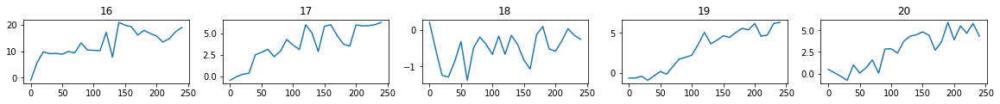

[TWITTER RESULT] r:20  f:9 => r:11 f:-11
# real:1019 / # fake:524 => 1019
[3.7116618, 0.67498165, 5.5032344, 4.6687593, 6.9986854, 31.421017, 10.300856, 1.6054733, 11.788393, 9.23878]


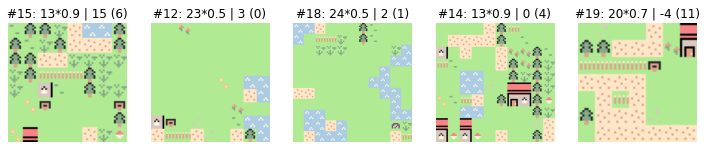

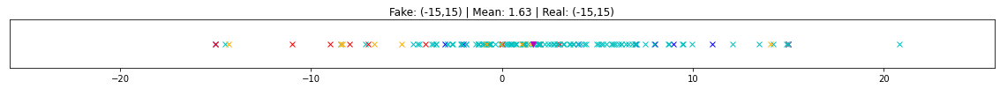

   >> EXP 21 / 100 -- last fitness: 9.24 | last twit score: -11.00 | last loss: 15.6587


epoch: 250 - fit: 2.18 - N: 9.00: 100%|██████████| 250/250 [00:12<00:00, 20.69it/s]


[TWITTER RESULT] r:20  f:9 => r:11 f:-11
# real:1068 / # fake:560 => 1068
   >> EXP 22 / 100 -- last fitness: 2.18 | last twit score: -11.00 | last loss: 15.6545


epoch: 250 - fit: 2.45 - N: 9.00: 100%|██████████| 250/250 [00:12<00:00, 19.85it/s]


[TWITTER RESULT] r:17  f:10 => r:7 f:-7
# real:1117 / # fake:596 => 1117
   >> EXP 23 / 100 -- last fitness: 2.45 | last twit score: -7.00 | last loss: 15.5414


epoch: 250 - fit: 14.83 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 45.53it/s]


[TWITTER RESULT] r:24  f:10 => r:14 f:-14
# real:1166 / # fake:605 => 1166
   >> EXP 24 / 100 -- last fitness: 14.83 | last twit score: -14.00 | last loss: 14.5410


epoch: 250 - fit: 9.26 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 46.15it/s]


[TWITTER RESULT] r:25  f:-8 => r:33 f:-33
# real:1215 / # fake:614 => 1215
   >> EXP 25 / 100 -- last fitness: 9.26 | last twit score: -33.00 | last loss: 25.1865


epoch: 250 - fit: 16.95 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.84it/s]


SHOWING FITNESS GRAPHS


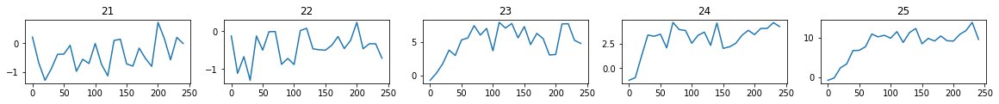

[TWITTER RESULT] r:6  f:1 => r:5 f:-5
# real:1264 / # fake:623 => 1264
   >> EXP 26 / 100 -- last fitness: 16.95 | last twit score: -5.00 | last loss: 19.3433


epoch: 250 - fit: 17.76 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 45.59it/s]


[TWITTER RESULT] r:13  f:3 => r:10 f:-10
# real:1345 / # fake:632 => 1345
   >> EXP 27 / 100 -- last fitness: 17.76 | last twit score: -10.00 | last loss: 16.6972


epoch: 250 - fit: 19.27 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 42.62it/s]


[TWITTER RESULT] r:6  f:3 => r:3 f:-3
# real:1409 / # fake:641 => 1409
   >> EXP 28 / 100 -- last fitness: 19.27 | last twit score: -3.00 | last loss: 16.2679


epoch: 250 - fit: 25.04 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 36.25it/s]


[TWITTER RESULT] r:5  f:12 => r:-7 f:7
# real:1490 / # fake:650 => 1490
   >> EXP 29 / 100 -- last fitness: 25.04 | last twit score: 7.00 | last loss: 16.2291


epoch: 250 - fit: 26.16 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 34.87it/s]


[TWITTER RESULT] r:22  f:8 => r:14 f:-14
# real:1554 / # fake:666 => 1554
   >> EXP 30 / 100 -- last fitness: 26.16 | last twit score: -14.00 | last loss: 18.9390


epoch: 250 - fit: 8.68 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.10it/s]


SHOWING FITNESS GRAPHS


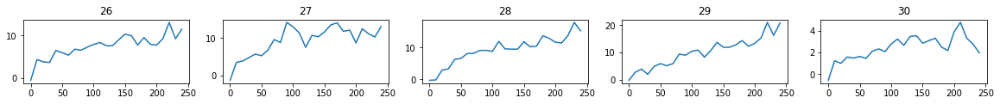

[TWITTER RESULT] r:19  f:10 => r:9 f:-9
# real:1635 / # fake:702 => 1635
[2.1757398, 2.4478161, 14.830222, 9.263709, 16.9522, 17.7616, 19.273775, 25.044018, 26.163433, 8.680462]


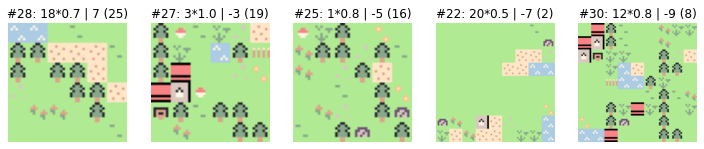

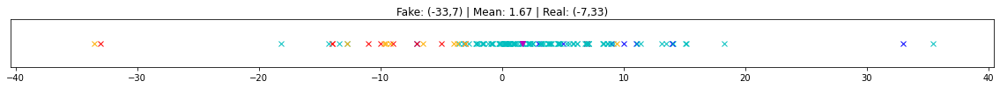

   >> EXP 31 / 100 -- last fitness: 8.68 | last twit score: -9.00 | last loss: 16.8896


epoch: 250 - fit: 21.89 - N: 6.06: 100%|██████████| 250/250 [00:06<00:00, 39.68it/s]


[TWITTER RESULT] r:13  f:3 => r:10 f:-10
# real:1684 / # fake:711 => 1684
   >> EXP 32 / 100 -- last fitness: 21.89 | last twit score: -10.00 | last loss: 15.5742


epoch: 250 - fit: 11.91 - N: 6.88: 100%|██████████| 250/250 [00:07<00:00, 35.31it/s]


[TWITTER RESULT] r:-1  f:10 => r:-11 f:11
# real:1748 / # fake:727 => 1748
   >> EXP 33 / 100 -- last fitness: 11.91 | last twit score: 11.00 | last loss: 15.0746


epoch: 250 - fit: 25.72 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 40.27it/s]


[TWITTER RESULT] r:28  f:13 => r:15 f:-15
# real:1764 / # fake:736 => 1764
   >> EXP 34 / 100 -- last fitness: 25.72 | last twit score: -15.00 | last loss: 15.0051


epoch: 250 - fit: 9.32 - N: 8.00: 100%|██████████| 250/250 [00:13<00:00, 19.19it/s]


[TWITTER RESULT] r:10  f:7 => r:3 f:-3
# real:1845 / # fake:761 => 1845
   >> EXP 35 / 100 -- last fitness: 9.32 | last twit score: -3.00 | last loss: 14.9525


epoch: 250 - fit: 14.15 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 41.72it/s]


SHOWING FITNESS GRAPHS


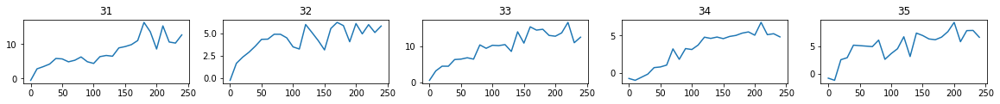

[TWITTER RESULT] r:-5  f:-2 => r:-3 f:3
# real:1894 / # fake:770 => 1894
   >> EXP 36 / 100 -- last fitness: 14.15 | last twit score: 3.00 | last loss: 14.0613


epoch: 250 - fit: 11.73 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 46.04it/s]


[TWITTER RESULT] r:10  f:8 => r:2 f:-2
# real:1958 / # fake:779 => 1958
   >> EXP 37 / 100 -- last fitness: 11.73 | last twit score: -2.00 | last loss: 12.5792


epoch: 250 - fit: 21.60 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.56it/s]


[TWITTER RESULT] r:6  f:5 => r:1 f:-1
# real:2039 / # fake:788 => 2039
   >> EXP 38 / 100 -- last fitness: 21.60 | last twit score: -1.00 | last loss: 12.4663


epoch: 250 - fit: 11.80 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 45.38it/s]


[TWITTER RESULT] r:20  f:12 => r:8 f:-8
# real:2120 / # fake:797 => 2120
   >> EXP 39 / 100 -- last fitness: 11.80 | last twit score: -8.00 | last loss: 12.7573


epoch: 250 - fit: 14.57 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 33.44it/s]


[TWITTER RESULT] r:13  f:6 => r:7 f:-7
# real:2169 / # fake:813 => 2169
   >> EXP 40 / 100 -- last fitness: 14.57 | last twit score: -7.00 | last loss: 11.8776


epoch: 250 - fit: 6.29 - N: 11.00: 100%|██████████| 250/250 [00:18<00:00, 13.49it/s]


SHOWING FITNESS GRAPHS


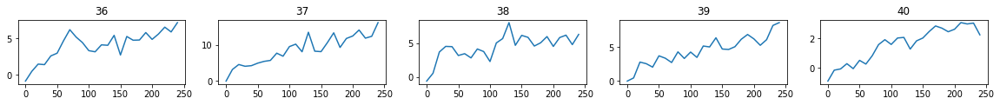

[TWITTER RESULT] r:8  f:14 => r:-6 f:6
# real:2218 / # fake:877 => 2218
[21.885607, 11.908274, 25.719954, 9.32243, 14.151779, 11.727571, 21.59709, 11.801958, 14.565475, 6.2893867]


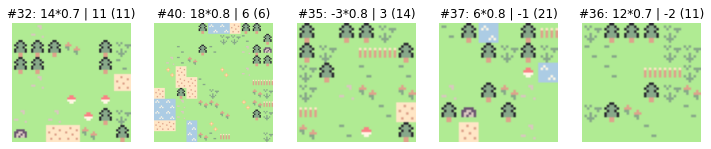

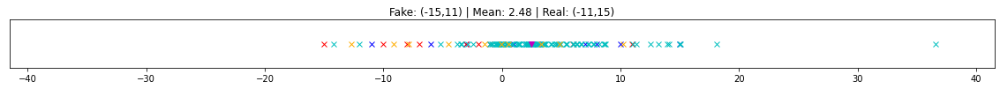

   >> EXP 41 / 100 -- last fitness: 6.29 | last twit score: 6.00 | last loss: 12.2528


epoch: 250 - fit: 10.69 - N: 7.06: 100%|██████████| 250/250 [00:07<00:00, 34.06it/s]


[TWITTER RESULT] r:10  f:9 => r:1 f:-1
# real:2267 / # fake:893 => 2267
   >> EXP 42 / 100 -- last fitness: 10.69 | last twit score: -1.00 | last loss: 12.2047


epoch: 250 - fit: 11.47 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 41.75it/s]


[TWITTER RESULT] r:18  f:9 => r:9 f:-9
# real:2316 / # fake:902 => 2316
   >> EXP 43 / 100 -- last fitness: 11.47 | last twit score: -9.00 | last loss: 11.8596


epoch: 250 - fit: 3.80 - N: 12.00: 100%|██████████| 250/250 [00:20<00:00, 12.16it/s]


[TWITTER RESULT] r:22  f:13 => r:9 f:-9
# real:2365 / # fake:983 => 2365
   >> EXP 44 / 100 -- last fitness: 3.80 | last twit score: -9.00 | last loss: 13.2831


epoch: 250 - fit: 13.10 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.25it/s]


[TWITTER RESULT] r:25  f:6 => r:19 f:-19
# real:2414 / # fake:992 => 2414
   >> EXP 45 / 100 -- last fitness: 13.10 | last twit score: -19.00 | last loss: 13.4613


epoch: 250 - fit: 13.66 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 46.22it/s]


SHOWING FITNESS GRAPHS


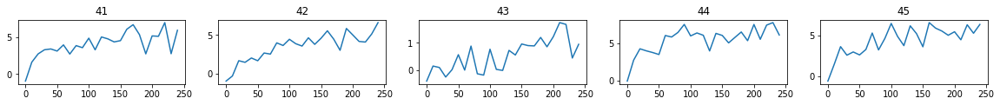

[TWITTER RESULT] r:10  f:9 => r:1 f:-1
# real:2495 / # fake:1001 => 2495
   >> EXP 46 / 100 -- last fitness: 13.66 | last twit score: -1.00 | last loss: 12.4318


epoch: 250 - fit: 5.81 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 26.92it/s]


[TWITTER RESULT] r:-3  f:13 => r:-16 f:16
# real:2544 / # fake:1026 => 2544
   >> EXP 47 / 100 -- last fitness: 5.81 | last twit score: 16.00 | last loss: 13.3486


epoch: 250 - fit: 5.94 - N: 10.00: 100%|██████████| 250/250 [00:15<00:00, 16.51it/s]


[TWITTER RESULT] r:10  f:7 => r:3 f:-3
# real:2593 / # fake:1075 => 2593
   >> EXP 48 / 100 -- last fitness: 5.94 | last twit score: -3.00 | last loss: 12.5994


epoch: 250 - fit: 8.18 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 26.23it/s]


[TWITTER RESULT] r:8  f:15 => r:-7 f:7
# real:2642 / # fake:1100 => 2642
   >> EXP 49 / 100 -- last fitness: 8.18 | last twit score: 7.00 | last loss: 12.7881


epoch: 250 - fit: 10.53 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 25.71it/s]


[TWITTER RESULT] r:12  f:10 => r:2 f:-2
# real:2691 / # fake:1125 => 2691
   >> EXP 50 / 100 -- last fitness: 10.53 | last twit score: -2.00 | last loss: 12.0358


epoch: 250 - fit: 10.51 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 34.97it/s]


SHOWING FITNESS GRAPHS


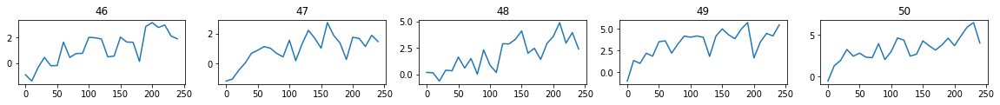

[TWITTER RESULT] r:11  f:11 => r:0 f:0
# real:2740 / # fake:1141 => 2740
[10.690222, 11.467524, 3.80198, 13.097663, 13.661748, 5.8078637, 5.9438925, 8.181959, 10.529675, 10.506359]


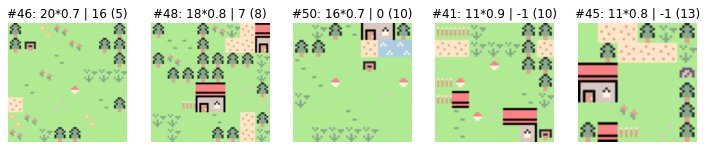

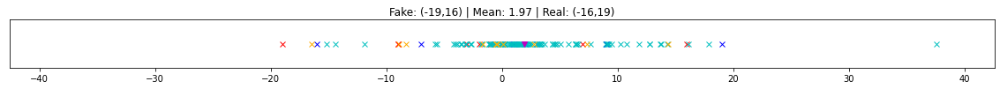

   >> EXP 51 / 100 -- last fitness: 10.51 | last twit score: 0.00 | last loss: 12.0364


epoch: 250 - fit: 12.58 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 39.05it/s]


[TWITTER RESULT] r:20  f:12 => r:8 f:-8
# real:2789 / # fake:1150 => 2789
   >> EXP 52 / 100 -- last fitness: 12.58 | last twit score: -8.00 | last loss: 12.5463


epoch: 250 - fit: 10.47 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 40.88it/s]


[TWITTER RESULT] r:20  f:8 => r:12 f:-12
# real:2838 / # fake:1159 => 2838
   >> EXP 53 / 100 -- last fitness: 10.47 | last twit score: -12.00 | last loss: 12.9044


epoch: 250 - fit: 17.75 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.85it/s]


[TWITTER RESULT] r:28  f:10 => r:18 f:-18
# real:2887 / # fake:1168 => 2887
   >> EXP 54 / 100 -- last fitness: 17.75 | last twit score: -18.00 | last loss: 13.8138


epoch: 250 - fit: 15.45 - N: 6.94: 100%|██████████| 250/250 [00:07<00:00, 34.76it/s]


[TWITTER RESULT] r:17  f:11 => r:6 f:-6
# real:2936 / # fake:1184 => 2936
   >> EXP 55 / 100 -- last fitness: 15.45 | last twit score: -6.00 | last loss: 13.1288


epoch: 250 - fit: 5.71 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.47it/s]


SHOWING FITNESS GRAPHS


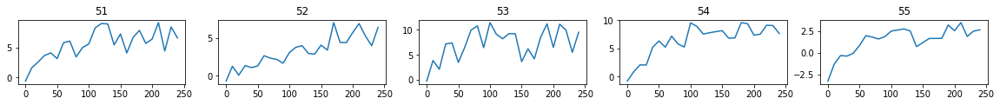

[TWITTER RESULT] r:14  f:3 => r:11 f:-11
# real:3017 / # fake:1220 => 3017
   >> EXP 56 / 100 -- last fitness: 5.71 | last twit score: -11.00 | last loss: 13.9181


epoch: 250 - fit: 10.35 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 47.97it/s]


[TWITTER RESULT] r:16  f:6 => r:10 f:-10
# real:3042 / # fake:1229 => 3042
   >> EXP 57 / 100 -- last fitness: 10.35 | last twit score: -10.00 | last loss: 12.8140


epoch: 250 - fit: 17.42 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 47.95it/s]


[TWITTER RESULT] r:24  f:2 => r:22 f:-22
# real:3091 / # fake:1238 => 3091
   >> EXP 58 / 100 -- last fitness: 17.42 | last twit score: -22.00 | last loss: 14.4910


epoch: 250 - fit: 12.18 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 36.94it/s]


[TWITTER RESULT] r:22  f:-2 => r:24 f:-24
# real:3140 / # fake:1254 => 3140
   >> EXP 59 / 100 -- last fitness: 12.18 | last twit score: -24.00 | last loss: 16.9090


epoch: 250 - fit: 8.65 - N: 7.00: 100%|██████████| 250/250 [00:08<00:00, 30.09it/s]


[TWITTER RESULT] r:15  f:8 => r:7 f:-7
# real:3189 / # fake:1270 => 3189
   >> EXP 60 / 100 -- last fitness: 8.65 | last twit score: -7.00 | last loss: 16.4140


epoch: 250 - fit: 11.68 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.58it/s]


SHOWING FITNESS GRAPHS


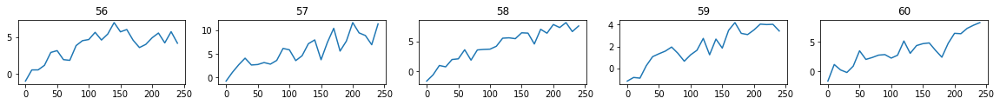

[TWITTER RESULT] r:7  f:11 => r:-4 f:4
# real:3238 / # fake:1279 => 3238
[12.5793295, 10.46957, 17.747532, 15.453504, 5.7099576, 10.348339, 17.419214, 12.175602, 8.65317, 11.679238]


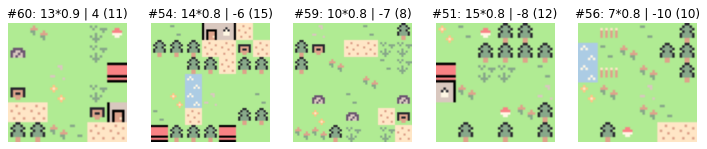

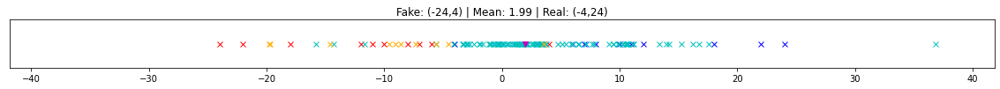

   >> EXP 61 / 100 -- last fitness: 11.68 | last twit score: 4.00 | last loss: 15.6287


epoch: 250 - fit: 18.78 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 46.81it/s]


[TWITTER RESULT] r:23  f:2 => r:21 f:-21
# real:3287 / # fake:1288 => 3287
   >> EXP 62 / 100 -- last fitness: 18.78 | last twit score: -21.00 | last loss: 16.1943


epoch: 250 - fit: 13.51 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.19it/s]


[TWITTER RESULT] r:20  f:10 => r:10 f:-10
# real:3336 / # fake:1304 => 3336
   >> EXP 63 / 100 -- last fitness: 13.51 | last twit score: -10.00 | last loss: 16.3682


epoch: 250 - fit: 10.65 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.15it/s]


[TWITTER RESULT] r:27  f:6 => r:21 f:-21
# real:3385 / # fake:1313 => 3385
   >> EXP 64 / 100 -- last fitness: 10.65 | last twit score: -21.00 | last loss: 17.8045


epoch: 250 - fit: 3.98 - N: 10.06: 100%|██████████| 250/250 [00:13<00:00, 18.08it/s]


[TWITTER RESULT] r:15  f:12 => r:3 f:-3
# real:3466 / # fake:1362 => 3466
   >> EXP 65 / 100 -- last fitness: 3.98 | last twit score: -3.00 | last loss: 17.2733


epoch: 250 - fit: 7.22 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.42it/s]


SHOWING FITNESS GRAPHS


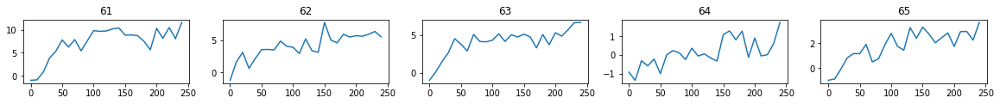

[TWITTER RESULT] r:29  f:13 => r:16 f:-16
# real:3530 / # fake:1398 => 3530
   >> EXP 66 / 100 -- last fitness: 7.22 | last twit score: -16.00 | last loss: 18.8589


epoch: 250 - fit: 15.97 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 46.33it/s]


[TWITTER RESULT] r:17  f:8 => r:9 f:-9
# real:3579 / # fake:1407 => 3579
   >> EXP 67 / 100 -- last fitness: 15.97 | last twit score: -9.00 | last loss: 18.4432


epoch: 250 - fit: 6.66 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.66it/s]


[TWITTER RESULT] r:17  f:6 => r:11 f:-11
# real:3604 / # fake:1443 => 3604
   >> EXP 68 / 100 -- last fitness: 6.66 | last twit score: -11.00 | last loss: 17.7183


epoch: 250 - fit: 16.69 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 48.65it/s]


[TWITTER RESULT] r:16  f:2 => r:14 f:-14
# real:3653 / # fake:1452 => 3653
   >> EXP 69 / 100 -- last fitness: 16.69 | last twit score: -14.00 | last loss: 17.7697


epoch: 250 - fit: 8.18 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.62it/s]


[TWITTER RESULT] r:5  f:12 => r:-7 f:7
# real:3734 / # fake:1488 => 3734
   >> EXP 70 / 100 -- last fitness: 8.18 | last twit score: 7.00 | last loss: 17.2665


epoch: 250 - fit: 5.15 - N: 11.00: 100%|██████████| 250/250 [00:16<00:00, 14.80it/s]


SHOWING FITNESS GRAPHS


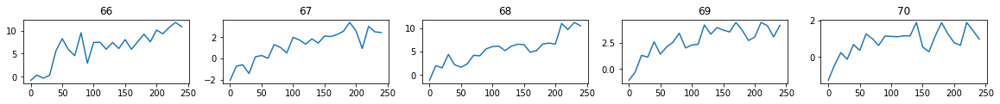

[TWITTER RESULT] r:29  f:11 => r:18 f:-18
# real:3783 / # fake:1552 => 3783
[18.776237, 13.508715, 10.654423, 3.9765196, 7.2207913, 15.97169, 6.6581287, 16.685888, 8.175455, 5.1532993]


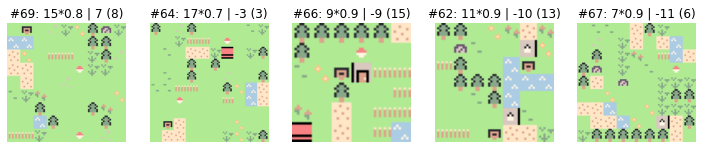

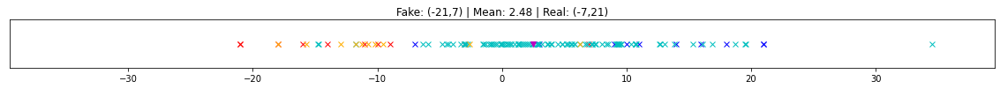

   >> EXP 71 / 100 -- last fitness: 5.15 | last twit score: -18.00 | last loss: 21.0507


epoch: 250 - fit: 4.32 - N: 11.00: 100%|██████████| 250/250 [00:17<00:00, 14.17it/s]


[TWITTER RESULT] r:19  f:9 => r:10 f:-10
# real:3832 / # fake:1616 => 3832
   >> EXP 72 / 100 -- last fitness: 4.32 | last twit score: -10.00 | last loss: 20.4597


epoch: 250 - fit: 15.80 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.66it/s]


[TWITTER RESULT] r:21  f:4 => r:17 f:-17
# real:3913 / # fake:1625 => 3913
   >> EXP 73 / 100 -- last fitness: 15.80 | last twit score: -17.00 | last loss: 20.6647


epoch: 250 - fit: 11.97 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.45it/s]


[TWITTER RESULT] r:13  f:8 => r:5 f:-5
# real:3994 / # fake:1661 => 3994
   >> EXP 74 / 100 -- last fitness: 11.97 | last twit score: -5.00 | last loss: 20.6320


epoch: 250 - fit: 5.48 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.63it/s]


[TWITTER RESULT] r:27  f:13 => r:14 f:-14
# real:4075 / # fake:1697 => 4075
   >> EXP 75 / 100 -- last fitness: 5.48 | last twit score: -14.00 | last loss: 21.3548


epoch: 250 - fit: 7.16 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.04it/s]


SHOWING FITNESS GRAPHS


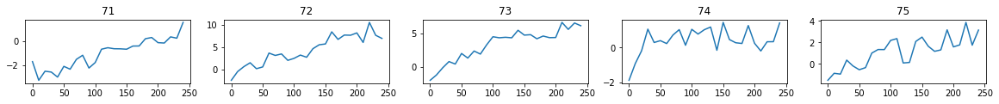

[TWITTER RESULT] r:-1  f:11 => r:-12 f:12
# real:4100 / # fake:1713 => 4100
   >> EXP 76 / 100 -- last fitness: 7.16 | last twit score: 12.00 | last loss: 20.3449


epoch: 250 - fit: 13.19 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 46.75it/s]


[TWITTER RESULT] r:19  f:-2 => r:21 f:-21
# real:4149 / # fake:1722 => 4149
   >> EXP 77 / 100 -- last fitness: 13.19 | last twit score: -21.00 | last loss: 21.5284


epoch: 250 - fit: 16.89 - N: 6.12: 100%|██████████| 250/250 [00:07<00:00, 34.86it/s]


[TWITTER RESULT] r:14  f:8 => r:6 f:-6
# real:4198 / # fake:1731 => 4198
   >> EXP 78 / 100 -- last fitness: 16.89 | last twit score: -6.00 | last loss: 20.0904


epoch: 250 - fit: 14.74 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 35.34it/s]


[TWITTER RESULT] r:7  f:4 => r:3 f:-3
# real:4279 / # fake:1747 => 4279
   >> EXP 79 / 100 -- last fitness: 14.74 | last twit score: -3.00 | last loss: 20.3128


epoch: 250 - fit: 6.59 - N: 10.00: 100%|██████████| 250/250 [00:14<00:00, 17.22it/s]


[TWITTER RESULT] r:19  f:8 => r:11 f:-11
# real:4328 / # fake:1796 => 4328
   >> EXP 80 / 100 -- last fitness: 6.59 | last twit score: -11.00 | last loss: 21.6646


epoch: 250 - fit: 16.57 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.06it/s]


SHOWING FITNESS GRAPHS


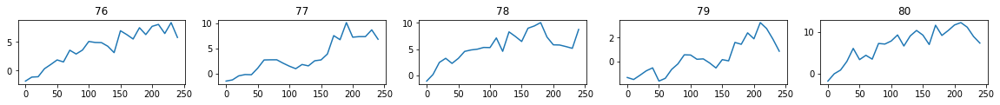

[TWITTER RESULT] r:20  f:9 => r:11 f:-11
# real:4377 / # fake:1805 => 4377
[4.318964, 15.804199, 11.971081, 5.475256, 7.1616354, 13.187997, 16.885132, 14.742203, 6.5850196, 16.570662]


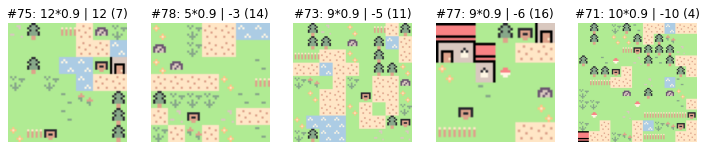

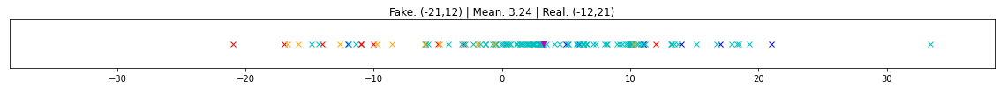

   >> EXP 81 / 100 -- last fitness: 16.57 | last twit score: -11.00 | last loss: 21.0208


epoch: 250 - fit: 13.18 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 37.74it/s]


[TWITTER RESULT] r:23  f:9 => r:14 f:-14
# real:4426 / # fake:1814 => 4426
   >> EXP 82 / 100 -- last fitness: 13.18 | last twit score: -14.00 | last loss: 20.2741


epoch: 250 - fit: 9.29 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.17it/s]


[TWITTER RESULT] r:22  f:8 => r:14 f:-14
# real:4475 / # fake:1830 => 4475
   >> EXP 83 / 100 -- last fitness: 9.29 | last twit score: -14.00 | last loss: 21.2647


epoch: 250 - fit: 15.42 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 45.71it/s]


[TWITTER RESULT] r:27  f:6 => r:21 f:-21
# real:4511 / # fake:1839 => 4511
   >> EXP 84 / 100 -- last fitness: 15.42 | last twit score: -21.00 | last loss: 22.7336


epoch: 250 - fit: 11.19 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.58it/s]


[TWITTER RESULT] r:16  f:4 => r:12 f:-12
# real:4560 / # fake:1855 => 4560
   >> EXP 85 / 100 -- last fitness: 11.19 | last twit score: -12.00 | last loss: 22.3888


epoch: 250 - fit: 14.06 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.50it/s]


SHOWING FITNESS GRAPHS


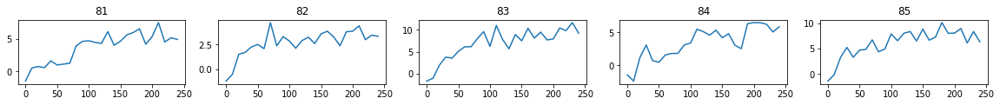

[TWITTER RESULT] r:15  f:6 => r:9 f:-9
# real:4609 / # fake:1871 => 4609
   >> EXP 86 / 100 -- last fitness: 14.06 | last twit score: -9.00 | last loss: 22.0499


epoch: 250 - fit: 9.54 - N: 7.25: 100%|██████████| 250/250 [00:12<00:00, 19.26it/s] 


[TWITTER RESULT] r:16  f:6 => r:10 f:-10
# real:4673 / # fake:1887 => 4673
   >> EXP 87 / 100 -- last fitness: 9.54 | last twit score: -10.00 | last loss: 22.0079


epoch: 250 - fit: 16.04 - N: 6.00: 100%|██████████| 250/250 [00:07<00:00, 33.30it/s]


[TWITTER RESULT] r:30  f:5 => r:25 f:-25
# real:4722 / # fake:1896 => 4722
   >> EXP 88 / 100 -- last fitness: 16.04 | last twit score: -25.00 | last loss: 23.5141


epoch: 250 - fit: 9.47 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.18it/s]


[TWITTER RESULT] r:25  f:11 => r:14 f:-14
# real:4771 / # fake:1912 => 4771
   >> EXP 89 / 100 -- last fitness: 9.47 | last twit score: -14.00 | last loss: 22.7796


epoch: 250 - fit: 10.79 - N: 6.00: 100%|██████████| 250/250 [00:07<00:00, 31.26it/s]


[TWITTER RESULT] r:11  f:6 => r:5 f:-5
# real:4852 / # fake:1921 => 4852
   >> EXP 90 / 100 -- last fitness: 10.79 | last twit score: -5.00 | last loss: 22.9332


epoch: 250 - fit: 9.51 - N: 7.50: 100%|██████████| 250/250 [00:09<00:00, 26.84it/s]


SHOWING FITNESS GRAPHS


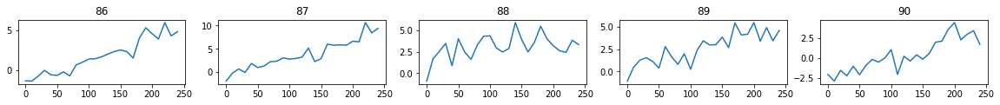

[TWITTER RESULT] r:16  f:-2 => r:18 f:-18
# real:4933 / # fake:1930 => 4933
[13.180935, 9.285444, 15.419268, 11.189175, 14.055449, 9.539721, 16.039145, 9.473318, 10.785305, 9.50785]


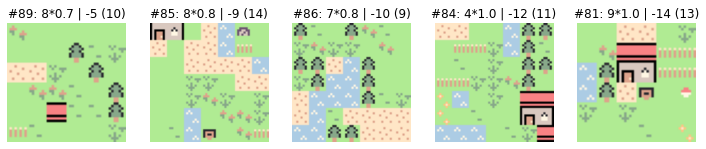

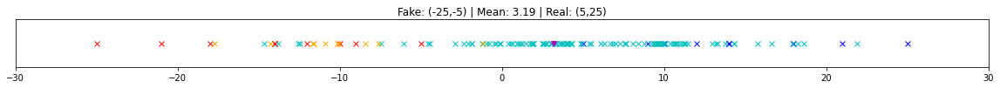

   >> EXP 91 / 100 -- last fitness: 9.51 | last twit score: -18.00 | last loss: 24.2791


epoch: 250 - fit: 6.35 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.08it/s]


[TWITTER RESULT] r:23  f:11 => r:12 f:-12
# real:4982 / # fake:1966 => 4982
   >> EXP 92 / 100 -- last fitness: 6.35 | last twit score: -12.00 | last loss: 24.2043


epoch: 250 - fit: 14.07 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 41.50it/s]


[TWITTER RESULT] r:-2  f:1 => r:-3 f:3
# real:5031 / # fake:1975 => 5031
   >> EXP 93 / 100 -- last fitness: 14.07 | last twit score: 3.00 | last loss: 23.6350


epoch: 250 - fit: 10.58 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.79it/s]


[TWITTER RESULT] r:14  f:10 => r:4 f:-4
# real:5112 / # fake:1984 => 5112
   >> EXP 94 / 100 -- last fitness: 10.58 | last twit score: -4.00 | last loss: 22.6827


epoch: 250 - fit: 10.16 - N: 7.06: 100%|██████████| 250/250 [00:07<00:00, 31.47it/s]


[TWITTER RESULT] r:21  f:5 => r:16 f:-16
# real:5193 / # fake:2000 => 5193
   >> EXP 95 / 100 -- last fitness: 10.16 | last twit score: -16.00 | last loss: 23.6691


epoch: 250 - fit: 13.33 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.47it/s]


SHOWING FITNESS GRAPHS


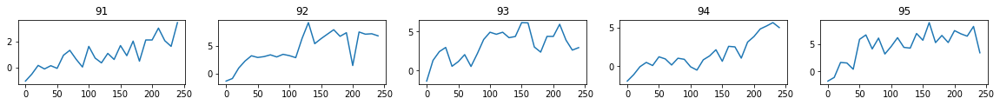

[TWITTER RESULT] r:26  f:5 => r:21 f:-21
# real:5242 / # fake:2009 => 5242
   >> EXP 96 / 100 -- last fitness: 13.33 | last twit score: -21.00 | last loss: 23.9005


epoch: 250 - fit: 3.90 - N: 11.06: 100%|██████████| 250/250 [00:16<00:00, 14.86it/s]


[TWITTER RESULT] r:22  f:12 => r:10 f:-10
# real:5323 / # fake:2073 => 5323
   >> EXP 97 / 100 -- last fitness: 3.90 | last twit score: -10.00 | last loss: 24.5998


epoch: 250 - fit: 12.05 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.07it/s]


[TWITTER RESULT] r:19  f:8 => r:11 f:-11
# real:5372 / # fake:2082 => 5372
   >> EXP 98 / 100 -- last fitness: 12.05 | last twit score: -11.00 | last loss: 23.5932


epoch: 250 - fit: 13.04 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 45.19it/s]


[TWITTER RESULT] r:7  f:2 => r:5 f:-5
# real:5436 / # fake:2091 => 5436
   >> EXP 99 / 100 -- last fitness: 13.04 | last twit score: -5.00 | last loss: 23.6880


epoch: 250 - fit: 15.96 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.89it/s]


[TWITTER RESULT] r:25  f:7 => r:18 f:-18
# real:5485 / # fake:2100 => 5485
   >> EXP 100 / 100 -- last fitness: 15.96 | last twit score: -18.00 | last loss: 24.4963


epoch: 250 - fit: 10.19 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 27.36it/s]


SHOWING FITNESS GRAPHS


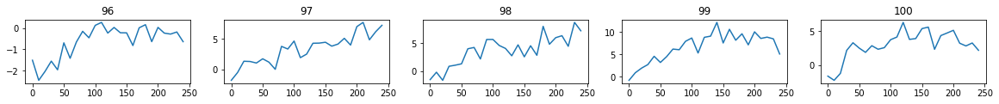

[TWITTER RESULT] r:21  f:7 => r:14 f:-14
# real:5534 / # fake:2125 => 5534
[6.3530164, 14.074405, 10.5789995, 10.16049, 13.328029, 3.8965847, 12.052746, 13.041138, 15.9604225, 10.193236]


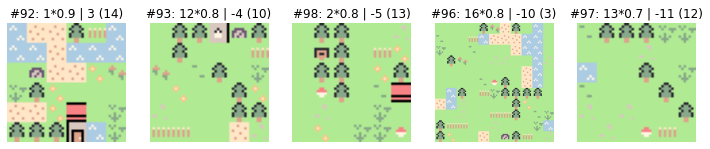

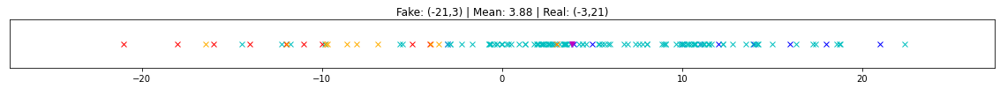

> amongus tileset
 ------- TRIAL #1 --------
[TWITTER RESULT] r:13  f:-11 => r:24 f:-24
[TWITTER RESULT] r:27  f:-12 => r:39 f:-39
[TWITTER RESULT] r:19  f:-7 => r:26 f:-26
[TWITTER RESULT] r:27  f:-11 => r:38 f:-38
[TWITTER RESULT] r:26  f:-12 => r:38 f:-38
[TWITTER RESULT] r:24  f:-8 => r:32 f:-32
[TWITTER RESULT] r:29  f:-10 => r:39 f:-39
[TWITTER RESULT] r:31  f:-12 => r:43 f:-43
[TWITTER RESULT] r:21  f:-10 => r:31 f:-31
[TWITTER RESULT] r:19  f:-10 => r:29 f:-29
[TWITTER RESULT] r:9  f:-12 => r:21 f:-21
[TWITTER RESULT] r:5  f:-11 => r:16 f:-16
[TWITTER RESULT] r:-5  f:-11 => r:6 f:-6
[TWITTER RESULT] r:22  f:-10 => r:32 f:-32
[TWITTER RESULT] r:11  f:-9 => r:20 f:-20
[TWITTER RESULT] r:4  f:-10 => r:14 f:-14
[TWITTER RESULT] r:-11  f:-9 => r:-2 f:2
[TWITTER RESULT] r:-5  f:-12 => r:7 f:-7
[TWITTER RESULT] r:17  f:-10 => r:27 f:-27
[TWITTER RESULT] r:23  f:-11 => r:34 f:-34
[TWITTER RESULT] r:26  f:-9 => r:35 f:-35
[TWITTER RESULT] r:6  f:-10 => r:16 f:-16
[TWITTER RESULT] r:21  

epoch: 250 - fit: 43.33 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 46.00it/s]


[TWITTER RESULT] r:14  f:8 => r:6 f:-6
# real:36 / # fake:9 => 36
   >> EXP 2 / 100 -- last fitness: 43.33 | last twit score: -6.00 | last loss: 6.6313


epoch: 250 - fit: 20.08 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 34.06it/s]


[TWITTER RESULT] r:-4  f:11 => r:-15 f:15
# real:85 / # fake:25 => 85
   >> EXP 3 / 100 -- last fitness: 20.08 | last twit score: 15.00 | last loss: 7.2198


epoch: 250 - fit: 18.60 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.81it/s]


[TWITTER RESULT] r:13  f:11 => r:2 f:-2
# real:134 / # fake:34 => 134
   >> EXP 4 / 100 -- last fitness: 18.60 | last twit score: -2.00 | last loss: 5.7106


epoch: 250 - fit: 12.13 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 36.36it/s]


[TWITTER RESULT] r:11  f:11 => r:0 f:0
# real:183 / # fake:50 => 183
   >> EXP 5 / 100 -- last fitness: 12.13 | last twit score: 0.00 | last loss: 4.2719


epoch: 250 - fit: 10.37 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.19it/s]


SHOWING FITNESS GRAPHS


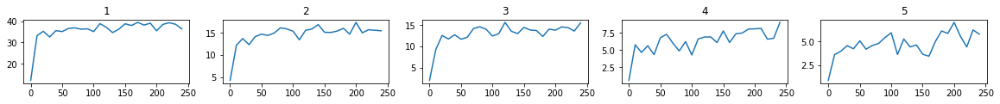

[TWITTER RESULT] r:23  f:12 => r:11 f:-11
# real:192 / # fake:66 => 192
   >> EXP 6 / 100 -- last fitness: 10.37 | last twit score: -11.00 | last loss: 7.0546


epoch: 250 - fit: 10.95 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 40.25it/s]


[TWITTER RESULT] r:0  f:15 => r:-15 f:15
# real:241 / # fake:75 => 241
   >> EXP 7 / 100 -- last fitness: 10.95 | last twit score: 15.00 | last loss: 6.3798


epoch: 250 - fit: 13.95 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 39.03it/s]


[TWITTER RESULT] r:25  f:12 => r:13 f:-13
# real:290 / # fake:84 => 290
   >> EXP 8 / 100 -- last fitness: 13.95 | last twit score: -13.00 | last loss: 13.4091


epoch: 250 - fit: 8.97 - N: 10.00: 100%|██████████| 250/250 [00:13<00:00, 18.09it/s]


[TWITTER RESULT] r:10  f:10 => r:0 f:0
# real:339 / # fake:133 => 339
   >> EXP 9 / 100 -- last fitness: 8.97 | last twit score: 0.00 | last loss: 7.1452


epoch: 250 - fit: 11.81 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.30it/s]


[TWITTER RESULT] r:12  f:9 => r:3 f:-3
# real:388 / # fake:142 => 388
   >> EXP 10 / 100 -- last fitness: 11.81 | last twit score: -3.00 | last loss: 5.9109


epoch: 250 - fit: 12.90 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 45.10it/s]


SHOWING FITNESS GRAPHS


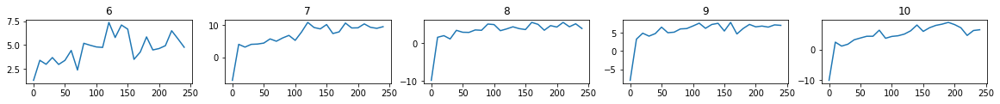

[TWITTER RESULT] r:16  f:10 => r:6 f:-6
# real:397 / # fake:151 => 397
[43.33153, 20.082249, 18.597847, 12.133747, 10.370864, 10.953976, 13.951013, 8.966037, 11.814322, 12.89727]


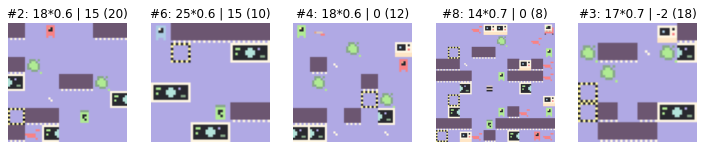

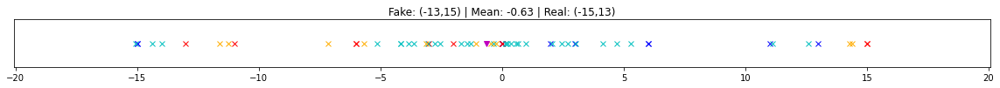

   >> EXP 11 / 100 -- last fitness: 12.90 | last twit score: -6.00 | last loss: 5.5515


epoch: 250 - fit: 15.03 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 49.13it/s]


[TWITTER RESULT] r:4  f:11 => r:-7 f:7
# real:446 / # fake:160 => 446
   >> EXP 12 / 100 -- last fitness: 15.03 | last twit score: 7.00 | last loss: 5.1490


epoch: 250 - fit: 9.96 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.33it/s]


[TWITTER RESULT] r:25  f:11 => r:14 f:-14
# real:495 / # fake:169 => 495
   >> EXP 13 / 100 -- last fitness: 9.96 | last twit score: -14.00 | last loss: 7.3279


epoch: 250 - fit: 13.97 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 46.44it/s]


[TWITTER RESULT] r:-3  f:12 => r:-15 f:15
# real:544 / # fake:178 => 544
   >> EXP 14 / 100 -- last fitness: 13.97 | last twit score: 15.00 | last loss: 6.6340


epoch: 250 - fit: 12.58 - N: 6.81: 100%|██████████| 250/250 [00:06<00:00, 37.49it/s]


[TWITTER RESULT] r:21  f:10 => r:11 f:-11
# real:593 / # fake:194 => 593
   >> EXP 15 / 100 -- last fitness: 12.58 | last twit score: -11.00 | last loss: 6.2475


epoch: 250 - fit: 10.81 - N: 8.00: 100%|██████████| 250/250 [00:08<00:00, 29.34it/s]


SHOWING FITNESS GRAPHS


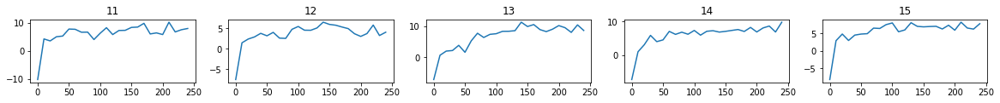

[TWITTER RESULT] r:-2  f:7 => r:-9 f:9
# real:642 / # fake:219 => 642
   >> EXP 16 / 100 -- last fitness: 10.81 | last twit score: 9.00 | last loss: 6.2990


epoch: 250 - fit: 10.17 - N: 9.00: 100%|██████████| 250/250 [00:13<00:00, 19.11it/s]


[TWITTER RESULT] r:15  f:6 => r:9 f:-9
# real:691 / # fake:255 => 691
   >> EXP 17 / 100 -- last fitness: 10.17 | last twit score: -9.00 | last loss: 7.4908


epoch: 250 - fit: 10.54 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.76it/s]


[TWITTER RESULT] r:-4  f:14 => r:-18 f:18
# real:740 / # fake:291 => 740
   >> EXP 18 / 100 -- last fitness: 10.54 | last twit score: 18.00 | last loss: 6.6192


epoch: 250 - fit: 17.83 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.55it/s]


[TWITTER RESULT] r:-7  f:9 => r:-16 f:16
# real:789 / # fake:300 => 789
   >> EXP 19 / 100 -- last fitness: 17.83 | last twit score: 16.00 | last loss: 5.2360


epoch: 250 - fit: 16.44 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 48.81it/s]


[TWITTER RESULT] r:24  f:9 => r:15 f:-15
# real:798 / # fake:309 => 798
   >> EXP 20 / 100 -- last fitness: 16.44 | last twit score: -15.00 | last loss: 5.6223


epoch: 250 - fit: 12.24 - N: 8.06: 100%|██████████| 250/250 [00:09<00:00, 25.96it/s]


SHOWING FITNESS GRAPHS


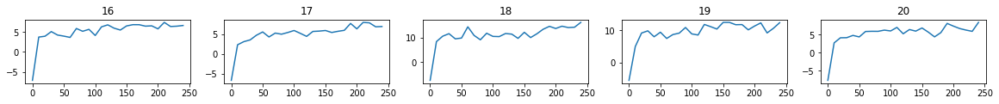

[TWITTER RESULT] r:-1  f:12 => r:-13 f:13
# real:847 / # fake:334 => 847
[15.032096, 9.962773, 13.972939, 12.581289, 10.810417, 10.17272, 10.535778, 17.825033, 16.441854, 12.241322]


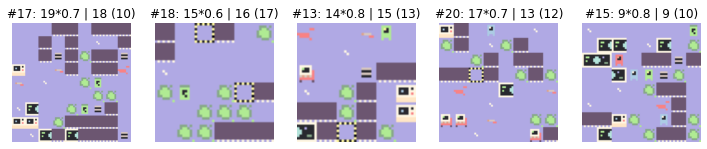

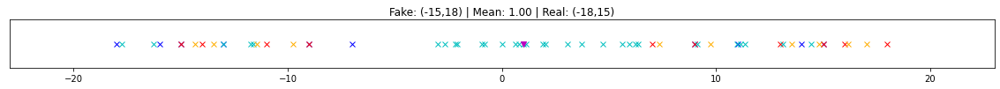

   >> EXP 21 / 100 -- last fitness: 12.24 | last twit score: 13.00 | last loss: 4.5375


epoch: 250 - fit: 15.02 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.18it/s]


[TWITTER RESULT] r:22  f:7 => r:15 f:-15
# real:896 / # fake:343 => 896
   >> EXP 22 / 100 -- last fitness: 15.02 | last twit score: -15.00 | last loss: 5.4420


epoch: 250 - fit: 15.11 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.77it/s]


[TWITTER RESULT] r:16  f:10 => r:6 f:-6
# real:905 / # fake:359 => 905
   >> EXP 23 / 100 -- last fitness: 15.11 | last twit score: -6.00 | last loss: 6.4397


epoch: 250 - fit: 10.44 - N: 10.06: 100%|██████████| 250/250 [00:13<00:00, 18.20it/s]


[TWITTER RESULT] r:14  f:16 => r:-2 f:2
# real:930 / # fake:408 => 930
   >> EXP 24 / 100 -- last fitness: 10.44 | last twit score: 2.00 | last loss: 5.9906


epoch: 250 - fit: 10.02 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.63it/s]


[TWITTER RESULT] r:17  f:12 => r:5 f:-5
# real:955 / # fake:444 => 955
   >> EXP 25 / 100 -- last fitness: 10.02 | last twit score: -5.00 | last loss: 7.3307


epoch: 250 - fit: 14.38 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.22it/s]


SHOWING FITNESS GRAPHS


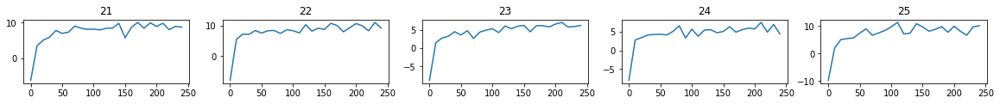

[TWITTER RESULT] r:16  f:7 => r:9 f:-9
# real:980 / # fake:453 => 980
   >> EXP 26 / 100 -- last fitness: 14.38 | last twit score: -9.00 | last loss: 7.6157


epoch: 250 - fit: 13.66 - N: 8.00: 100%|██████████| 250/250 [00:08<00:00, 29.04it/s]


[TWITTER RESULT] r:10  f:17 => r:-7 f:7
# real:996 / # fake:478 => 996
   >> EXP 27 / 100 -- last fitness: 13.66 | last twit score: 7.00 | last loss: 6.6017


epoch: 250 - fit: 14.12 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.29it/s]


[TWITTER RESULT] r:27  f:8 => r:19 f:-19
# real:1021 / # fake:487 => 1021
   >> EXP 28 / 100 -- last fitness: 14.12 | last twit score: -19.00 | last loss: 8.4635


epoch: 250 - fit: 15.42 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.62it/s]


[TWITTER RESULT] r:32  f:12 => r:20 f:-20
# real:1046 / # fake:496 => 1046
   >> EXP 29 / 100 -- last fitness: 15.42 | last twit score: -20.00 | last loss: 10.2753


epoch: 250 - fit: 11.46 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.86it/s]


[TWITTER RESULT] r:28  f:11 => r:17 f:-17
# real:1095 / # fake:532 => 1095
   >> EXP 30 / 100 -- last fitness: 11.46 | last twit score: -17.00 | last loss: 11.6886


epoch: 250 - fit: 11.50 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 27.17it/s]


SHOWING FITNESS GRAPHS


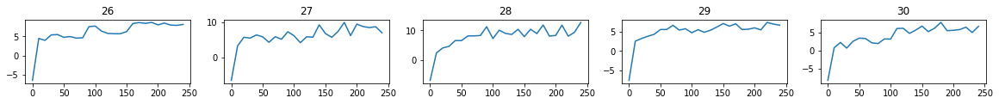

[TWITTER RESULT] r:1  f:11 => r:-10 f:10
# real:1144 / # fake:557 => 1144
[15.017696, 15.112392, 10.44163, 10.022697, 14.382607, 13.658442, 14.122296, 15.422146, 11.461407, 11.500262]


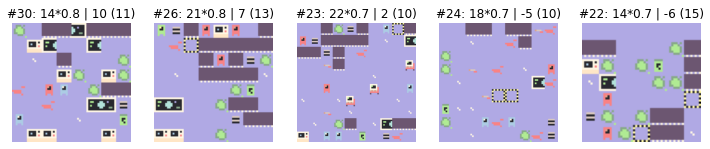

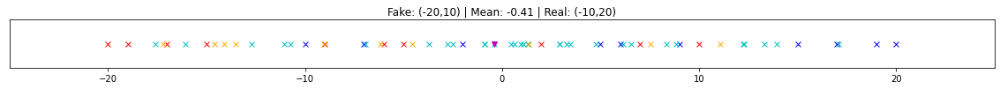

   >> EXP 31 / 100 -- last fitness: 11.50 | last twit score: 10.00 | last loss: 9.2872


epoch: 250 - fit: 9.97 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.48it/s]


[TWITTER RESULT] r:29  f:16 => r:13 f:-13
# real:1208 / # fake:593 => 1208
   >> EXP 32 / 100 -- last fitness: 9.97 | last twit score: -13.00 | last loss: 11.0726


epoch: 250 - fit: 17.71 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.35it/s]


[TWITTER RESULT] r:5  f:5 => r:0 f:0
# real:1257 / # fake:602 => 1257
   >> EXP 33 / 100 -- last fitness: 17.71 | last twit score: 0.00 | last loss: 9.7142


epoch: 250 - fit: 13.94 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 45.34it/s]


[TWITTER RESULT] r:21  f:10 => r:11 f:-11
# real:1321 / # fake:611 => 1321
   >> EXP 34 / 100 -- last fitness: 13.94 | last twit score: -11.00 | last loss: 9.7618


epoch: 250 - fit: 14.41 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.38it/s]


[TWITTER RESULT] r:4  f:10 => r:-6 f:6
# real:1370 / # fake:620 => 1370
   >> EXP 35 / 100 -- last fitness: 14.41 | last twit score: 6.00 | last loss: 8.3150


epoch: 250 - fit: 15.85 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.79it/s]


SHOWING FITNESS GRAPHS


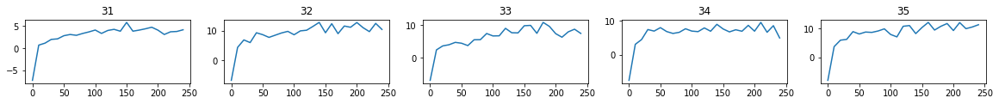

[TWITTER RESULT] r:4  f:8 => r:-4 f:4
# real:1419 / # fake:629 => 1419
   >> EXP 36 / 100 -- last fitness: 15.85 | last twit score: 4.00 | last loss: 7.2665


epoch: 250 - fit: 12.07 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.21it/s]


[TWITTER RESULT] r:22  f:16 => r:6 f:-6
# real:1468 / # fake:645 => 1468
   >> EXP 37 / 100 -- last fitness: 12.07 | last twit score: -6.00 | last loss: 9.4365


epoch: 250 - fit: 13.05 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.72it/s]


[TWITTER RESULT] r:13  f:9 => r:4 f:-4
# real:1517 / # fake:654 => 1517
   >> EXP 38 / 100 -- last fitness: 13.05 | last twit score: -4.00 | last loss: 8.7614


epoch: 250 - fit: 13.86 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 41.83it/s]


[TWITTER RESULT] r:9  f:10 => r:-1 f:1
# real:1566 / # fake:663 => 1566
   >> EXP 39 / 100 -- last fitness: 13.86 | last twit score: 1.00 | last loss: 8.4428


epoch: 250 - fit: 11.45 - N: 8.00: 100%|██████████| 250/250 [00:08<00:00, 29.18it/s]


[TWITTER RESULT] r:23  f:8 => r:15 f:-15
# real:1575 / # fake:688 => 1575
   >> EXP 40 / 100 -- last fitness: 11.45 | last twit score: -15.00 | last loss: 9.1955


epoch: 250 - fit: 14.63 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 49.06it/s]


SHOWING FITNESS GRAPHS


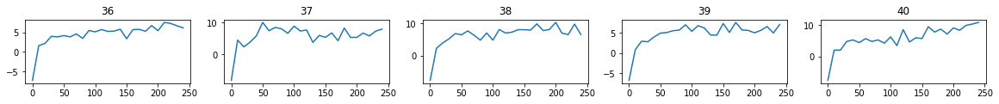

[TWITTER RESULT] r:-4  f:9 => r:-13 f:13
# real:1624 / # fake:697 => 1624
[9.968359, 17.7064, 13.939261, 14.414561, 15.848522, 12.073556, 13.050091, 13.8615465, 11.44842, 14.63033]


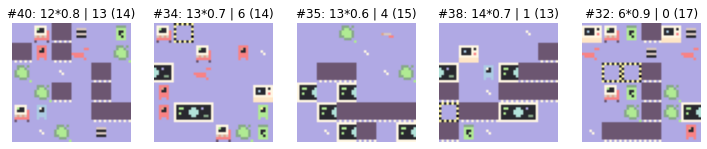

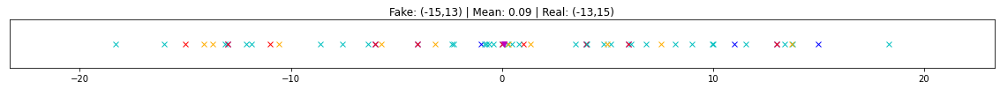

   >> EXP 41 / 100 -- last fitness: 14.63 | last twit score: 13.00 | last loss: 8.8764


epoch: 250 - fit: 11.88 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 37.62it/s]


[TWITTER RESULT] r:25  f:7 => r:18 f:-18
# real:1640 / # fake:713 => 1640
   >> EXP 42 / 100 -- last fitness: 11.88 | last twit score: -18.00 | last loss: 9.5750


epoch: 250 - fit: 15.35 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 45.83it/s]


[TWITTER RESULT] r:27  f:7 => r:20 f:-20
# real:1656 / # fake:722 => 1656
   >> EXP 43 / 100 -- last fitness: 15.35 | last twit score: -20.00 | last loss: 11.4280


epoch: 250 - fit: 15.78 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 49.28it/s]


[TWITTER RESULT] r:5  f:9 => r:-4 f:4
# real:1737 / # fake:731 => 1737
   >> EXP 44 / 100 -- last fitness: 15.78 | last twit score: 4.00 | last loss: 9.0278


epoch: 250 - fit: 14.27 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 48.98it/s]


[TWITTER RESULT] r:13  f:2 => r:11 f:-11
# real:1773 / # fake:740 => 1773
   >> EXP 45 / 100 -- last fitness: 14.27 | last twit score: -11.00 | last loss: 9.0015


epoch: 250 - fit: 12.25 - N: 6.94: 100%|██████████| 250/250 [00:06<00:00, 36.94it/s]


SHOWING FITNESS GRAPHS


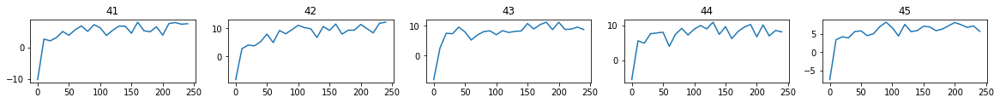

[TWITTER RESULT] r:20  f:14 => r:6 f:-6
# real:1822 / # fake:756 => 1822
   >> EXP 46 / 100 -- last fitness: 12.25 | last twit score: -6.00 | last loss: 10.6816


epoch: 250 - fit: 8.85 - N: 10.00: 100%|██████████| 250/250 [00:13<00:00, 18.04it/s]


[TWITTER RESULT] r:11  f:10 => r:1 f:-1
# real:1871 / # fake:805 => 1871
   >> EXP 47 / 100 -- last fitness: 8.85 | last twit score: -1.00 | last loss: 10.1237


epoch: 250 - fit: 13.43 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 49.12it/s]


[TWITTER RESULT] r:22  f:10 => r:12 f:-12
# real:1887 / # fake:814 => 1887
   >> EXP 48 / 100 -- last fitness: 13.43 | last twit score: -12.00 | last loss: 9.6435


epoch: 250 - fit: 10.67 - N: 6.12: 100%|██████████| 250/250 [00:05<00:00, 45.67it/s]


[TWITTER RESULT] r:-3  f:13 => r:-16 f:16
# real:1936 / # fake:823 => 1936
   >> EXP 49 / 100 -- last fitness: 10.67 | last twit score: 16.00 | last loss: 9.8039


epoch: 250 - fit: 13.99 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 49.85it/s]


[TWITTER RESULT] r:20  f:13 => r:7 f:-7
# real:1952 / # fake:832 => 1952
   >> EXP 50 / 100 -- last fitness: 13.99 | last twit score: -7.00 | last loss: 8.8580


epoch: 250 - fit: 15.41 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 49.38it/s]


SHOWING FITNESS GRAPHS


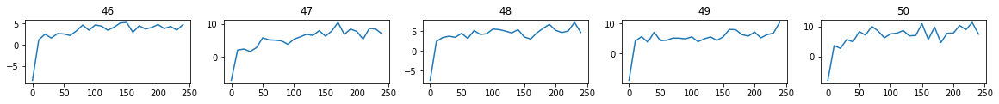

[TWITTER RESULT] r:19  f:3 => r:16 f:-16
# real:1968 / # fake:841 => 1968
[11.883841, 15.349077, 15.77682, 14.272084, 12.245435, 8.851572, 13.427196, 10.669384, 13.990153, 15.410187]


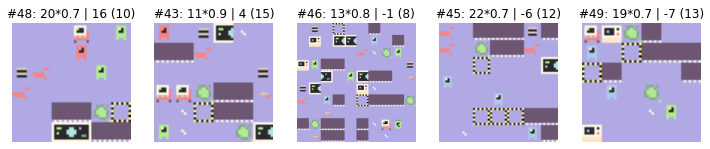

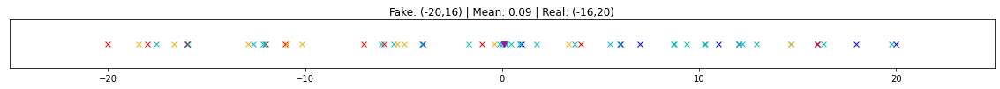

   >> EXP 51 / 100 -- last fitness: 15.41 | last twit score: -16.00 | last loss: 11.3610


epoch: 250 - fit: 7.78 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.84it/s]


[TWITTER RESULT] r:-4  f:12 => r:-16 f:16
# real:2017 / # fake:877 => 2017
   >> EXP 52 / 100 -- last fitness: 7.78 | last twit score: 16.00 | last loss: 11.9553


epoch: 250 - fit: 8.70 - N: 10.00: 100%|██████████| 250/250 [00:13<00:00, 18.13it/s]


[TWITTER RESULT] r:7  f:14 => r:-7 f:7
# real:2053 / # fake:926 => 2053
   >> EXP 53 / 100 -- last fitness: 8.70 | last twit score: 7.00 | last loss: 12.9485


epoch: 250 - fit: 14.37 - N: 7.06: 100%|██████████| 250/250 [00:06<00:00, 36.71it/s]


[TWITTER RESULT] r:15  f:4 => r:11 f:-11
# real:2102 / # fake:942 => 2102
   >> EXP 54 / 100 -- last fitness: 14.37 | last twit score: -11.00 | last loss: 12.4687


epoch: 250 - fit: 9.48 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.84it/s]


[TWITTER RESULT] r:5  f:9 => r:-4 f:4
# real:2151 / # fake:978 => 2151
   >> EXP 55 / 100 -- last fitness: 9.48 | last twit score: 4.00 | last loss: 13.8430


epoch: 250 - fit: 15.72 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 46.80it/s]


SHOWING FITNESS GRAPHS


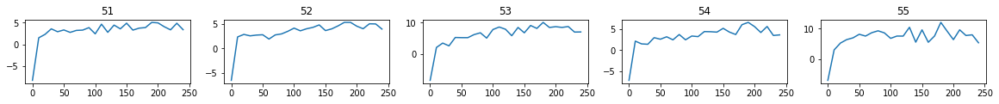

[TWITTER RESULT] r:-12  f:8 => r:-20 f:20
# real:2200 / # fake:987 => 2200
   >> EXP 56 / 100 -- last fitness: 15.72 | last twit score: 20.00 | last loss: 13.3668


epoch: 250 - fit: 11.09 - N: 8.00: 100%|██████████| 250/250 [00:08<00:00, 28.08it/s]


[TWITTER RESULT] r:17  f:7 => r:10 f:-10
# real:2281 / # fake:1012 => 2281
   >> EXP 57 / 100 -- last fitness: 11.09 | last twit score: -10.00 | last loss: 13.8556


epoch: 250 - fit: 13.70 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.51it/s]


[TWITTER RESULT] r:2  f:5 => r:-3 f:3
# real:2306 / # fake:1021 => 2306
   >> EXP 58 / 100 -- last fitness: 13.70 | last twit score: 3.00 | last loss: 12.8302


epoch: 250 - fit: 15.16 - N: 6.00: 100%|██████████| 250/250 [00:08<00:00, 27.92it/s]


[TWITTER RESULT] r:5  f:10 => r:-5 f:5
# real:2355 / # fake:1030 => 2355
   >> EXP 59 / 100 -- last fitness: 15.16 | last twit score: 5.00 | last loss: 12.5837


epoch: 250 - fit: 11.62 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 33.72it/s]


[TWITTER RESULT] r:-7  f:11 => r:-18 f:18
# real:2404 / # fake:1046 => 2404
   >> EXP 60 / 100 -- last fitness: 11.62 | last twit score: 18.00 | last loss: 13.0049


epoch: 250 - fit: 11.70 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 34.01it/s]


SHOWING FITNESS GRAPHS


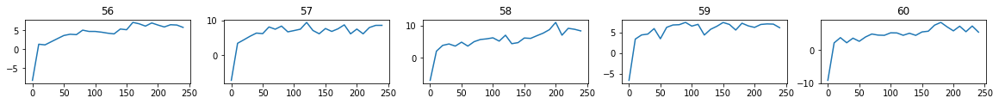

[TWITTER RESULT] r:20  f:11 => r:9 f:-9
# real:2420 / # fake:1062 => 2420
[7.7778897, 8.704249, 14.369162, 9.4810095, 15.7190895, 11.0867195, 13.698757, 15.161726, 11.619764, 11.69828]


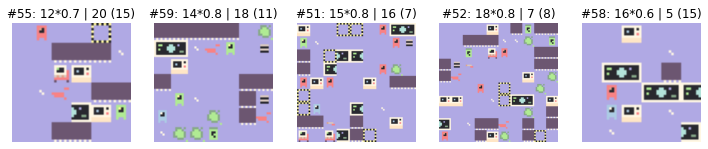

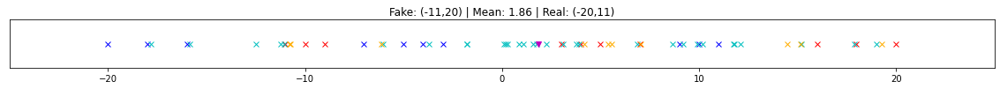

   >> EXP 61 / 100 -- last fitness: 11.70 | last twit score: -9.00 | last loss: 12.7032


epoch: 250 - fit: 8.59 - N: 9.00: 100%|██████████| 250/250 [00:11<00:00, 21.24it/s]


[TWITTER RESULT] r:22  f:12 => r:10 f:-10
# real:2501 / # fake:1098 => 2501
   >> EXP 62 / 100 -- last fitness: 8.59 | last twit score: -10.00 | last loss: 13.4749


epoch: 250 - fit: 11.15 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 46.45it/s]


[TWITTER RESULT] r:11  f:5 => r:6 f:-6
# real:2550 / # fake:1107 => 2550
   >> EXP 63 / 100 -- last fitness: 11.15 | last twit score: -6.00 | last loss: 13.1598


epoch: 250 - fit: 14.07 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 48.30it/s]


[TWITTER RESULT] r:21  f:13 => r:8 f:-8
# real:2575 / # fake:1116 => 2575
   >> EXP 64 / 100 -- last fitness: 14.07 | last twit score: -8.00 | last loss: 13.1187


epoch: 250 - fit: 13.42 - N: 6.94: 100%|██████████| 250/250 [00:06<00:00, 36.22it/s]


[TWITTER RESULT] r:7  f:10 => r:-3 f:3
# real:2656 / # fake:1132 => 2656
   >> EXP 65 / 100 -- last fitness: 13.42 | last twit score: 3.00 | last loss: 12.9592


epoch: 250 - fit: 7.84 - N: 9.00: 100%|██████████| 250/250 [00:12<00:00, 20.82it/s]


SHOWING FITNESS GRAPHS


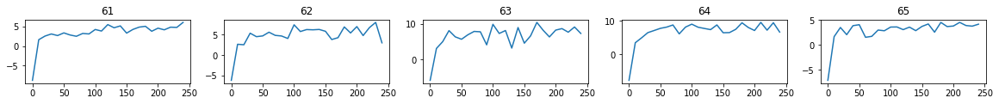

[TWITTER RESULT] r:11  f:11 => r:0 f:0
# real:2705 / # fake:1168 => 2705
   >> EXP 66 / 100 -- last fitness: 7.84 | last twit score: 0.00 | last loss: 11.7432


epoch: 250 - fit: 10.83 - N: 8.00: 100%|██████████| 250/250 [00:08<00:00, 28.05it/s]


[TWITTER RESULT] r:27  f:13 => r:14 f:-14
# real:2721 / # fake:1193 => 2721
   >> EXP 67 / 100 -- last fitness: 10.83 | last twit score: -14.00 | last loss: 12.8138


epoch: 250 - fit: 5.28 - N: 12.00: 100%|██████████| 250/250 [00:20<00:00, 12.09it/s]


[TWITTER RESULT] r:-9  f:14 => r:-23 f:23
# real:2770 / # fake:1274 => 2770
   >> EXP 68 / 100 -- last fitness: 5.28 | last twit score: 23.00 | last loss: 16.8859


epoch: 250 - fit: 7.54 - N: 12.00: 100%|██████████| 250/250 [00:21<00:00, 11.78it/s]


[TWITTER RESULT] r:-6  f:13 => r:-19 f:19
# real:2819 / # fake:1355 => 2819
   >> EXP 69 / 100 -- last fitness: 7.54 | last twit score: 19.00 | last loss: 16.3209


epoch: 250 - fit: 18.55 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.95it/s]


[TWITTER RESULT] r:22  f:10 => r:12 f:-12
# real:2828 / # fake:1364 => 2828
   >> EXP 70 / 100 -- last fitness: 18.55 | last twit score: -12.00 | last loss: 16.2125


epoch: 250 - fit: 18.76 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.17it/s]


SHOWING FITNESS GRAPHS


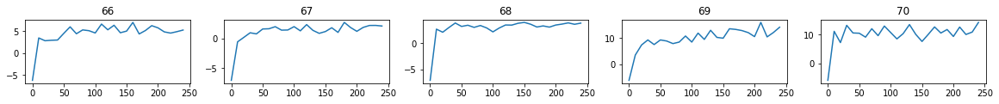

[TWITTER RESULT] r:19  f:9 => r:10 f:-10
# real:2837 / # fake:1373 => 2837
[8.590595, 11.151693, 14.073957, 13.415938, 7.838575, 10.834895, 5.2825737, 7.5387797, 18.552784, 18.76173]


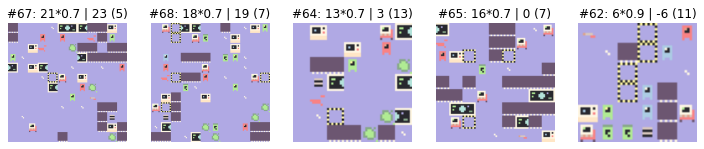

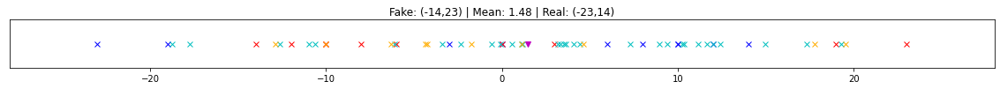

   >> EXP 71 / 100 -- last fitness: 18.76 | last twit score: -10.00 | last loss: 15.7930


epoch: 250 - fit: 17.03 - N: 6.00: 100%|██████████| 250/250 [00:07<00:00, 33.13it/s]


[TWITTER RESULT] r:15  f:10 => r:5 f:-5
# real:2886 / # fake:1382 => 2886
   >> EXP 72 / 100 -- last fitness: 17.03 | last twit score: -5.00 | last loss: 15.4714


epoch: 250 - fit: 18.90 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.10it/s]


[TWITTER RESULT] r:20  f:8 => r:12 f:-12
# real:2911 / # fake:1391 => 2911
   >> EXP 73 / 100 -- last fitness: 18.90 | last twit score: -12.00 | last loss: 13.9937


epoch: 250 - fit: 16.24 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.98it/s]


[TWITTER RESULT] r:16  f:1 => r:15 f:-15
# real:2920 / # fake:1400 => 2920
   >> EXP 74 / 100 -- last fitness: 16.24 | last twit score: -15.00 | last loss: 14.1998


epoch: 250 - fit: 16.37 - N: 7.00: 100%|██████████| 250/250 [00:10<00:00, 23.67it/s]


[TWITTER RESULT] r:18  f:10 => r:8 f:-8
# real:3001 / # fake:1416 => 3001
   >> EXP 75 / 100 -- last fitness: 16.37 | last twit score: -8.00 | last loss: 14.3837


epoch: 250 - fit: 18.46 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.60it/s]


SHOWING FITNESS GRAPHS


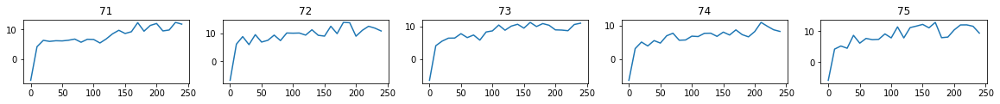

[TWITTER RESULT] r:-3  f:3 => r:-6 f:6
# real:3050 / # fake:1425 => 3050
   >> EXP 76 / 100 -- last fitness: 18.46 | last twit score: 6.00 | last loss: 14.6809


epoch: 250 - fit: 9.20 - N: 10.00: 100%|██████████| 250/250 [00:14<00:00, 17.30it/s]


[TWITTER RESULT] r:27  f:11 => r:16 f:-16
# real:3066 / # fake:1474 => 3066
   >> EXP 77 / 100 -- last fitness: 9.20 | last twit score: -16.00 | last loss: 16.5277


epoch: 250 - fit: 12.93 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 34.36it/s]


[TWITTER RESULT] r:24  f:8 => r:16 f:-16
# real:3130 / # fake:1490 => 3130
   >> EXP 78 / 100 -- last fitness: 12.93 | last twit score: -16.00 | last loss: 15.6734


epoch: 250 - fit: 14.81 - N: 6.75: 100%|██████████| 250/250 [00:07<00:00, 35.28it/s]


[TWITTER RESULT] r:30  f:13 => r:17 f:-17
# real:3146 / # fake:1506 => 3146
   >> EXP 79 / 100 -- last fitness: 14.81 | last twit score: -17.00 | last loss: 16.6742


epoch: 250 - fit: 15.22 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.16it/s]


[TWITTER RESULT] r:24  f:15 => r:9 f:-9
# real:3195 / # fake:1515 => 3195
   >> EXP 80 / 100 -- last fitness: 15.22 | last twit score: -9.00 | last loss: 17.1789


epoch: 250 - fit: 15.80 - N: 6.00: 100%|██████████| 250/250 [00:08<00:00, 28.34it/s]


SHOWING FITNESS GRAPHS


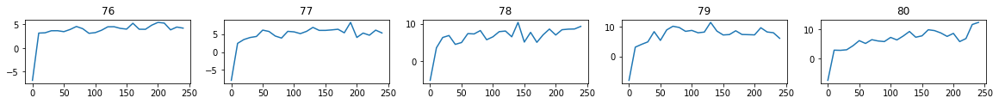

[TWITTER RESULT] r:24  f:11 => r:13 f:-13
# real:3204 / # fake:1524 => 3204
[17.030773, 18.904259, 16.237164, 16.366314, 18.461985, 9.195984, 12.934957, 14.8129425, 15.220242, 15.796899]


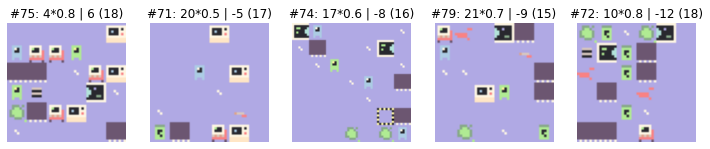

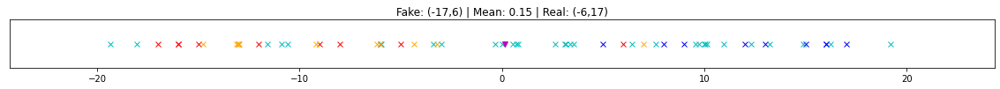

   >> EXP 81 / 100 -- last fitness: 15.80 | last twit score: -13.00 | last loss: 16.7394


epoch: 250 - fit: 14.96 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 27.63it/s]


[TWITTER RESULT] r:0  f:10 => r:-10 f:10
# real:3285 / # fake:1549 => 3285
   >> EXP 82 / 100 -- last fitness: 14.96 | last twit score: 10.00 | last loss: 16.4535


epoch: 250 - fit: 13.27 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 34.96it/s]


[TWITTER RESULT] r:26  f:6 => r:20 f:-20
# real:3301 / # fake:1565 => 3301
   >> EXP 83 / 100 -- last fitness: 13.27 | last twit score: -20.00 | last loss: 16.3150


epoch: 250 - fit: 16.90 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 40.72it/s]


[TWITTER RESULT] r:16  f:6 => r:10 f:-10
# real:3350 / # fake:1574 => 3350
   >> EXP 84 / 100 -- last fitness: 16.90 | last twit score: -10.00 | last loss: 16.6987


epoch: 250 - fit: 14.47 - N: 6.94: 100%|██████████| 250/250 [00:06<00:00, 36.97it/s]


[TWITTER RESULT] r:18  f:12 => r:6 f:-6
# real:3375 / # fake:1590 => 3375
   >> EXP 85 / 100 -- last fitness: 14.47 | last twit score: -6.00 | last loss: 15.2289


epoch: 250 - fit: 14.44 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 46.07it/s]


SHOWING FITNESS GRAPHS


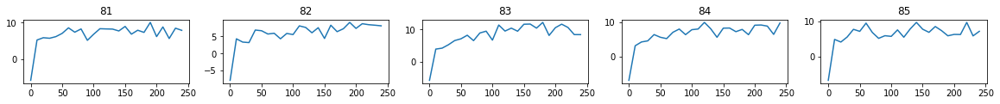

[TWITTER RESULT] r:15  f:7 => r:8 f:-8
# real:3424 / # fake:1599 => 3424
   >> EXP 86 / 100 -- last fitness: 14.44 | last twit score: -8.00 | last loss: 14.5447


epoch: 250 - fit: 8.34 - N: 11.06: 100%|██████████| 250/250 [00:17<00:00, 14.68it/s]


[TWITTER RESULT] r:14  f:13 => r:1 f:-1
# real:3473 / # fake:1663 => 3473
   >> EXP 87 / 100 -- last fitness: 8.34 | last twit score: -1.00 | last loss: 15.3641


epoch: 250 - fit: 15.57 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 32.58it/s]


[TWITTER RESULT] r:6  f:12 => r:-6 f:6
# real:3522 / # fake:1679 => 3522
   >> EXP 88 / 100 -- last fitness: 15.57 | last twit score: 6.00 | last loss: 14.9276


epoch: 250 - fit: 13.81 - N: 7.00: 100%|██████████| 250/250 [00:06<00:00, 36.15it/s]


[TWITTER RESULT] r:1  f:10 => r:-9 f:9
# real:3571 / # fake:1695 => 3571
   >> EXP 89 / 100 -- last fitness: 13.81 | last twit score: 9.00 | last loss: 14.7171


epoch: 250 - fit: 18.02 - N: 6.19: 100%|██████████| 250/250 [00:05<00:00, 45.80it/s]


[TWITTER RESULT] r:-10  f:13 => r:-23 f:23
# real:3620 / # fake:1704 => 3620
   >> EXP 90 / 100 -- last fitness: 18.02 | last twit score: 23.00 | last loss: 14.7144


epoch: 250 - fit: 10.28 - N: 9.00: 100%|██████████| 250/250 [00:12<00:00, 20.82it/s]


SHOWING FITNESS GRAPHS


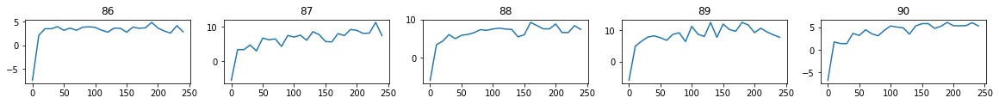

[TWITTER RESULT] r:27  f:14 => r:13 f:-13
# real:3645 / # fake:1740 => 3645
[14.961985, 13.267116, 16.897533, 14.472698, 14.444279, 8.344788, 15.5655575, 13.805498, 18.022346, 10.276389]


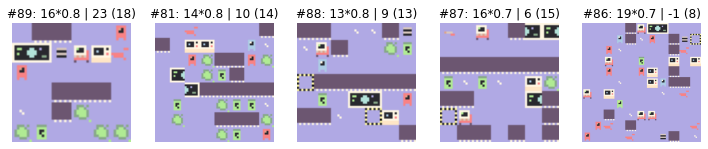

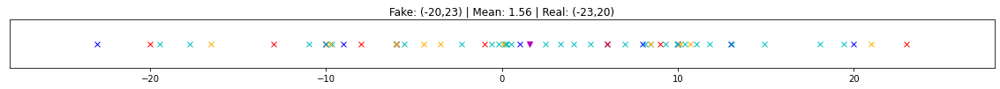

   >> EXP 91 / 100 -- last fitness: 10.28 | last twit score: -13.00 | last loss: 16.3197


epoch: 250 - fit: 14.42 - N: 6.94: 100%|██████████| 250/250 [00:07<00:00, 35.48it/s]


[TWITTER RESULT] r:24  f:12 => r:12 f:-12
# real:3661 / # fake:1756 => 3661
   >> EXP 92 / 100 -- last fitness: 14.42 | last twit score: -12.00 | last loss: 16.3829


epoch: 250 - fit: 16.46 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.53it/s]


[TWITTER RESULT] r:-4  f:9 => r:-13 f:13
# real:3710 / # fake:1765 => 3710
   >> EXP 93 / 100 -- last fitness: 16.46 | last twit score: 13.00 | last loss: 16.0131


epoch: 250 - fit: 13.96 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.66it/s]


[TWITTER RESULT] r:22  f:12 => r:10 f:-10
# real:3759 / # fake:1774 => 3759
   >> EXP 94 / 100 -- last fitness: 13.96 | last twit score: -10.00 | last loss: 15.1767


epoch: 250 - fit: 15.77 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 47.99it/s]


[TWITTER RESULT] r:14  f:7 => r:7 f:-7
# real:3808 / # fake:1783 => 3808
   >> EXP 95 / 100 -- last fitness: 15.77 | last twit score: -7.00 | last loss: 15.3340


epoch: 250 - fit: 5.70 - N: 12.00: 100%|██████████| 250/250 [00:21<00:00, 11.88it/s]


SHOWING FITNESS GRAPHS


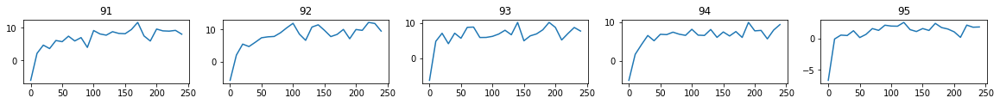

[TWITTER RESULT] r:20  f:13 => r:7 f:-7
# real:3817 / # fake:1864 => 3817
   >> EXP 96 / 100 -- last fitness: 5.70 | last twit score: -7.00 | last loss: 16.3364


epoch: 250 - fit: 10.45 - N: 8.00: 100%|██████████| 250/250 [00:08<00:00, 28.41it/s]


[TWITTER RESULT] r:19  f:14 => r:5 f:-5
# real:3826 / # fake:1889 => 3826
   >> EXP 97 / 100 -- last fitness: 10.45 | last twit score: -5.00 | last loss: 16.3882


epoch: 250 - fit: 13.82 - N: 6.94: 100%|██████████| 250/250 [00:07<00:00, 34.14it/s]


[TWITTER RESULT] r:4  f:11 => r:-7 f:7
# real:3875 / # fake:1905 => 3875
   >> EXP 98 / 100 -- last fitness: 13.82 | last twit score: 7.00 | last loss: 16.2918


epoch: 250 - fit: 11.33 - N: 8.00: 100%|██████████| 250/250 [00:08<00:00, 28.54it/s]


[TWITTER RESULT] r:3  f:9 => r:-6 f:6
# real:3956 / # fake:1930 => 3956
   >> EXP 99 / 100 -- last fitness: 11.33 | last twit score: 6.00 | last loss: 15.1602


epoch: 250 - fit: 7.47 - N: 11.00: 100%|██████████| 250/250 [00:30<00:00,  8.25it/s]


[TWITTER RESULT] r:16  f:14 => r:2 f:-2
# real:3965 / # fake:1994 => 3965
   >> EXP 100 / 100 -- last fitness: 7.47 | last twit score: -2.00 | last loss: 16.0952


epoch: 250 - fit: 15.88 - N: 6.06: 100%|██████████| 250/250 [00:06<00:00, 38.19it/s]


SHOWING FITNESS GRAPHS


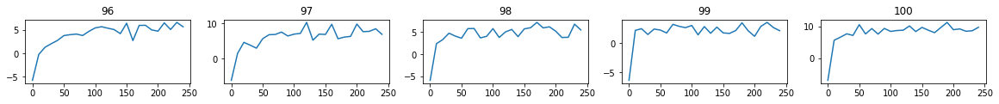

[TWITTER RESULT] r:18  f:14 => r:4 f:-4
# real:3990 / # fake:2003 => 3990
[14.41531, 16.459347, 13.961018, 15.772413, 5.697379, 10.452344, 13.824159, 11.334463, 7.4689026, 15.8791]


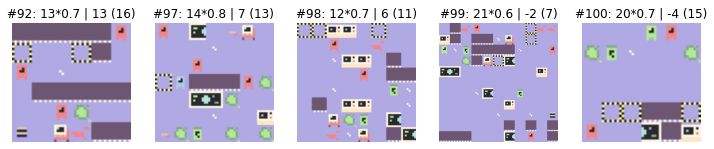

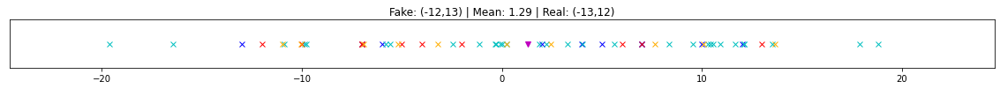

> pacman tileset
 ------- TRIAL #1 --------
[TWITTER RESULT] r:24  f:-11 => r:35 f:-35
[TWITTER RESULT] r:35  f:-10 => r:45 f:-45
[TWITTER RESULT] r:23  f:-11 => r:34 f:-34
[TWITTER RESULT] r:34  f:-12 => r:46 f:-46
[TWITTER RESULT] r:34  f:-10 => r:44 f:-44
[TWITTER RESULT] r:22  f:-10 => r:32 f:-32
[TWITTER RESULT] r:33  f:-10 => r:43 f:-43
[TWITTER RESULT] r:24  f:-11 => r:35 f:-35
[TWITTER RESULT] r:24  f:-12 => r:36 f:-36
[TWITTER RESULT] r:11  f:-11 => r:22 f:-22
[TWITTER RESULT] r:28  f:-10 => r:38 f:-38
[TWITTER RESULT] r:16  f:-9 => r:25 f:-25
[TWITTER RESULT] r:26  f:-12 => r:38 f:-38
[TWITTER RESULT] r:16  f:-13 => r:29 f:-29
[TWITTER RESULT] r:32  f:-10 => r:42 f:-42
[TWITTER RESULT] r:24  f:-12 => r:36 f:-36
[TWITTER RESULT] r:7  f:-9 => r:16 f:-16
[TWITTER RESULT] r:29  f:-12 => r:41 f:-41
[TWITTER RESULT] r:-8  f:-11 => r:3 f:-3
[TWITTER RESULT] r:16  f:-11 => r:27 f:-27
[TWITTER RESULT] r:27  f:-10 => r:37 f:-37
[TWITTER RESULT] r:17  f:-12 => r:29 f:-29
[TWITTER RESULT

epoch: 250 - fit: 43.92 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 45.62it/s]


[TWITTER RESULT] r:13  f:16 => r:-3 f:3
# real:49 / # fake:9 => 49
   >> EXP 2 / 100 -- last fitness: 43.92 | last twit score: 3.00 | last loss: 17.8286


epoch: 250 - fit: 29.81 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 44.59it/s]


[TWITTER RESULT] r:31  f:10 => r:21 f:-21
# real:98 / # fake:18 => 98
   >> EXP 3 / 100 -- last fitness: 29.81 | last twit score: -21.00 | last loss: 10.6361


epoch: 250 - fit: 21.45 - N: 7.81: 100%|██████████| 250/250 [00:09<00:00, 27.18it/s]


[TWITTER RESULT] r:-4  f:9 => r:-13 f:13
# real:147 / # fake:43 => 147
   >> EXP 4 / 100 -- last fitness: 21.45 | last twit score: 13.00 | last loss: 14.4046


epoch: 250 - fit: 19.31 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 36.63it/s]


[TWITTER RESULT] r:32  f:7 => r:25 f:-25
# real:228 / # fake:52 => 228
   >> EXP 5 / 100 -- last fitness: 19.31 | last twit score: -25.00 | last loss: 11.8632


epoch: 250 - fit: 24.20 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 42.77it/s]


SHOWING FITNESS GRAPHS


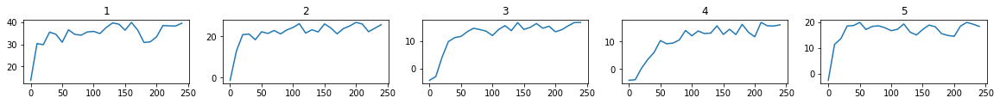

[TWITTER RESULT] r:27  f:3 => r:24 f:-24
# real:244 / # fake:61 => 244
   >> EXP 6 / 100 -- last fitness: 24.20 | last twit score: -24.00 | last loss: 13.0545


epoch: 250 - fit: 21.06 - N: 7.94: 100%|██████████| 250/250 [00:09<00:00, 26.68it/s]


[TWITTER RESULT] r:19  f:3 => r:16 f:-16
# real:293 / # fake:86 => 293
   >> EXP 7 / 100 -- last fitness: 21.06 | last twit score: -16.00 | last loss: 11.0623


epoch: 250 - fit: 19.10 - N: 9.00: 100%|██████████| 250/250 [00:12<00:00, 20.79it/s]


[TWITTER RESULT] r:21  f:8 => r:13 f:-13
# real:342 / # fake:122 => 342
   >> EXP 8 / 100 -- last fitness: 19.10 | last twit score: -13.00 | last loss: 15.4192


epoch: 250 - fit: 23.97 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.60it/s]


[TWITTER RESULT] r:28  f:13 => r:15 f:-15
# real:358 / # fake:131 => 358
   >> EXP 9 / 100 -- last fitness: 23.97 | last twit score: -15.00 | last loss: 12.0638


epoch: 250 - fit: 19.13 - N: 7.00: 100%|██████████| 250/250 [00:09<00:00, 27.28it/s]


[TWITTER RESULT] r:25  f:7 => r:18 f:-18
# real:407 / # fake:147 => 407
   >> EXP 10 / 100 -- last fitness: 19.13 | last twit score: -18.00 | last loss: 18.7666


epoch: 250 - fit: 16.64 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 33.52it/s]


SHOWING FITNESS GRAPHS


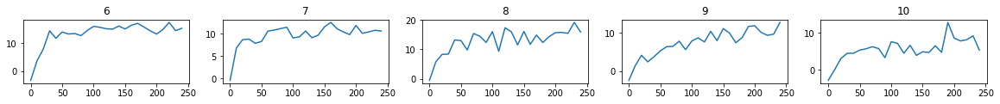

[TWITTER RESULT] r:0  f:10 => r:-10 f:10
# real:456 / # fake:163 => 456
[43.91701, 29.807133, 21.45315, 19.310356, 24.198462, 21.057884, 19.101423, 23.970299, 19.128532, 16.636162]


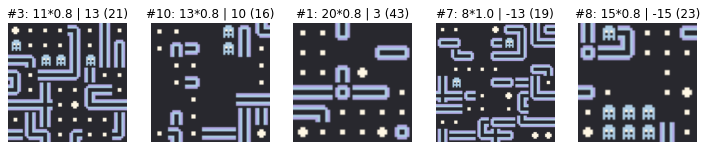

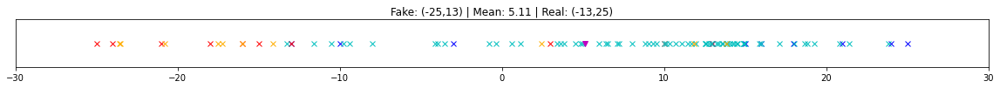

   >> EXP 11 / 100 -- last fitness: 16.64 | last twit score: 10.00 | last loss: 10.7604


epoch: 250 - fit: 20.48 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.88it/s]


[TWITTER RESULT] r:18  f:12 => r:6 f:-6
# real:481 / # fake:172 => 481
   >> EXP 12 / 100 -- last fitness: 20.48 | last twit score: -6.00 | last loss: 10.4604


epoch: 250 - fit: 20.76 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 34.84it/s]


[TWITTER RESULT] r:-13  f:13 => r:-26 f:26
# real:530 / # fake:188 => 530
   >> EXP 13 / 100 -- last fitness: 20.76 | last twit score: 26.00 | last loss: 9.4261


epoch: 250 - fit: 18.38 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.58it/s]


[TWITTER RESULT] r:-10  f:13 => r:-23 f:23
# real:579 / # fake:197 => 579
   >> EXP 14 / 100 -- last fitness: 18.38 | last twit score: 23.00 | last loss: 8.5642


epoch: 250 - fit: 20.83 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.08it/s]


[TWITTER RESULT] r:13  f:13 => r:0 f:0
# real:628 / # fake:206 => 628
   >> EXP 15 / 100 -- last fitness: 20.83 | last twit score: 0.00 | last loss: 8.9802


epoch: 250 - fit: 24.71 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 45.19it/s]


SHOWING FITNESS GRAPHS


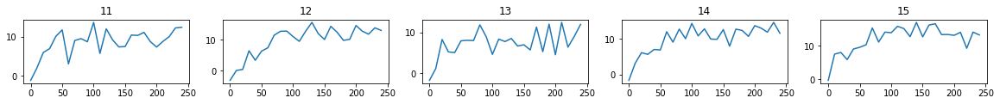

[TWITTER RESULT] r:29  f:9 => r:20 f:-20
# real:677 / # fake:215 => 677
   >> EXP 16 / 100 -- last fitness: 24.71 | last twit score: -20.00 | last loss: 7.4360


epoch: 250 - fit: 18.41 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 35.38it/s]


[TWITTER RESULT] r:-5  f:16 => r:-21 f:21
# real:726 / # fake:231 => 726
   >> EXP 17 / 100 -- last fitness: 18.41 | last twit score: 21.00 | last loss: 7.2078


epoch: 250 - fit: 19.99 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.55it/s]


[TWITTER RESULT] r:-13  f:9 => r:-22 f:22
# real:751 / # fake:240 => 751
   >> EXP 18 / 100 -- last fitness: 19.99 | last twit score: 22.00 | last loss: 6.3883


epoch: 250 - fit: 21.03 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 34.86it/s]


[TWITTER RESULT] r:3  f:15 => r:-12 f:12
# real:800 / # fake:256 => 800
   >> EXP 19 / 100 -- last fitness: 21.03 | last twit score: 12.00 | last loss: 8.6804


epoch: 250 - fit: 22.28 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 45.24it/s]


[TWITTER RESULT] r:30  f:16 => r:14 f:-14
# real:864 / # fake:265 => 864
   >> EXP 20 / 100 -- last fitness: 22.28 | last twit score: -14.00 | last loss: 8.2662


epoch: 250 - fit: 15.06 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 25.05it/s]


SHOWING FITNESS GRAPHS


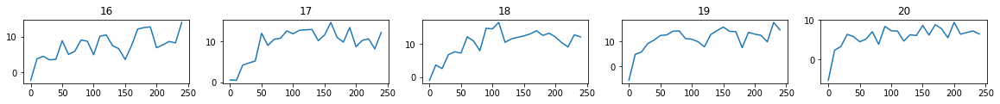

[TWITTER RESULT] r:20  f:11 => r:9 f:-9
# real:900 / # fake:290 => 900
[20.480474, 20.763184, 18.383324, 20.833168, 24.71421, 18.40995, 19.993988, 21.02849, 22.279972, 15.063604]


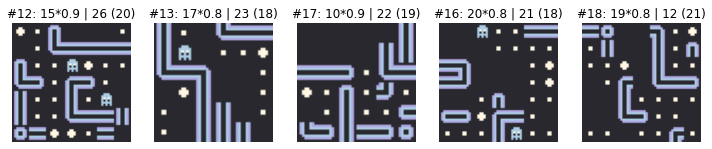

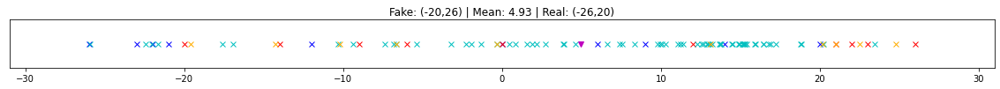

   >> EXP 21 / 100 -- last fitness: 15.06 | last twit score: -9.00 | last loss: 9.2129


epoch: 250 - fit: 8.61 - N: 11.00: 100%|██████████| 250/250 [00:17<00:00, 14.01it/s]


[TWITTER RESULT] r:26  f:13 => r:13 f:-13
# real:916 / # fake:354 => 916
   >> EXP 22 / 100 -- last fitness: 8.61 | last twit score: -13.00 | last loss: 10.3658


epoch: 250 - fit: 21.49 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 45.10it/s]


[TWITTER RESULT] r:-14  f:9 => r:-23 f:23
# real:965 / # fake:363 => 965
   >> EXP 23 / 100 -- last fitness: 21.49 | last twit score: 23.00 | last loss: 8.2597


epoch: 250 - fit: 20.97 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 44.88it/s]


[TWITTER RESULT] r:18  f:3 => r:15 f:-15
# real:1014 / # fake:372 => 1014
   >> EXP 24 / 100 -- last fitness: 20.97 | last twit score: -15.00 | last loss: 9.6031


epoch: 250 - fit: 21.93 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 41.46it/s]


[TWITTER RESULT] r:24  f:3 => r:21 f:-21
# real:1078 / # fake:381 => 1078
   >> EXP 25 / 100 -- last fitness: 21.93 | last twit score: -21.00 | last loss: 9.1945


epoch: 250 - fit: 23.92 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 38.85it/s]


SHOWING FITNESS GRAPHS


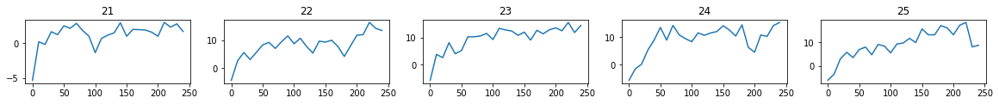

[TWITTER RESULT] r:27  f:7 => r:20 f:-20
# real:1127 / # fake:390 => 1127
   >> EXP 26 / 100 -- last fitness: 23.92 | last twit score: -20.00 | last loss: 9.6826


epoch: 250 - fit: 16.17 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 35.12it/s]


[TWITTER RESULT] r:25  f:9 => r:16 f:-16
# real:1191 / # fake:406 => 1191
   >> EXP 27 / 100 -- last fitness: 16.17 | last twit score: -16.00 | last loss: 9.6185


epoch: 250 - fit: 21.47 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.63it/s]


[TWITTER RESULT] r:-10  f:3 => r:-13 f:13
# real:1272 / # fake:415 => 1272
   >> EXP 28 / 100 -- last fitness: 21.47 | last twit score: 13.00 | last loss: 9.1004


epoch: 250 - fit: 20.57 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 34.86it/s]


[TWITTER RESULT] r:-7  f:11 => r:-18 f:18
# real:1321 / # fake:431 => 1321
   >> EXP 29 / 100 -- last fitness: 20.57 | last twit score: 18.00 | last loss: 9.9562


epoch: 250 - fit: 19.15 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 35.10it/s]


[TWITTER RESULT] r:24  f:7 => r:17 f:-17
# real:1370 / # fake:447 => 1370
   >> EXP 30 / 100 -- last fitness: 19.15 | last twit score: -17.00 | last loss: 9.9031


epoch: 250 - fit: 17.28 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 34.43it/s]


SHOWING FITNESS GRAPHS


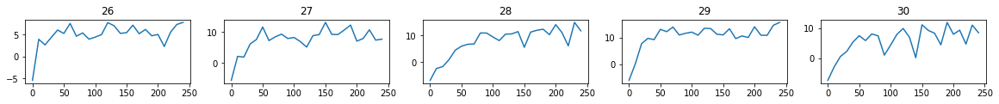

[TWITTER RESULT] r:13  f:9 => r:4 f:-4
# real:1419 / # fake:463 => 1419
[8.607809, 21.493702, 20.967789, 21.927053, 23.920967, 16.170639, 21.466549, 20.568247, 19.154997, 17.27978]


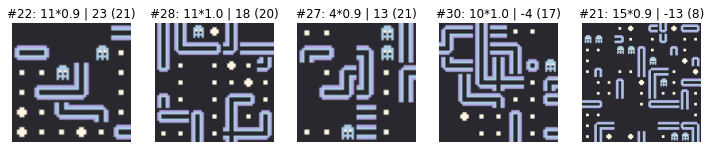

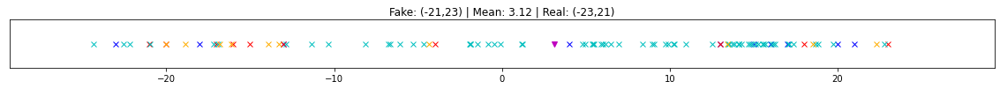

   >> EXP 31 / 100 -- last fitness: 17.28 | last twit score: -4.00 | last loss: 9.8858


epoch: 250 - fit: 16.49 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.89it/s]


[TWITTER RESULT] r:26  f:7 => r:19 f:-19
# real:1500 / # fake:472 => 1500
   >> EXP 32 / 100 -- last fitness: 16.49 | last twit score: -19.00 | last loss: 10.8344


epoch: 250 - fit: 19.33 - N: 7.06: 100%|██████████| 250/250 [00:07<00:00, 34.28it/s]


[TWITTER RESULT] r:26  f:18 => r:8 f:-8
# real:1581 / # fake:488 => 1581
   >> EXP 33 / 100 -- last fitness: 19.33 | last twit score: -8.00 | last loss: 11.4480


epoch: 250 - fit: 11.29 - N: 10.00: 100%|██████████| 250/250 [00:14<00:00, 17.13it/s]


[TWITTER RESULT] r:22  f:11 => r:11 f:-11
# real:1630 / # fake:537 => 1630
   >> EXP 34 / 100 -- last fitness: 11.29 | last twit score: -11.00 | last loss: 12.3743


epoch: 250 - fit: 11.45 - N: 10.00: 100%|██████████| 250/250 [00:14<00:00, 17.33it/s]


[TWITTER RESULT] r:22  f:15 => r:7 f:-7
# real:1711 / # fake:586 => 1711
   >> EXP 35 / 100 -- last fitness: 11.45 | last twit score: -7.00 | last loss: 12.5427


epoch: 250 - fit: 21.70 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 45.12it/s]


SHOWING FITNESS GRAPHS


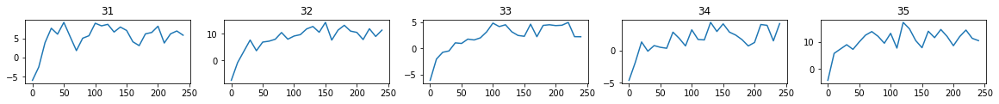

[TWITTER RESULT] r:-4  f:4 => r:-8 f:8
# real:1760 / # fake:595 => 1760
   >> EXP 36 / 100 -- last fitness: 21.70 | last twit score: 8.00 | last loss: 13.2985


epoch: 250 - fit: 11.90 - N: 10.00: 100%|██████████| 250/250 [00:15<00:00, 15.64it/s]


[TWITTER RESULT] r:24  f:11 => r:13 f:-13
# real:1809 / # fake:644 => 1809
   >> EXP 37 / 100 -- last fitness: 11.90 | last twit score: -13.00 | last loss: 12.6773


epoch: 250 - fit: 16.89 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 34.33it/s]


[TWITTER RESULT] r:0  f:8 => r:-8 f:8
# real:1858 / # fake:660 => 1858
   >> EXP 38 / 100 -- last fitness: 16.89 | last twit score: 8.00 | last loss: 13.1587


epoch: 250 - fit: 10.42 - N: 11.00: 100%|██████████| 250/250 [00:17<00:00, 14.00it/s]


[TWITTER RESULT] r:14  f:13 => r:1 f:-1
# real:1907 / # fake:724 => 1907
   >> EXP 39 / 100 -- last fitness: 10.42 | last twit score: -1.00 | last loss: 14.3532


epoch: 250 - fit: 13.57 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 26.89it/s]


[TWITTER RESULT] r:-15  f:13 => r:-28 f:28
# real:1988 / # fake:749 => 1988
   >> EXP 40 / 100 -- last fitness: 13.57 | last twit score: 28.00 | last loss: 16.1273


epoch: 250 - fit: 23.29 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 45.29it/s]


SHOWING FITNESS GRAPHS


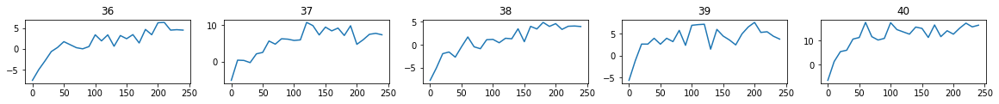

[TWITTER RESULT] r:15  f:12 => r:3 f:-3
# real:2052 / # fake:758 => 2052
[16.491493, 19.331062, 11.294219, 11.45042, 21.703651, 11.899302, 16.889439, 10.421511, 13.570741, 23.29491]


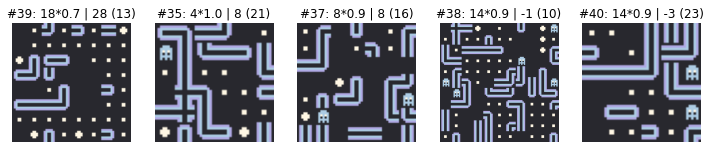

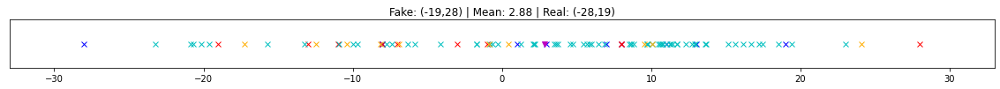

   >> EXP 41 / 100 -- last fitness: 23.29 | last twit score: -3.00 | last loss: 15.5801


epoch: 250 - fit: 21.65 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.77it/s]


[TWITTER RESULT] r:1  f:17 => r:-16 f:16
# real:2101 / # fake:767 => 2101
   >> EXP 42 / 100 -- last fitness: 21.65 | last twit score: 16.00 | last loss: 15.1584


epoch: 250 - fit: 20.66 - N: 6.94: 100%|██████████| 250/250 [00:09<00:00, 27.47it/s]


[TWITTER RESULT] r:-9  f:12 => r:-21 f:21
# real:2182 / # fake:783 => 2182
   >> EXP 43 / 100 -- last fitness: 20.66 | last twit score: 21.00 | last loss: 14.2800


epoch: 250 - fit: 9.39 - N: 11.00: 100%|██████████| 250/250 [00:17<00:00, 14.06it/s]


[TWITTER RESULT] r:19  f:12 => r:7 f:-7
# real:2207 / # fake:847 => 2207
   >> EXP 44 / 100 -- last fitness: 9.39 | last twit score: -7.00 | last loss: 17.0023


epoch: 250 - fit: 10.78 - N: 9.00: 100%|██████████| 250/250 [00:12<00:00, 20.66it/s]


[TWITTER RESULT] r:21  f:7 => r:14 f:-14
# real:2223 / # fake:883 => 2223
   >> EXP 45 / 100 -- last fitness: 10.78 | last twit score: -14.00 | last loss: 14.6418


epoch: 250 - fit: 20.12 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.45it/s]


SHOWING FITNESS GRAPHS


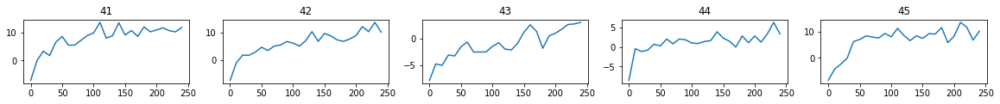

[TWITTER RESULT] r:16  f:4 => r:12 f:-12
# real:2272 / # fake:892 => 2272
   >> EXP 46 / 100 -- last fitness: 20.12 | last twit score: -12.00 | last loss: 14.1670


epoch: 250 - fit: 17.05 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 34.45it/s]


[TWITTER RESULT] r:25  f:8 => r:17 f:-17
# real:2336 / # fake:908 => 2336
   >> EXP 47 / 100 -- last fitness: 17.05 | last twit score: -17.00 | last loss: 14.7683


epoch: 250 - fit: 21.97 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 40.07it/s]


[TWITTER RESULT] r:27  f:14 => r:13 f:-13
# real:2352 / # fake:917 => 2352
   >> EXP 48 / 100 -- last fitness: 21.97 | last twit score: -13.00 | last loss: 14.4548


epoch: 250 - fit: 21.00 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 42.05it/s]


[TWITTER RESULT] r:17  f:7 => r:10 f:-10
# real:2416 / # fake:926 => 2416
   >> EXP 49 / 100 -- last fitness: 21.00 | last twit score: -10.00 | last loss: 14.6261


epoch: 250 - fit: 17.19 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 35.30it/s]


[TWITTER RESULT] r:22  f:4 => r:18 f:-18
# real:2465 / # fake:942 => 2465
   >> EXP 50 / 100 -- last fitness: 17.19 | last twit score: -18.00 | last loss: 14.1274


epoch: 250 - fit: 21.48 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.25it/s]


SHOWING FITNESS GRAPHS


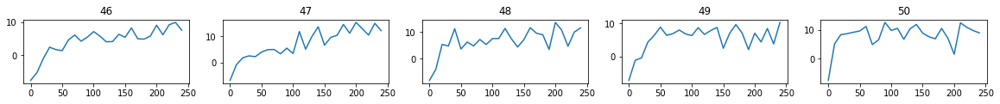

[TWITTER RESULT] r:16  f:8 => r:8 f:-8
# real:2529 / # fake:951 => 2529
[21.652678, 20.66373, 9.38961, 10.780501, 20.120155, 17.050713, 21.973976, 21.004015, 17.19466, 21.478922]


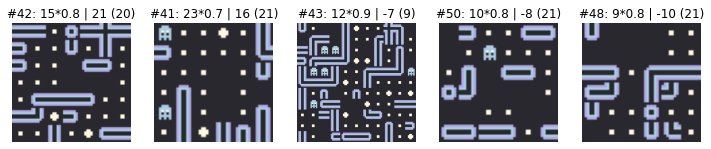

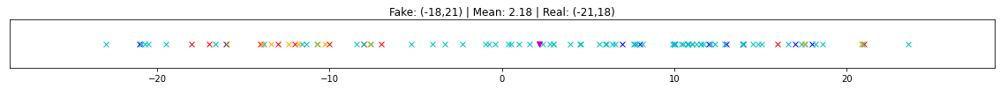

   >> EXP 51 / 100 -- last fitness: 21.48 | last twit score: -8.00 | last loss: 14.9118


epoch: 250 - fit: 17.28 - N: 6.06: 100%|██████████| 250/250 [00:06<00:00, 36.61it/s]


[TWITTER RESULT] r:13  f:9 => r:4 f:-4
# real:2578 / # fake:960 => 2578
   >> EXP 52 / 100 -- last fitness: 17.28 | last twit score: -4.00 | last loss: 16.0789


epoch: 250 - fit: 19.45 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.06it/s]


[TWITTER RESULT] r:18  f:9 => r:9 f:-9
# real:2603 / # fake:969 => 2603
   >> EXP 53 / 100 -- last fitness: 19.45 | last twit score: -9.00 | last loss: 15.2474


epoch: 250 - fit: 9.80 - N: 11.00: 100%|██████████| 250/250 [00:24<00:00, 10.02it/s]


[TWITTER RESULT] r:-8  f:10 => r:-18 f:18
# real:2652 / # fake:1033 => 2652
   >> EXP 54 / 100 -- last fitness: 9.80 | last twit score: 18.00 | last loss: 14.4917


epoch: 250 - fit: 10.44 - N: 10.00: 100%|██████████| 250/250 [00:15<00:00, 16.00it/s]


[TWITTER RESULT] r:24  f:15 => r:9 f:-9
# real:2733 / # fake:1082 => 2733
   >> EXP 55 / 100 -- last fitness: 10.44 | last twit score: -9.00 | last loss: 16.6083


epoch: 250 - fit: 8.88 - N: 10.00: 100%|██████████| 250/250 [00:14<00:00, 16.74it/s]


SHOWING FITNESS GRAPHS


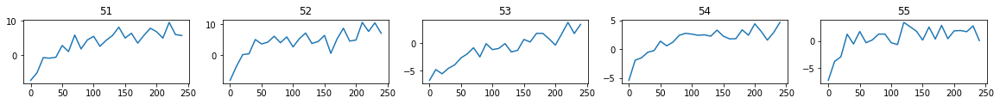

[TWITTER RESULT] r:28  f:12 => r:16 f:-16
# real:2782 / # fake:1131 => 2782
   >> EXP 56 / 100 -- last fitness: 8.88 | last twit score: -16.00 | last loss: 17.0897


epoch: 250 - fit: 17.36 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 33.69it/s]


[TWITTER RESULT] r:24  f:15 => r:9 f:-9
# real:2831 / # fake:1147 => 2831
   >> EXP 57 / 100 -- last fitness: 17.36 | last twit score: -9.00 | last loss: 17.1519


epoch: 250 - fit: 20.26 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.83it/s]


[TWITTER RESULT] r:26  f:6 => r:20 f:-20
# real:2880 / # fake:1156 => 2880
   >> EXP 58 / 100 -- last fitness: 20.26 | last twit score: -20.00 | last loss: 15.5513


epoch: 250 - fit: 16.21 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 34.98it/s]


[TWITTER RESULT] r:-12  f:11 => r:-23 f:23
# real:2929 / # fake:1172 => 2929
   >> EXP 59 / 100 -- last fitness: 16.21 | last twit score: 23.00 | last loss: 15.6918


epoch: 250 - fit: 8.37 - N: 11.00: 100%|██████████| 250/250 [00:20<00:00, 12.40it/s]


[TWITTER RESULT] r:18  f:14 => r:4 f:-4
# real:2954 / # fake:1236 => 2954
   >> EXP 60 / 100 -- last fitness: 8.37 | last twit score: -4.00 | last loss: 20.2722


epoch: 250 - fit: 17.97 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.89it/s]


SHOWING FITNESS GRAPHS


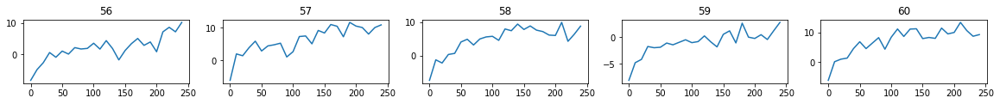

[TWITTER RESULT] r:18  f:6 => r:12 f:-12
# real:3018 / # fake:1245 => 3018
[17.2752, 19.448477, 9.800735, 10.438415, 8.882563, 17.35885, 20.264626, 16.21144, 8.371489, 17.971743]


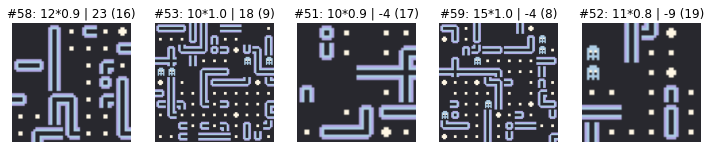

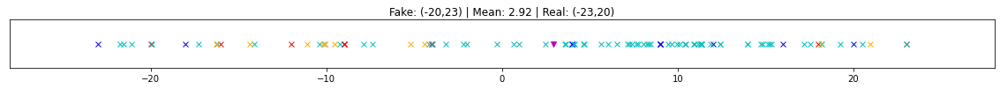

   >> EXP 61 / 100 -- last fitness: 17.97 | last twit score: -12.00 | last loss: 15.3742


epoch: 250 - fit: 20.32 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.05it/s]


[TWITTER RESULT] r:2  f:12 => r:-10 f:10
# real:3067 / # fake:1254 => 3067
   >> EXP 62 / 100 -- last fitness: 20.32 | last twit score: 10.00 | last loss: 15.5314


epoch: 250 - fit: 11.34 - N: 7.06: 100%|██████████| 250/250 [00:07<00:00, 32.65it/s]


[TWITTER RESULT] r:25  f:7 => r:18 f:-18
# real:3116 / # fake:1270 => 3116
   >> EXP 63 / 100 -- last fitness: 11.34 | last twit score: -18.00 | last loss: 15.9183


epoch: 250 - fit: 9.93 - N: 7.00: 100%|██████████| 250/250 [00:08<00:00, 31.02it/s]


[TWITTER RESULT] r:14  f:8 => r:6 f:-6
# real:3152 / # fake:1286 => 3152
   >> EXP 64 / 100 -- last fitness: 9.93 | last twit score: -6.00 | last loss: 15.0113


epoch: 250 - fit: 2.94 - N: 11.00: 100%|██████████| 250/250 [00:18<00:00, 13.39it/s]


[TWITTER RESULT] r:-7  f:12 => r:-19 f:19
# real:3233 / # fake:1350 => 3233
   >> EXP 65 / 100 -- last fitness: 2.94 | last twit score: 19.00 | last loss: 18.1719


epoch: 250 - fit: 12.70 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 33.36it/s]


SHOWING FITNESS GRAPHS


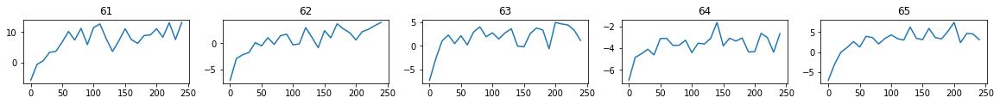

[TWITTER RESULT] r:12  f:8 => r:4 f:-4
# real:3297 / # fake:1366 => 3297
   >> EXP 66 / 100 -- last fitness: 12.70 | last twit score: -4.00 | last loss: 16.6236


epoch: 250 - fit: 15.15 - N: 6.06: 100%|██████████| 250/250 [00:09<00:00, 27.18it/s]


[TWITTER RESULT] r:-7  f:1 => r:-8 f:8
# real:3346 / # fake:1375 => 3346
   >> EXP 67 / 100 -- last fitness: 15.15 | last twit score: 8.00 | last loss: 17.6941


epoch: 250 - fit: 19.00 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 38.37it/s]


[TWITTER RESULT] r:8  f:11 => r:-3 f:3
# real:3395 / # fake:1384 => 3395
   >> EXP 68 / 100 -- last fitness: 19.00 | last twit score: 3.00 | last loss: 18.0970


epoch: 250 - fit: 3.12 - N: 12.00: 100%|██████████| 250/250 [00:21<00:00, 11.83it/s]


[TWITTER RESULT] r:-1  f:11 => r:-12 f:12
# real:3444 / # fake:1465 => 3444
   >> EXP 69 / 100 -- last fitness: 3.12 | last twit score: 12.00 | last loss: 17.4477


epoch: 250 - fit: 17.61 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.26it/s]


[TWITTER RESULT] r:20  f:8 => r:12 f:-12
# real:3453 / # fake:1474 => 3453
   >> EXP 70 / 100 -- last fitness: 17.61 | last twit score: -12.00 | last loss: 18.4298


epoch: 250 - fit: 15.31 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 34.31it/s]


SHOWING FITNESS GRAPHS


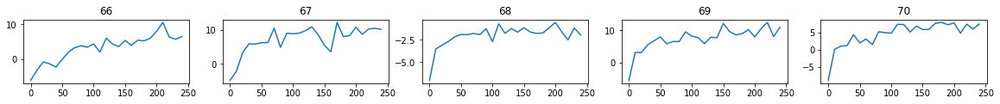

[TWITTER RESULT] r:32  f:7 => r:25 f:-25
# real:3534 / # fake:1490 => 3534
[20.318031, 11.337692, 9.933409, 2.9428115, 12.696861, 15.148714, 19.004993, 3.1152463, 17.613533, 15.311252]


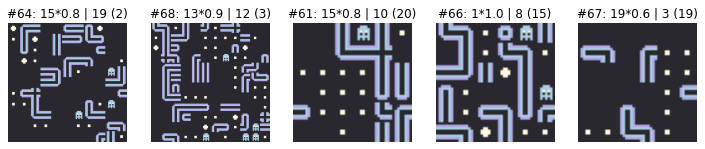

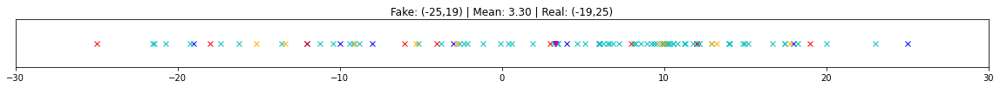

   >> EXP 71 / 100 -- last fitness: 15.31 | last twit score: -25.00 | last loss: 17.8554


epoch: 250 - fit: 9.13 - N: 9.12: 100%|██████████| 250/250 [00:12<00:00, 20.29it/s]


[TWITTER RESULT] r:30  f:11 => r:19 f:-19
# real:3615 / # fake:1526 => 3615
   >> EXP 72 / 100 -- last fitness: 9.13 | last twit score: -19.00 | last loss: 19.7652


epoch: 250 - fit: 11.62 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 32.18it/s]


[TWITTER RESULT] r:29  f:3 => r:26 f:-26
# real:3664 / # fake:1542 => 3664
   >> EXP 73 / 100 -- last fitness: 11.62 | last twit score: -26.00 | last loss: 19.5495


epoch: 250 - fit: 15.15 - N: 6.00: 100%|██████████| 250/250 [00:08<00:00, 29.61it/s]


[TWITTER RESULT] r:21  f:5 => r:16 f:-16
# real:3728 / # fake:1551 => 3728
   >> EXP 74 / 100 -- last fitness: 15.15 | last twit score: -16.00 | last loss: 21.7480


epoch: 250 - fit: 15.47 - N: 7.00: 100%|██████████| 250/250 [00:09<00:00, 25.98it/s]


[TWITTER RESULT] r:20  f:9 => r:11 f:-11
# real:3764 / # fake:1567 => 3764
   >> EXP 75 / 100 -- last fitness: 15.47 | last twit score: -11.00 | last loss: 19.7414


epoch: 250 - fit: 19.77 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.28it/s]


SHOWING FITNESS GRAPHS


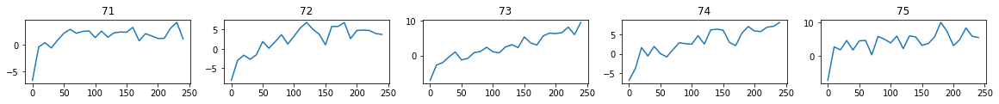

[TWITTER RESULT] r:36  f:17 => r:19 f:-19
# real:3828 / # fake:1576 => 3828
   >> EXP 76 / 100 -- last fitness: 19.77 | last twit score: -19.00 | last loss: 20.3800


epoch: 250 - fit: 19.51 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 43.43it/s]


[TWITTER RESULT] r:31  f:9 => r:22 f:-22
# real:3877 / # fake:1585 => 3877
   >> EXP 77 / 100 -- last fitness: 19.51 | last twit score: -22.00 | last loss: 22.9950


epoch: 250 - fit: 15.99 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 32.33it/s]


[TWITTER RESULT] r:20  f:2 => r:18 f:-18
# real:3958 / # fake:1601 => 3958
   >> EXP 78 / 100 -- last fitness: 15.99 | last twit score: -18.00 | last loss: 20.7251


epoch: 250 - fit: 15.64 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 25.05it/s]


[TWITTER RESULT] r:-3  f:5 => r:-8 f:8
# real:4007 / # fake:1626 => 4007
   >> EXP 79 / 100 -- last fitness: 15.64 | last twit score: 8.00 | last loss: 19.0727


epoch: 250 - fit: 9.18 - N: 9.06: 100%|██████████| 250/250 [00:12<00:00, 19.84it/s]


[TWITTER RESULT] r:18  f:3 => r:15 f:-15
# real:4056 / # fake:1662 => 4056
   >> EXP 80 / 100 -- last fitness: 9.18 | last twit score: -15.00 | last loss: 20.5083


epoch: 250 - fit: 11.25 - N: 9.00: 100%|██████████| 250/250 [00:12<00:00, 20.56it/s]


SHOWING FITNESS GRAPHS


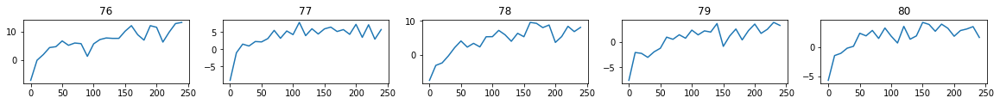

[TWITTER RESULT] r:13  f:13 => r:0 f:0
# real:4105 / # fake:1698 => 4105
[9.134731, 11.623643, 15.149272, 15.472081, 19.773405, 19.50756, 15.986513, 15.63946, 9.183308, 11.247471]


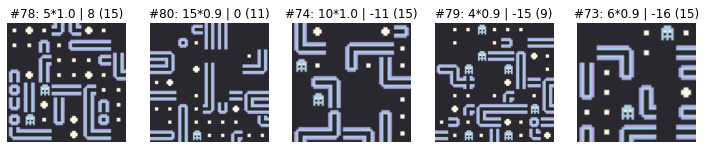

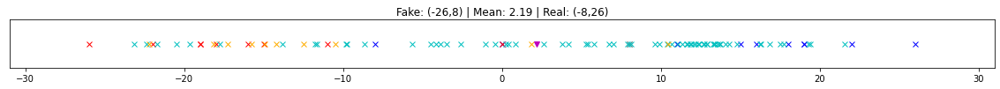

   >> EXP 81 / 100 -- last fitness: 11.25 | last twit score: 0.00 | last loss: 20.2830


epoch: 250 - fit: 16.13 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.17it/s]


[TWITTER RESULT] r:28  f:3 => r:25 f:-25
# real:4141 / # fake:1707 => 4141
   >> EXP 82 / 100 -- last fitness: 16.13 | last twit score: -25.00 | last loss: 19.6986


epoch: 250 - fit: 16.75 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.96it/s]


[TWITTER RESULT] r:19  f:6 => r:13 f:-13
# real:4157 / # fake:1716 => 4157
   >> EXP 83 / 100 -- last fitness: 16.75 | last twit score: -13.00 | last loss: 20.0644


epoch: 250 - fit: 11.37 - N: 8.94: 100%|██████████| 250/250 [00:12<00:00, 20.41it/s]


[TWITTER RESULT] r:20  f:12 => r:8 f:-8
# real:4206 / # fake:1752 => 4206
   >> EXP 84 / 100 -- last fitness: 11.37 | last twit score: -8.00 | last loss: 19.8664


epoch: 250 - fit: 17.38 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 33.30it/s]


[TWITTER RESULT] r:1  f:9 => r:-8 f:8
# real:4287 / # fake:1768 => 4287
   >> EXP 85 / 100 -- last fitness: 17.38 | last twit score: 8.00 | last loss: 19.2805


epoch: 250 - fit: 11.65 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 41.66it/s]


SHOWING FITNESS GRAPHS


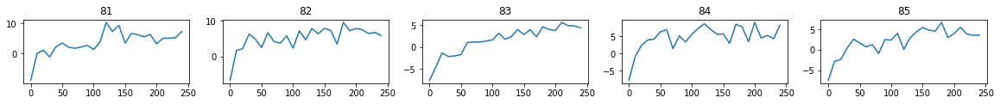

[TWITTER RESULT] r:29  f:11 => r:18 f:-18
# real:4336 / # fake:1777 => 4336
   >> EXP 86 / 100 -- last fitness: 11.65 | last twit score: -18.00 | last loss: 19.9160


epoch: 250 - fit: 12.15 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 25.95it/s]


[TWITTER RESULT] r:31  f:4 => r:27 f:-27
# real:4385 / # fake:1802 => 4385
   >> EXP 87 / 100 -- last fitness: 12.15 | last twit score: -27.00 | last loss: 20.6304


epoch: 250 - fit: 10.70 - N: 8.88: 100%|██████████| 250/250 [00:12<00:00, 20.48it/s]


[TWITTER RESULT] r:24  f:12 => r:12 f:-12
# real:4410 / # fake:1838 => 4410
   >> EXP 88 / 100 -- last fitness: 10.70 | last twit score: -12.00 | last loss: 22.9854


epoch: 250 - fit: 17.99 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.74it/s]


[TWITTER RESULT] r:15  f:10 => r:5 f:-5
# real:4491 / # fake:1847 => 4491
   >> EXP 89 / 100 -- last fitness: 17.99 | last twit score: -5.00 | last loss: 21.8294


epoch: 250 - fit: 4.77 - N: 11.00: 100%|██████████| 250/250 [00:18<00:00, 13.37it/s]


[TWITTER RESULT] r:34  f:7 => r:27 f:-27
# real:4572 / # fake:1911 => 4572
   >> EXP 90 / 100 -- last fitness: 4.77 | last twit score: -27.00 | last loss: 25.8030


epoch: 250 - fit: 17.43 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.24it/s]


SHOWING FITNESS GRAPHS


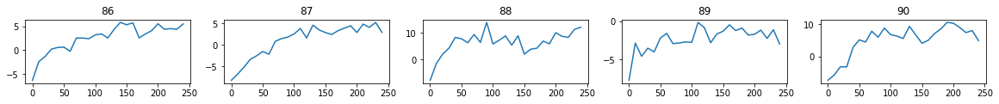

[TWITTER RESULT] r:6  f:7 => r:-1 f:1
# real:4653 / # fake:1920 => 4653
[16.125334, 16.752483, 11.374099, 17.381254, 11.653468, 12.151697, 10.695606, 17.988245, 4.773893, 17.43185]


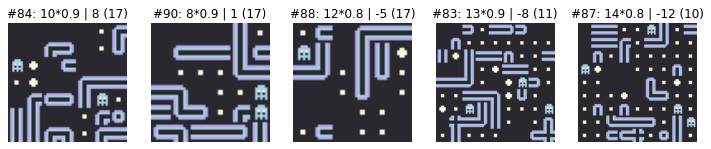

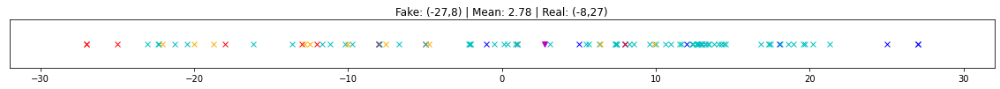

   >> EXP 91 / 100 -- last fitness: 17.43 | last twit score: 1.00 | last loss: 22.8481


epoch: 250 - fit: 9.94 - N: 10.00: 100%|██████████| 250/250 [00:15<00:00, 16.36it/s]


[TWITTER RESULT] r:29  f:9 => r:20 f:-20
# real:4702 / # fake:1969 => 4702
   >> EXP 92 / 100 -- last fitness: 9.94 | last twit score: -20.00 | last loss: 26.9186


epoch: 250 - fit: 10.05 - N: 8.00: 100%|██████████| 250/250 [00:10<00:00, 22.75it/s]


[TWITTER RESULT] r:-14  f:9 => r:-23 f:23
# real:4727 / # fake:1994 => 4727
   >> EXP 93 / 100 -- last fitness: 10.05 | last twit score: 23.00 | last loss: 23.9266


epoch: 250 - fit: 16.06 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 40.30it/s]


[TWITTER RESULT] r:10  f:10 => r:0 f:0
# real:4808 / # fake:2003 => 4808
   >> EXP 94 / 100 -- last fitness: 16.06 | last twit score: 0.00 | last loss: 22.2165


epoch: 250 - fit: 21.63 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.65it/s]


[TWITTER RESULT] r:7  f:7 => r:0 f:0
# real:4857 / # fake:2012 => 4857
   >> EXP 95 / 100 -- last fitness: 21.63 | last twit score: 0.00 | last loss: 24.3616


epoch: 250 - fit: 13.47 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.32it/s]


SHOWING FITNESS GRAPHS


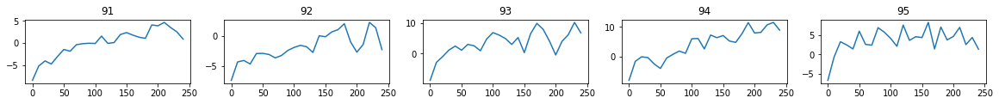

[TWITTER RESULT] r:23  f:5 => r:18 f:-18
# real:4921 / # fake:2021 => 4921
   >> EXP 96 / 100 -- last fitness: 13.47 | last twit score: -18.00 | last loss: 24.3779


epoch: 250 - fit: 6.84 - N: 9.00: 100%|██████████| 250/250 [00:12<00:00, 19.49it/s]


[TWITTER RESULT] r:24  f:8 => r:16 f:-16
# real:5002 / # fake:2057 => 5002
   >> EXP 97 / 100 -- last fitness: 6.84 | last twit score: -16.00 | last loss: 23.5688


epoch: 250 - fit: 7.38 - N: 11.00: 100%|██████████| 250/250 [00:20<00:00, 12.33it/s]


[TWITTER RESULT] r:17  f:13 => r:4 f:-4
# real:5066 / # fake:2121 => 5066
   >> EXP 98 / 100 -- last fitness: 7.38 | last twit score: -4.00 | last loss: 23.6666


epoch: 250 - fit: 18.27 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.81it/s]


[TWITTER RESULT] r:19  f:12 => r:7 f:-7
# real:5130 / # fake:2130 => 5130
   >> EXP 99 / 100 -- last fitness: 18.27 | last twit score: -7.00 | last loss: 24.1469


epoch: 250 - fit: 12.56 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 39.63it/s]


[TWITTER RESULT] r:16  f:11 => r:5 f:-5
# real:5155 / # fake:2139 => 5155
   >> EXP 100 / 100 -- last fitness: 12.56 | last twit score: -5.00 | last loss: 23.1948


epoch: 250 - fit: 21.37 - N: 6.12: 100%|██████████| 250/250 [00:06<00:00, 38.11it/s]


SHOWING FITNESS GRAPHS


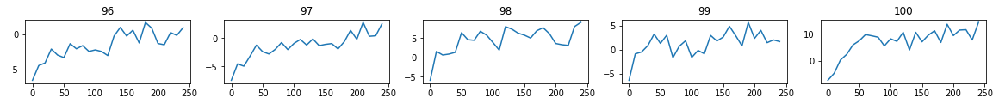

[TWITTER RESULT] r:8  f:10 => r:-2 f:2
# real:5204 / # fake:2148 => 5204
[9.93795, 10.052167, 16.060474, 21.634548, 13.47389, 6.8398075, 7.3792267, 18.272346, 12.555126, 21.374203]


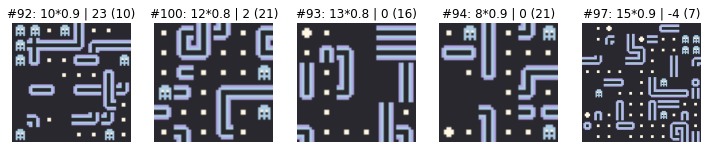

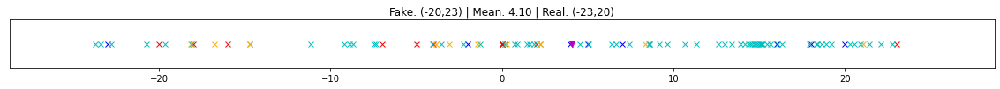

> dungeon tileset
 ------- TRIAL #1 --------
[TWITTER RESULT] r:23  f:-16 => r:39 f:-39
[TWITTER RESULT] r:22  f:-16 => r:38 f:-38
[TWITTER RESULT] r:16  f:-13 => r:29 f:-29
[TWITTER RESULT] r:23  f:-15 => r:38 f:-38
[TWITTER RESULT] r:17  f:-13 => r:30 f:-30
[TWITTER RESULT] r:22  f:-15 => r:37 f:-37
[TWITTER RESULT] r:29  f:-14 => r:43 f:-43
[TWITTER RESULT] r:22  f:-14 => r:36 f:-36
[TWITTER RESULT] r:7  f:-14 => r:21 f:-21
[TWITTER RESULT] r:12  f:-17 => r:29 f:-29
[TWITTER RESULT] r:15  f:-14 => r:29 f:-29
[TWITTER RESULT] r:17  f:-13 => r:30 f:-30
[TWITTER RESULT] r:20  f:-16 => r:36 f:-36
[TWITTER RESULT] r:12  f:-13 => r:25 f:-25
[TWITTER RESULT] r:15  f:-16 => r:31 f:-31
[TWITTER RESULT] r:9  f:-16 => r:25 f:-25
[TWITTER RESULT] r:12  f:-15 => r:27 f:-27
[TWITTER RESULT] r:20  f:-16 => r:36 f:-36
[TWITTER RESULT] r:15  f:-13 => r:28 f:-28
[TWITTER RESULT] r:22  f:-13 => r:35 f:-35
[TWITTER RESULT] r:22  f:-14 => r:36 f:-36
[TWITTER RESULT] r:15  f:-16 => r:31 f:-31
[TWITTER RE

epoch: 250 - fit: 36.09 - N: 10.00: 100%|██████████| 250/250 [00:14<00:00, 16.77it/s]


[TWITTER RESULT] r:8  f:10 => r:-2 f:2
# real:49 / # fake:49 => 49
   >> EXP 2 / 100 -- last fitness: 36.09 | last twit score: 2.00 | last loss: 13.0357


epoch: 250 - fit: 24.85 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.99it/s]


[TWITTER RESULT] r:19  f:2 => r:17 f:-17
# real:130 / # fake:58 => 130
   >> EXP 3 / 100 -- last fitness: 24.85 | last twit score: -17.00 | last loss: 25.4767


epoch: 250 - fit: 18.78 - N: 9.00: 100%|██████████| 250/250 [00:12<00:00, 20.21it/s]


[TWITTER RESULT] r:14  f:13 => r:1 f:-1
# real:211 / # fake:94 => 211
   >> EXP 4 / 100 -- last fitness: 18.78 | last twit score: -1.00 | last loss: 10.7047


epoch: 250 - fit: 17.33 - N: 6.94: 100%|██████████| 250/250 [00:07<00:00, 34.10it/s]


[TWITTER RESULT] r:21  f:13 => r:8 f:-8
# real:260 / # fake:110 => 260
   >> EXP 5 / 100 -- last fitness: 17.33 | last twit score: -8.00 | last loss: 13.4955


epoch: 250 - fit: 13.21 - N: 11.00: 100%|██████████| 250/250 [00:17<00:00, 13.89it/s]


SHOWING FITNESS GRAPHS


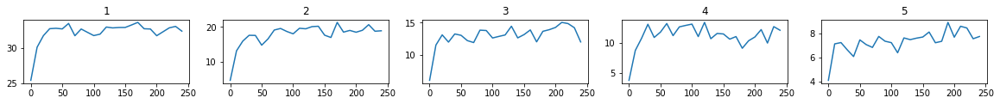

[TWITTER RESULT] r:-9  f:13 => r:-22 f:22
# real:285 / # fake:174 => 285
   >> EXP 6 / 100 -- last fitness: 13.21 | last twit score: 22.00 | last loss: 15.0056


epoch: 250 - fit: 18.37 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 26.75it/s]


[TWITTER RESULT] r:19  f:13 => r:6 f:-6
# real:334 / # fake:199 => 334
   >> EXP 7 / 100 -- last fitness: 18.37 | last twit score: -6.00 | last loss: 14.8507


epoch: 250 - fit: 16.78 - N: 11.00: 100%|██████████| 250/250 [00:18<00:00, 13.44it/s]


[TWITTER RESULT] r:17  f:13 => r:4 f:-4
# real:415 / # fake:263 => 415
   >> EXP 8 / 100 -- last fitness: 16.78 | last twit score: -4.00 | last loss: 18.7796


epoch: 250 - fit: 20.42 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 41.89it/s]


[TWITTER RESULT] r:15  f:11 => r:4 f:-4
# real:464 / # fake:272 => 464
   >> EXP 9 / 100 -- last fitness: 20.42 | last twit score: -4.00 | last loss: 13.4204


epoch: 250 - fit: 15.33 - N: 7.00: 100%|██████████| 250/250 [00:08<00:00, 30.59it/s]


[TWITTER RESULT] r:11  f:12 => r:-1 f:1
# real:528 / # fake:288 => 528
   >> EXP 10 / 100 -- last fitness: 15.33 | last twit score: 1.00 | last loss: 11.8046


epoch: 250 - fit: 7.50 - N: 11.00: 100%|██████████| 250/250 [00:20<00:00, 12.44it/s]


SHOWING FITNESS GRAPHS


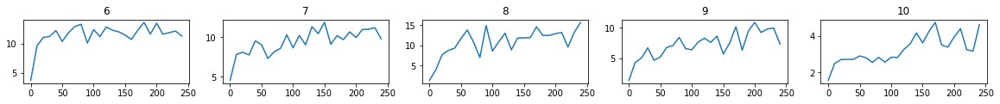

[TWITTER RESULT] r:18  f:15 => r:3 f:-3
# real:544 / # fake:352 => 544
[36.089207, 24.847708, 18.781847, 17.327192, 13.211504, 18.373625, 16.775768, 20.415083, 15.333785, 7.49878]


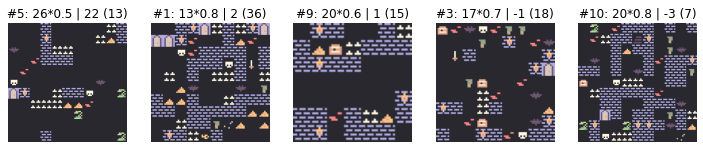

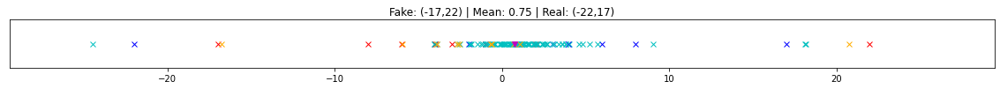

   >> EXP 11 / 100 -- last fitness: 7.50 | last twit score: -3.00 | last loss: 11.0168


epoch: 250 - fit: 19.29 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.31it/s]


[TWITTER RESULT] r:11  f:14 => r:-3 f:3
# real:593 / # fake:361 => 593
   >> EXP 12 / 100 -- last fitness: 19.29 | last twit score: 3.00 | last loss: 9.2130


epoch: 250 - fit: 13.62 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 26.58it/s]


[TWITTER RESULT] r:13  f:15 => r:-2 f:2
# real:602 / # fake:386 => 602
   >> EXP 13 / 100 -- last fitness: 13.62 | last twit score: 2.00 | last loss: 8.4194


epoch: 250 - fit: 8.53 - N: 11.00: 100%|██████████| 250/250 [00:18<00:00, 13.58it/s]


[TWITTER RESULT] r:19  f:13 => r:6 f:-6
# real:651 / # fake:450 => 651
   >> EXP 14 / 100 -- last fitness: 8.53 | last twit score: -6.00 | last loss: 9.8788


epoch: 250 - fit: 17.28 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.78it/s]


[TWITTER RESULT] r:15  f:15 => r:0 f:0
# real:700 / # fake:459 => 700
   >> EXP 15 / 100 -- last fitness: 17.28 | last twit score: 0.00 | last loss: 8.0625


epoch: 250 - fit: 10.60 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.41it/s]


SHOWING FITNESS GRAPHS


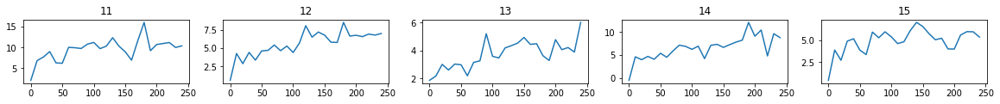

[TWITTER RESULT] r:17  f:8 => r:9 f:-9
# real:749 / # fake:468 => 749
   >> EXP 16 / 100 -- last fitness: 10.60 | last twit score: -9.00 | last loss: 8.9302


epoch: 250 - fit: 14.23 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.81it/s]


[TWITTER RESULT] r:23  f:13 => r:10 f:-10
# real:830 / # fake:477 => 830
   >> EXP 17 / 100 -- last fitness: 14.23 | last twit score: -10.00 | last loss: 10.1945


epoch: 250 - fit: 16.30 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.51it/s]


[TWITTER RESULT] r:8  f:13 => r:-5 f:5
# real:879 / # fake:486 => 879
   >> EXP 18 / 100 -- last fitness: 16.30 | last twit score: 5.00 | last loss: 9.4703


epoch: 250 - fit: 5.83 - N: 12.00: 100%|██████████| 250/250 [00:22<00:00, 11.33it/s]


[TWITTER RESULT] r:13  f:14 => r:-1 f:1
# real:928 / # fake:567 => 928
   >> EXP 19 / 100 -- last fitness: 5.83 | last twit score: 1.00 | last loss: 8.8082


epoch: 250 - fit: 6.12 - N: 11.00: 100%|██████████| 250/250 [00:18<00:00, 13.80it/s]


[TWITTER RESULT] r:22  f:12 => r:10 f:-10
# real:937 / # fake:631 => 937
   >> EXP 20 / 100 -- last fitness: 6.12 | last twit score: -10.00 | last loss: 10.1197


epoch: 250 - fit: 10.74 - N: 6.00: 100%|██████████| 250/250 [00:07<00:00, 33.44it/s]


SHOWING FITNESS GRAPHS


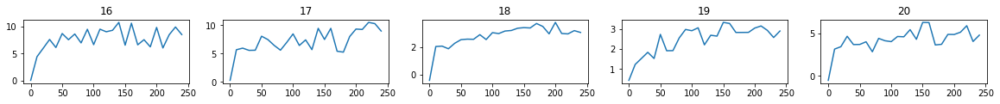

[TWITTER RESULT] r:10  f:13 => r:-3 f:3
# real:1018 / # fake:640 => 1018
[19.294203, 13.622746, 8.532778, 17.275581, 10.60255, 14.232193, 16.299269, 5.828782, 6.1151857, 10.741321]


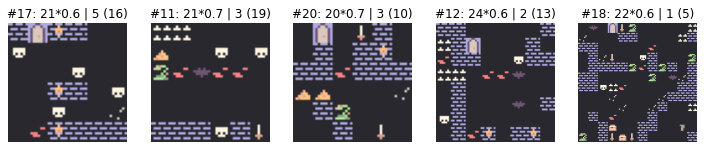

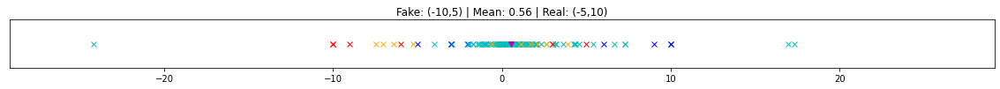

   >> EXP 21 / 100 -- last fitness: 10.74 | last twit score: 3.00 | last loss: 8.9733


epoch: 250 - fit: 4.75 - N: 11.94: 100%|██████████| 250/250 [00:22<00:00, 11.33it/s]


[TWITTER RESULT] r:26  f:15 => r:11 f:-11
# real:1067 / # fake:704 => 1067
   >> EXP 22 / 100 -- last fitness: 4.75 | last twit score: -11.00 | last loss: 13.2626


epoch: 250 - fit: 9.35 - N: 8.06: 100%|██████████| 250/250 [00:09<00:00, 26.51it/s]


[TWITTER RESULT] r:15  f:14 => r:1 f:-1
# real:1116 / # fake:729 => 1116
   >> EXP 23 / 100 -- last fitness: 9.35 | last twit score: -1.00 | last loss: 11.0979


epoch: 250 - fit: 11.34 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 33.01it/s]


[TWITTER RESULT] r:16  f:8 => r:8 f:-8
# real:1132 / # fake:745 => 1132
   >> EXP 24 / 100 -- last fitness: 11.34 | last twit score: -8.00 | last loss: 8.8245


epoch: 250 - fit: 12.20 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.82it/s]


[TWITTER RESULT] r:16  f:10 => r:6 f:-6
# real:1181 / # fake:754 => 1181
   >> EXP 25 / 100 -- last fitness: 12.20 | last twit score: -6.00 | last loss: 9.2570


epoch: 250 - fit: 7.21 - N: 11.00: 100%|██████████| 250/250 [00:18<00:00, 13.24it/s]


SHOWING FITNESS GRAPHS


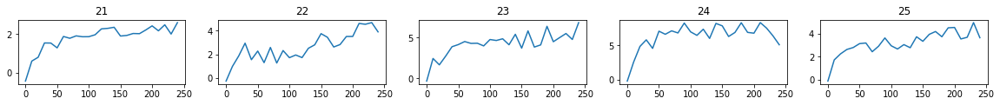

[TWITTER RESULT] r:11  f:14 => r:-3 f:3
# real:1262 / # fake:818 => 1262
   >> EXP 26 / 100 -- last fitness: 7.21 | last twit score: 3.00 | last loss: 8.2414


epoch: 250 - fit: 7.33 - N: 9.00: 100%|██████████| 250/250 [00:12<00:00, 19.34it/s]


[TWITTER RESULT] r:9  f:7 => r:2 f:-2
# real:1311 / # fake:854 => 1311
   >> EXP 27 / 100 -- last fitness: 7.33 | last twit score: -2.00 | last loss: 7.2961


epoch: 250 - fit: 13.69 - N: 6.06: 100%|██████████| 250/250 [00:06<00:00, 38.99it/s]


[TWITTER RESULT] r:8  f:12 => r:-4 f:4
# real:1392 / # fake:863 => 1392
   >> EXP 28 / 100 -- last fitness: 13.69 | last twit score: 4.00 | last loss: 7.5783


epoch: 250 - fit: 5.45 - N: 10.06: 100%|██████████| 250/250 [00:15<00:00, 16.31it/s]


[TWITTER RESULT] r:20  f:16 => r:4 f:-4
# real:1441 / # fake:912 => 1441
   >> EXP 29 / 100 -- last fitness: 5.45 | last twit score: -4.00 | last loss: 7.5602


epoch: 250 - fit: 9.12 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 31.47it/s]


[TWITTER RESULT] r:-4  f:13 => r:-17 f:17
# real:1490 / # fake:928 => 1490
   >> EXP 30 / 100 -- last fitness: 9.12 | last twit score: 17.00 | last loss: 9.1158


epoch: 250 - fit: 6.39 - N: 9.06: 100%|██████████| 250/250 [00:14<00:00, 16.81it/s] 


SHOWING FITNESS GRAPHS


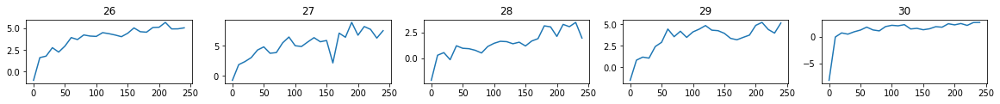

[TWITTER RESULT] r:14  f:13 => r:1 f:-1
# real:1554 / # fake:964 => 1554
[4.745227, 9.347582, 11.341095, 12.200977, 7.2088337, 7.3270655, 13.689889, 5.44729, 9.121786, 6.3930755]


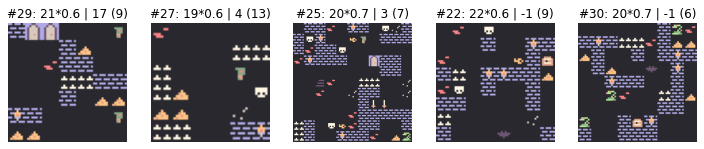

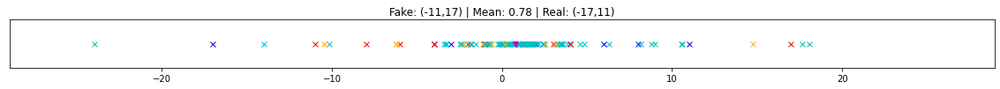

   >> EXP 31 / 100 -- last fitness: 6.39 | last twit score: -1.00 | last loss: 8.2497


epoch: 250 - fit: 11.77 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.14it/s]


[TWITTER RESULT] r:11  f:13 => r:-2 f:2
# real:1603 / # fake:973 => 1603
   >> EXP 32 / 100 -- last fitness: 11.77 | last twit score: 2.00 | last loss: 8.0196


epoch: 250 - fit: 9.01 - N: 6.00: 100%|██████████| 250/250 [00:07<00:00, 35.49it/s]


[TWITTER RESULT] r:20  f:9 => r:11 f:-11
# real:1684 / # fake:982 => 1684
   >> EXP 33 / 100 -- last fitness: 9.01 | last twit score: -11.00 | last loss: 9.7767


epoch: 250 - fit: 9.74 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 43.71it/s]


[TWITTER RESULT] r:25  f:7 => r:18 f:-18
# real:1765 / # fake:991 => 1765
   >> EXP 34 / 100 -- last fitness: 9.74 | last twit score: -18.00 | last loss: 9.9344


epoch: 250 - fit: 9.97 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 39.20it/s]


[TWITTER RESULT] r:7  f:13 => r:-6 f:6
# real:1814 / # fake:1000 => 1814
   >> EXP 35 / 100 -- last fitness: 9.97 | last twit score: 6.00 | last loss: 9.8550


epoch: 250 - fit: 7.61 - N: 10.00: 100%|██████████| 250/250 [00:15<00:00, 15.83it/s]


SHOWING FITNESS GRAPHS


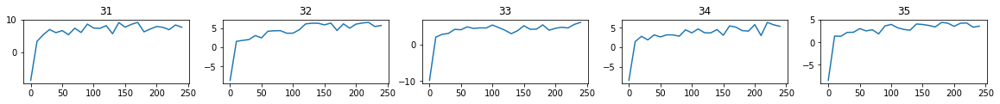

[TWITTER RESULT] r:18  f:14 => r:4 f:-4
# real:1895 / # fake:1049 => 1895
   >> EXP 36 / 100 -- last fitness: 7.61 | last twit score: -4.00 | last loss: 9.3407


epoch: 250 - fit: 10.79 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 40.77it/s]


[TWITTER RESULT] r:23  f:14 => r:9 f:-9
# real:1976 / # fake:1058 => 1976
   >> EXP 37 / 100 -- last fitness: 10.79 | last twit score: -9.00 | last loss: 11.3795


epoch: 250 - fit: 10.05 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.99it/s]


[TWITTER RESULT] r:8  f:11 => r:-3 f:3
# real:2025 / # fake:1067 => 2025
   >> EXP 38 / 100 -- last fitness: 10.05 | last twit score: 3.00 | last loss: 10.3569


epoch: 250 - fit: 9.30 - N: 7.06: 100%|██████████| 250/250 [00:07<00:00, 33.25it/s]


[TWITTER RESULT] r:12  f:12 => r:0 f:0
# real:2074 / # fake:1083 => 2074
   >> EXP 39 / 100 -- last fitness: 9.30 | last twit score: 0.00 | last loss: 9.5039


epoch: 250 - fit: 11.05 - N: 6.06: 100%|██████████| 250/250 [00:08<00:00, 30.01it/s]


[TWITTER RESULT] r:12  f:14 => r:-2 f:2
# real:2123 / # fake:1092 => 2123
   >> EXP 40 / 100 -- last fitness: 11.05 | last twit score: 2.00 | last loss: 9.4678


epoch: 250 - fit: 8.55 - N: 6.94: 100%|██████████| 250/250 [00:07<00:00, 32.90it/s]


SHOWING FITNESS GRAPHS


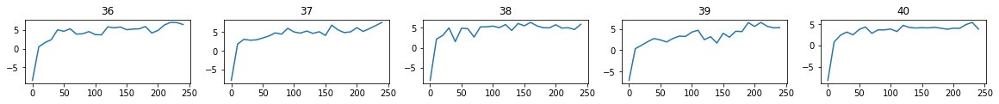

[TWITTER RESULT] r:14  f:7 => r:7 f:-7
# real:2172 / # fake:1108 => 2172
[11.77209, 9.013387, 9.743616, 9.967609, 7.610064, 10.794088, 10.052475, 9.295017, 11.053117, 8.554269]


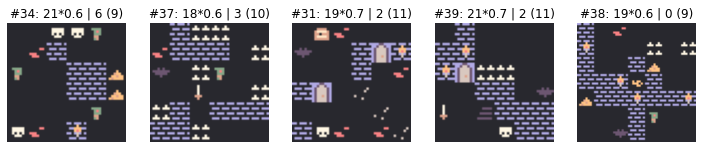

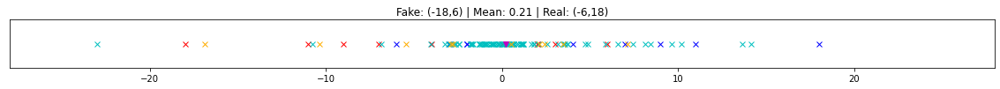

   >> EXP 41 / 100 -- last fitness: 8.55 | last twit score: -7.00 | last loss: 9.8220


epoch: 250 - fit: 6.13 - N: 9.00: 100%|██████████| 250/250 [00:12<00:00, 19.96it/s]


[TWITTER RESULT] r:11  f:15 => r:-4 f:4
# real:2221 / # fake:1144 => 2221
   >> EXP 42 / 100 -- last fitness: 6.13 | last twit score: 4.00 | last loss: 9.4837


epoch: 250 - fit: 10.71 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.46it/s]


[TWITTER RESULT] r:14  f:12 => r:2 f:-2
# real:2302 / # fake:1153 => 2302
   >> EXP 43 / 100 -- last fitness: 10.71 | last twit score: -2.00 | last loss: 9.8689


epoch: 250 - fit: 6.29 - N: 10.00: 100%|██████████| 250/250 [00:15<00:00, 16.46it/s]


[TWITTER RESULT] r:17  f:14 => r:3 f:-3
# real:2351 / # fake:1202 => 2351
   >> EXP 44 / 100 -- last fitness: 6.29 | last twit score: -3.00 | last loss: 9.5787


epoch: 250 - fit: 4.55 - N: 11.12: 100%|██████████| 250/250 [00:18<00:00, 13.21it/s]


[TWITTER RESULT] r:20  f:15 => r:5 f:-5
# real:2400 / # fake:1266 => 2400
   >> EXP 45 / 100 -- last fitness: 4.55 | last twit score: -5.00 | last loss: 9.5485


epoch: 250 - fit: 9.36 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.81it/s]


SHOWING FITNESS GRAPHS


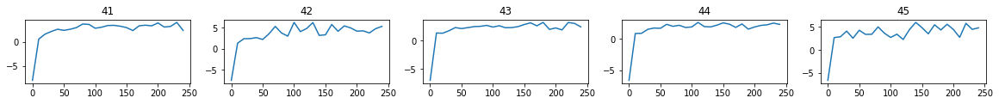

[TWITTER RESULT] r:8  f:11 => r:-3 f:3
# real:2449 / # fake:1275 => 2449
   >> EXP 46 / 100 -- last fitness: 9.36 | last twit score: 3.00 | last loss: 9.9293


epoch: 250 - fit: 4.30 - N: 11.00: 100%|██████████| 250/250 [00:18<00:00, 13.59it/s]


[TWITTER RESULT] r:12  f:15 => r:-3 f:3
# real:2498 / # fake:1339 => 2498
   >> EXP 47 / 100 -- last fitness: 4.30 | last twit score: 3.00 | last loss: 9.4047


epoch: 250 - fit: 7.50 - N: 8.06: 100%|██████████| 250/250 [00:09<00:00, 26.16it/s]


[TWITTER RESULT] r:6  f:13 => r:-7 f:7
# real:2547 / # fake:1364 => 2547
   >> EXP 48 / 100 -- last fitness: 7.50 | last twit score: 7.00 | last loss: 9.5097


epoch: 250 - fit: 4.58 - N: 11.06: 100%|██████████| 250/250 [00:20<00:00, 12.35it/s]


[TWITTER RESULT] r:17  f:15 => r:2 f:-2
# real:2563 / # fake:1428 => 2563
   >> EXP 49 / 100 -- last fitness: 4.58 | last twit score: -2.00 | last loss: 10.0953


epoch: 250 - fit: 7.71 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 38.72it/s]


[TWITTER RESULT] r:17  f:8 => r:9 f:-9
# real:2612 / # fake:1437 => 2612
   >> EXP 50 / 100 -- last fitness: 7.71 | last twit score: -9.00 | last loss: 11.2920


epoch: 250 - fit: 7.98 - N: 8.00: 100%|██████████| 250/250 [00:10<00:00, 23.38it/s]


SHOWING FITNESS GRAPHS


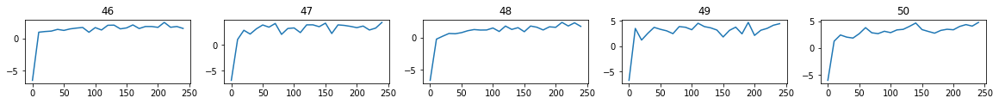

[TWITTER RESULT] r:14  f:15 => r:-1 f:1
# real:2676 / # fake:1462 => 2676
[6.125391, 10.705571, 6.294961, 4.5470405, 9.357258, 4.298089, 7.501325, 4.579176, 7.7106476, 7.9778204]


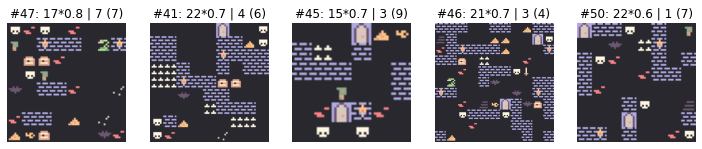

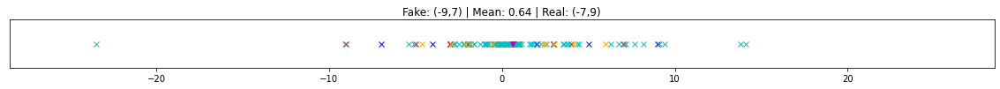

   >> EXP 51 / 100 -- last fitness: 7.98 | last twit score: 1.00 | last loss: 10.5902


epoch: 250 - fit: 6.16 - N: 9.00: 100%|██████████| 250/250 [00:13<00:00, 19.21it/s]


[TWITTER RESULT] r:11  f:14 => r:-3 f:3
# real:2725 / # fake:1498 => 2725
   >> EXP 52 / 100 -- last fitness: 6.16 | last twit score: 3.00 | last loss: 10.0806


epoch: 250 - fit: 7.05 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 26.82it/s]


[TWITTER RESULT] r:19  f:14 => r:5 f:-5
# real:2774 / # fake:1523 => 2774
   >> EXP 53 / 100 -- last fitness: 7.05 | last twit score: -5.00 | last loss: 10.7915


epoch: 250 - fit: 7.52 - N: 6.69: 100%|██████████| 250/250 [00:07<00:00, 34.16it/s]


[TWITTER RESULT] r:18  f:9 => r:9 f:-9
# real:2823 / # fake:1539 => 2823
   >> EXP 54 / 100 -- last fitness: 7.52 | last twit score: -9.00 | last loss: 10.9052


epoch: 250 - fit: 9.09 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.30it/s]


[TWITTER RESULT] r:16  f:9 => r:7 f:-7
# real:2904 / # fake:1548 => 2904
   >> EXP 55 / 100 -- last fitness: 9.09 | last twit score: -7.00 | last loss: 10.9689


epoch: 250 - fit: 10.82 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 42.90it/s]


SHOWING FITNESS GRAPHS


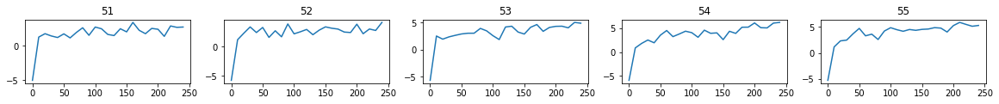

[TWITTER RESULT] r:18  f:14 => r:4 f:-4
# real:2985 / # fake:1557 => 2985
   >> EXP 56 / 100 -- last fitness: 10.82 | last twit score: -4.00 | last loss: 10.6258


epoch: 250 - fit: 10.63 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 39.88it/s]


[TWITTER RESULT] r:-13  f:13 => r:-26 f:26
# real:3021 / # fake:1566 => 3021
   >> EXP 57 / 100 -- last fitness: 10.63 | last twit score: 26.00 | last loss: 10.6402


epoch: 250 - fit: 8.27 - N: 6.00: 100%|██████████| 250/250 [00:07<00:00, 33.21it/s]


[TWITTER RESULT] r:14  f:14 => r:0 f:0
# real:3070 / # fake:1575 => 3070
   >> EXP 58 / 100 -- last fitness: 8.27 | last twit score: 0.00 | last loss: 10.1346


epoch: 250 - fit: 11.11 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 31.38it/s]


[TWITTER RESULT] r:17  f:10 => r:7 f:-7
# real:3119 / # fake:1591 => 3119
   >> EXP 59 / 100 -- last fitness: 11.11 | last twit score: -7.00 | last loss: 10.5477


epoch: 250 - fit: 7.94 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 41.21it/s]


[TWITTER RESULT] r:16  f:12 => r:4 f:-4
# real:3168 / # fake:1600 => 3168
   >> EXP 60 / 100 -- last fitness: 7.94 | last twit score: -4.00 | last loss: 10.0497


epoch: 250 - fit: 5.59 - N: 9.19: 100%|██████████| 250/250 [00:14<00:00, 17.53it/s]


SHOWING FITNESS GRAPHS


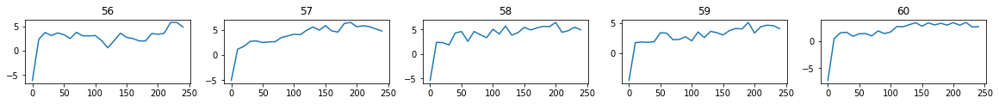

[TWITTER RESULT] r:15  f:12 => r:3 f:-3
# real:3217 / # fake:1636 => 3217
[6.1635003, 7.0521836, 7.5161676, 9.090146, 10.823923, 10.628663, 8.271148, 11.107876, 7.9404316, 5.591398]


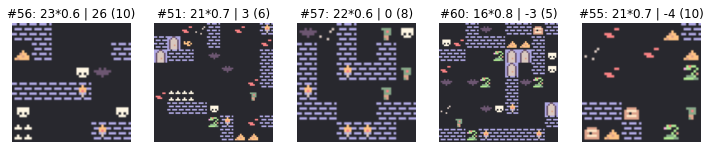

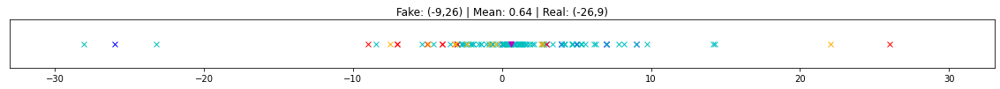

   >> EXP 61 / 100 -- last fitness: 5.59 | last twit score: -3.00 | last loss: 10.1006


epoch: 250 - fit: 7.94 - N: 6.12: 100%|██████████| 250/250 [00:06<00:00, 36.18it/s]


[TWITTER RESULT] r:19  f:11 => r:8 f:-8
# real:3266 / # fake:1645 => 3266
   >> EXP 62 / 100 -- last fitness: 7.94 | last twit score: -8.00 | last loss: 10.4998


epoch: 250 - fit: 7.27 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 26.28it/s]


[TWITTER RESULT] r:17  f:12 => r:5 f:-5
# real:3330 / # fake:1670 => 3330
   >> EXP 63 / 100 -- last fitness: 7.27 | last twit score: -5.00 | last loss: 10.2573


epoch: 250 - fit: 7.61 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.77it/s]


[TWITTER RESULT] r:25  f:11 => r:14 f:-14
# real:3379 / # fake:1679 => 3379
   >> EXP 64 / 100 -- last fitness: 7.61 | last twit score: -14.00 | last loss: 11.2748


epoch: 250 - fit: 8.23 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.72it/s]


[TWITTER RESULT] r:14  f:11 => r:3 f:-3
# real:3428 / # fake:1688 => 3428
   >> EXP 65 / 100 -- last fitness: 8.23 | last twit score: -3.00 | last loss: 10.9390


epoch: 250 - fit: 9.32 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.29it/s]


SHOWING FITNESS GRAPHS


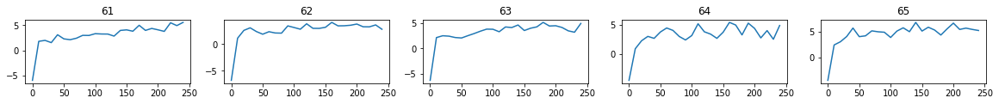

[TWITTER RESULT] r:14  f:12 => r:2 f:-2
# real:3444 / # fake:1697 => 3444
   >> EXP 66 / 100 -- last fitness: 9.32 | last twit score: -2.00 | last loss: 10.3118


epoch: 250 - fit: 8.65 - N: 6.00: 100%|██████████| 250/250 [00:07<00:00, 35.25it/s]


[TWITTER RESULT] r:8  f:12 => r:-4 f:4
# real:3508 / # fake:1706 => 3508
   >> EXP 67 / 100 -- last fitness: 8.65 | last twit score: 4.00 | last loss: 10.2180


epoch: 250 - fit: 6.79 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.15it/s]


[TWITTER RESULT] r:17  f:14 => r:3 f:-3
# real:3557 / # fake:1715 => 3557
   >> EXP 68 / 100 -- last fitness: 6.79 | last twit score: -3.00 | last loss: 9.7932


epoch: 250 - fit: 6.20 - N: 7.00: 100%|██████████| 250/250 [00:08<00:00, 31.10it/s]


[TWITTER RESULT] r:17  f:12 => r:5 f:-5
# real:3606 / # fake:1731 => 3606
   >> EXP 69 / 100 -- last fitness: 6.20 | last twit score: -5.00 | last loss: 9.6708


epoch: 250 - fit: 5.14 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 26.99it/s]


[TWITTER RESULT] r:-7  f:15 => r:-22 f:22
# real:3631 / # fake:1756 => 3631
   >> EXP 70 / 100 -- last fitness: 5.14 | last twit score: 22.00 | last loss: 10.3694


epoch: 250 - fit: 4.30 - N: 11.06: 100%|██████████| 250/250 [00:21<00:00, 11.53it/s]


SHOWING FITNESS GRAPHS


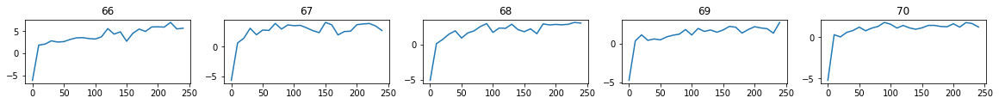

[TWITTER RESULT] r:20  f:14 => r:6 f:-6
# real:3647 / # fake:1820 => 3647
[7.9445004, 7.270111, 7.6094294, 8.225836, 9.32045, 8.645656, 6.792755, 6.2012534, 5.139253, 4.3005013]


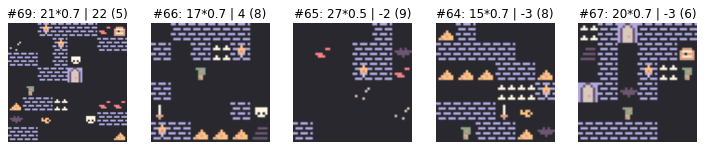

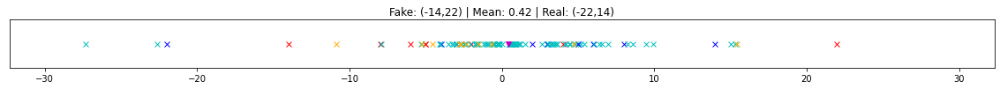

   >> EXP 71 / 100 -- last fitness: 4.30 | last twit score: -6.00 | last loss: 10.4712


epoch: 250 - fit: 5.42 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 33.83it/s]


[TWITTER RESULT] r:16  f:11 => r:5 f:-5
# real:3728 / # fake:1836 => 3728
   >> EXP 72 / 100 -- last fitness: 5.42 | last twit score: -5.00 | last loss: 10.5634


epoch: 250 - fit: 10.27 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 35.85it/s]


[TWITTER RESULT] r:15  f:13 => r:2 f:-2
# real:3792 / # fake:1845 => 3792
   >> EXP 73 / 100 -- last fitness: 10.27 | last twit score: -2.00 | last loss: 10.2258


epoch: 250 - fit: 10.05 - N: 6.00: 100%|██████████| 250/250 [00:07<00:00, 35.51it/s]


[TWITTER RESULT] r:20  f:14 => r:6 f:-6
# real:3841 / # fake:1854 => 3841
   >> EXP 74 / 100 -- last fitness: 10.05 | last twit score: -6.00 | last loss: 11.1216


epoch: 250 - fit: 7.32 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 32.45it/s]


[TWITTER RESULT] r:22  f:14 => r:8 f:-8
# real:3922 / # fake:1870 => 3922
   >> EXP 75 / 100 -- last fitness: 7.32 | last twit score: -8.00 | last loss: 11.2446


epoch: 250 - fit: 7.72 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 41.58it/s]


SHOWING FITNESS GRAPHS


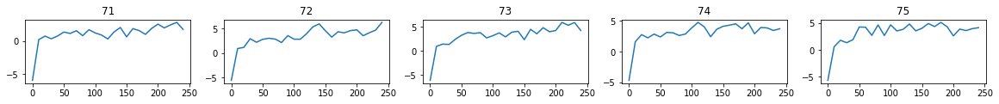

[TWITTER RESULT] r:17  f:8 => r:9 f:-9
# real:3971 / # fake:1879 => 3971
   >> EXP 76 / 100 -- last fitness: 7.72 | last twit score: -9.00 | last loss: 10.9331


epoch: 250 - fit: 10.66 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 45.50it/s]


[TWITTER RESULT] r:20  f:16 => r:4 f:-4
# real:3987 / # fake:1888 => 3987
   >> EXP 77 / 100 -- last fitness: 10.66 | last twit score: -4.00 | last loss: 10.9540


epoch: 250 - fit: 7.23 - N: 7.06: 100%|██████████| 250/250 [00:07<00:00, 35.09it/s]


[TWITTER RESULT] r:14  f:16 => r:-2 f:2
# real:4036 / # fake:1904 => 4036
   >> EXP 78 / 100 -- last fitness: 7.23 | last twit score: 2.00 | last loss: 11.9862


epoch: 250 - fit: 10.36 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 43.03it/s]


[TWITTER RESULT] r:12  f:9 => r:3 f:-3
# real:4085 / # fake:1913 => 4085
   >> EXP 79 / 100 -- last fitness: 10.36 | last twit score: -3.00 | last loss: 11.4894


epoch: 250 - fit: 10.74 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 44.46it/s]


[TWITTER RESULT] r:16  f:11 => r:5 f:-5
# real:4134 / # fake:1922 => 4134
   >> EXP 80 / 100 -- last fitness: 10.74 | last twit score: -5.00 | last loss: 11.6428


epoch: 250 - fit: 8.56 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 36.62it/s]


SHOWING FITNESS GRAPHS


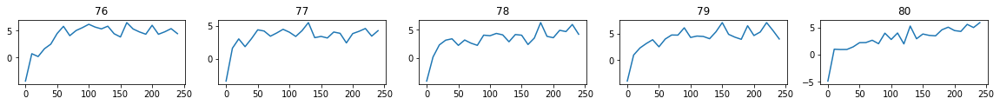

[TWITTER RESULT] r:12  f:11 => r:1 f:-1
# real:4183 / # fake:1931 => 4183
[5.422273, 10.274035, 10.050659, 7.3226414, 7.720442, 10.660872, 7.2341194, 10.355928, 10.741548, 8.564224]


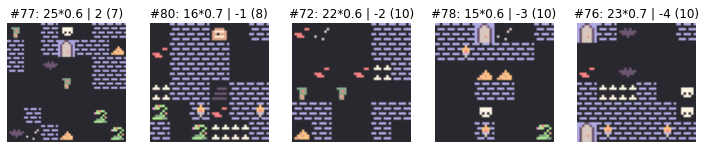

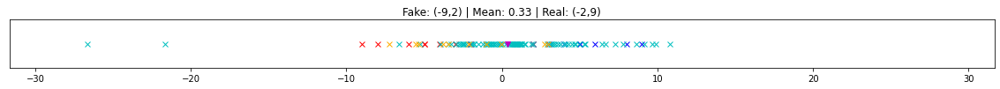

   >> EXP 81 / 100 -- last fitness: 8.56 | last twit score: -1.00 | last loss: 11.0404


epoch: 250 - fit: 9.06 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.25it/s]


[TWITTER RESULT] r:12  f:13 => r:-1 f:1
# real:4232 / # fake:1940 => 4232
   >> EXP 82 / 100 -- last fitness: 9.06 | last twit score: 1.00 | last loss: 11.0390


epoch: 250 - fit: 11.80 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 39.81it/s]


[TWITTER RESULT] r:17  f:10 => r:7 f:-7
# real:4313 / # fake:1949 => 4313
   >> EXP 83 / 100 -- last fitness: 11.80 | last twit score: -7.00 | last loss: 11.3487


epoch: 250 - fit: 3.41 - N: 12.00: 100%|██████████| 250/250 [00:21<00:00, 11.73it/s]


[TWITTER RESULT] r:17  f:13 => r:4 f:-4
# real:4362 / # fake:2030 => 4362
   >> EXP 84 / 100 -- last fitness: 3.41 | last twit score: -4.00 | last loss: 11.1744


epoch: 250 - fit: 6.09 - N: 8.00: 100%|██████████| 250/250 [00:09<00:00, 26.24it/s]


[TWITTER RESULT] r:15  f:12 => r:3 f:-3
# real:4371 / # fake:2055 => 4371
   >> EXP 85 / 100 -- last fitness: 6.09 | last twit score: -3.00 | last loss: 11.2567


epoch: 250 - fit: 4.71 - N: 10.00: 100%|██████████| 250/250 [00:15<00:00, 16.22it/s]


SHOWING FITNESS GRAPHS


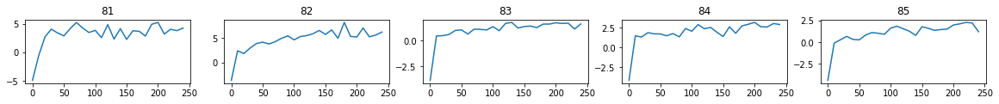

[TWITTER RESULT] r:11  f:14 => r:-3 f:3
# real:4420 / # fake:2104 => 4420
   >> EXP 86 / 100 -- last fitness: 4.71 | last twit score: 3.00 | last loss: 11.0582


epoch: 250 - fit: 3.44 - N: 11.06: 100%|██████████| 250/250 [00:19<00:00, 12.55it/s]


[TWITTER RESULT] r:21  f:14 => r:7 f:-7
# real:4469 / # fake:2168 => 4469
   >> EXP 87 / 100 -- last fitness: 3.44 | last twit score: -7.00 | last loss: 11.6449


epoch: 250 - fit: 8.95 - N: 7.00: 100%|██████████| 250/250 [00:07<00:00, 33.84it/s]


[TWITTER RESULT] r:9  f:8 => r:1 f:-1
# real:4518 / # fake:2184 => 4518
   >> EXP 88 / 100 -- last fitness: 8.95 | last twit score: -1.00 | last loss: 11.4346


epoch: 250 - fit: 11.75 - N: 6.00: 100%|██████████| 250/250 [00:07<00:00, 32.00it/s]


[TWITTER RESULT] r:11  f:13 => r:-2 f:2
# real:4567 / # fake:2193 => 4567
   >> EXP 89 / 100 -- last fitness: 11.75 | last twit score: 2.00 | last loss: 11.3662


epoch: 250 - fit: 16.15 - N: 6.06: 100%|██████████| 250/250 [00:07<00:00, 35.44it/s]


[TWITTER RESULT] r:24  f:14 => r:10 f:-10
# real:4583 / # fake:2202 => 4583
   >> EXP 90 / 100 -- last fitness: 16.15 | last twit score: -10.00 | last loss: 11.3734


epoch: 250 - fit: 6.53 - N: 7.00: 100%|██████████| 250/250 [00:09<00:00, 26.39it/s]


SHOWING FITNESS GRAPHS


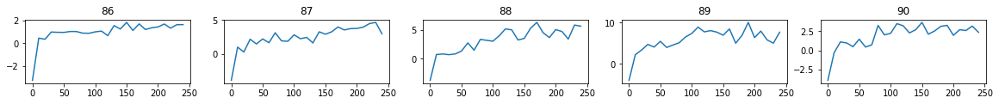

[TWITTER RESULT] r:22  f:13 => r:9 f:-9
# real:4632 / # fake:2218 => 4632
[9.056236, 11.795053, 3.407772, 6.0883527, 4.709687, 3.4400141, 8.9544735, 11.747625, 16.148684, 6.530168]


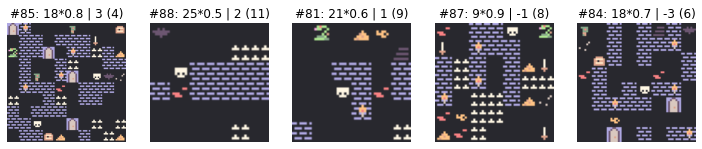

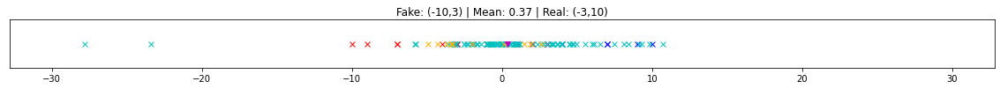

   >> EXP 91 / 100 -- last fitness: 6.53 | last twit score: -9.00 | last loss: 11.5920


epoch: 250 - fit: 4.90 - N: 8.00: 100%|██████████| 250/250 [00:10<00:00, 23.53it/s]


[TWITTER RESULT] r:11  f:14 => r:-3 f:3
# real:4713 / # fake:2243 => 4713
   >> EXP 92 / 100 -- last fitness: 4.90 | last twit score: 3.00 | last loss: 11.1056


epoch: 250 - fit: 8.74 - N: 6.00: 100%|██████████| 250/250 [00:07<00:00, 35.22it/s]


[TWITTER RESULT] r:16  f:9 => r:7 f:-7
# real:4762 / # fake:2252 => 4762
   >> EXP 93 / 100 -- last fitness: 8.74 | last twit score: -7.00 | last loss: 11.2375


epoch: 250 - fit: 3.98 - N: 9.00: 100%|██████████| 250/250 [00:12<00:00, 20.10it/s]


[TWITTER RESULT] r:14  f:12 => r:2 f:-2
# real:4811 / # fake:2288 => 4811
   >> EXP 94 / 100 -- last fitness: 3.98 | last twit score: -2.00 | last loss: 11.5153


epoch: 250 - fit: 9.21 - N: 6.00: 100%|██████████| 250/250 [00:05<00:00, 42.68it/s]


[TWITTER RESULT] r:17  f:7 => r:10 f:-10
# real:4892 / # fake:2297 => 4892
   >> EXP 95 / 100 -- last fitness: 9.21 | last twit score: -10.00 | last loss: 11.6149


epoch: 250 - fit: 8.22 - N: 6.00: 100%|██████████| 250/250 [00:06<00:00, 41.66it/s]


SHOWING FITNESS GRAPHS


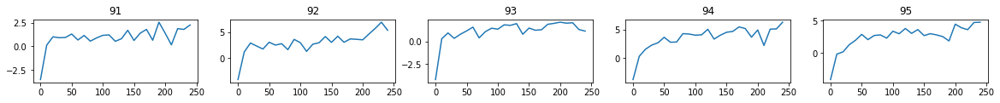

[TWITTER RESULT] r:20  f:13 => r:7 f:-7
# real:4973 / # fake:2306 => 4973
   >> EXP 96 / 100 -- last fitness: 8.22 | last twit score: -7.00 | last loss: 11.5608


epoch: 250 - fit: 11.85 - N: 6.00: 100%|██████████| 250/250 [00:07<00:00, 31.42it/s]


[TWITTER RESULT] r:20  f:12 => r:8 f:-8
# real:5022 / # fake:2315 => 5022
   >> EXP 97 / 100 -- last fitness: 11.85 | last twit score: -8.00 | last loss: 11.9709


epoch: 250 - fit: 9.30 - N: 6.06: 100%|██████████| 250/250 [00:05<00:00, 41.84it/s]


[TWITTER RESULT] r:7  f:14 => r:-7 f:7
# real:5103 / # fake:2324 => 5103
   >> EXP 98 / 100 -- last fitness: 9.30 | last twit score: 7.00 | last loss: 11.6525


epoch: 250 - fit: 3.74 - N: 11.00: 100%|██████████| 250/250 [00:19<00:00, 12.92it/s]


[TWITTER RESULT] r:22  f:16 => r:6 f:-6
# real:5152 / # fake:2388 => 5152
   >> EXP 99 / 100 -- last fitness: 3.74 | last twit score: -6.00 | last loss: 12.4521


epoch: 250 - fit: 6.94 - N: 7.00: 100%|██████████| 250/250 [00:09<00:00, 26.95it/s]


[TWITTER RESULT] r:20  f:11 => r:9 f:-9
# real:5168 / # fake:2404 => 5168
   >> EXP 100 / 100 -- last fitness: 6.94 | last twit score: -9.00 | last loss: 11.9312


epoch: 250 - fit: 4.07 - N: 10.00: 100%|██████████| 250/250 [00:15<00:00, 16.03it/s]


SHOWING FITNESS GRAPHS


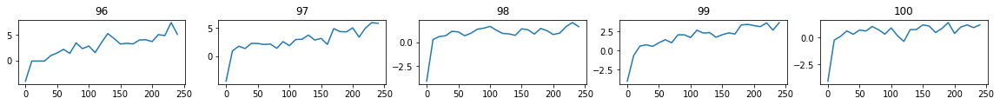

[TWITTER RESULT] r:-7  f:13 => r:-20 f:20
# real:5204 / # fake:2453 => 5204
[4.896233, 8.743616, 3.9752884, 9.2095995, 8.217072, 11.847532, 9.300597, 3.7388012, 6.939022, 4.072024]


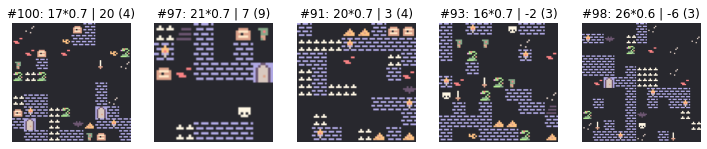

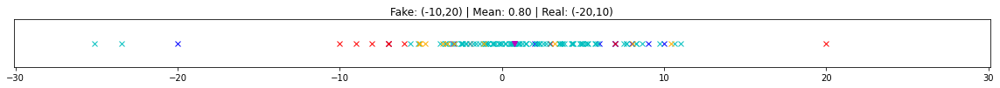

In [52]:
DEBUG = False

#Run the experiment
if 5 in EXPERIMENTS:

    tset = [zelda_tileset,pokemon_tileset,amongus_tileset,pacman_tileset,dungeon_tileset]
    names = ["zelda","pokemon","amongus","pacman","dungeon"]

    mu_acc = {}
    mu_loss = {}
    best_twit_map = {}
    best_evo_fit = {}
    
    SAMP_WEIGHT = 0.85           #P vs. Q WEIGHT FOR TPKL-DIV
    TWIT_MULT = 3              #TWITTER SCORE MULTIPLIER FOR THE TPKL-DIV
    TWIT_OFFSET = 0            #ADD TO THE SCORE TO MAKE MORE POSITIVE
    TWIT_VAR = 5              #ADD TO THE REAL SCORE TO ADD VARIANCE
    
#     SAMP_WEIGHT = 0.05         #P vs. Q WEIGHT FOR TPKL-DIV
#     TWIT_MULT = 3              #TWITTER SCORE MULTIPLIER FOR THE TPKL-DIV
#     TWIT_OFFSET = 2            #ADD TO THE SCORE TO MAKE MORE POSITIVE
#     TWIT_VAR = 3              #ADD TO THE REAL SCORE TO ADD VARIANCE
    
    TRIALS = 1
    EVO_EPOCHS = 250
    ADD_EVO_EPOCHS = 100  #how much to increase the iterations by to get a good score
    NN_EPOCHS = 10
    EXP_ITERS = 100    #simulate 50 twitter polls
    PRE_TRAIN_NN_EPOCHS = 100
    
    POP_SIZE = 16
    MUT_RATE = 0.03
    MU_VALUE = 0.9
    RANDOM_INIT = False
    RANK_TP = True
    BINARY = False
    
    TRAIN_MAPS = user_maps
    
    print(f" -- trials = {TRIALS}, evo epochs = {EVO_EPOCHS}, nn epochs = {NN_EPOCHS}, popsize = {POP_SIZE} --")

    for tt,name in zip(tset,names):
        TILE = name
        print(f"> {TILE} tileset")
        
        mu_acc[TILE] = {}
        mu_loss[TILE] = {}
        best_evo_fit[TILE] = {}
        best_twit_map[TILE] = {}
        
        #get the twitter scores for the real maps
        all_real_scores = [round(twitterFit(m)*TWIT_MULT,2) for m in TRAIN_MAPS[TILE]]

        #repeat the experiment for the tileset X times
        for trial in range(TRIALS):
            print(f" ------- TRIAL #{trial+1} --------")
            
            #define the evalulator fitness bot
            nn_fitnessBot = FitnessCNN(tt,('binary' if BINARY else 'whole'))
            
            #pretrain for a bit
            prereal_maps = TRAIN_MAPS[TILE]
            prefake_maps = makeRandomAscMaps(len(prereal_maps))
            
            # use twitter score differences (raw or percentage)
            rs = []
            fs = []
            for i in range(len(prereal_maps)):
                trs, tfs = twitterScore(prereal_maps[i],prefake_maps[i],BINARY)
                rs.append(trs)
                fs.append(tfs)

            print(" *** PRETRAINING FITNESS CNN ***")
            loss, acc = nn_fitnessBot.train(PRE_TRAIN_NN_EPOCHS,{'real':prereal_maps,'fake':prefake_maps},{'real':rs,'fake':fs})
            
            #SETUP STAT DATA
            mu_acc[TILE][trial] = []
            mu_loss[TILE][trial] = []
            best_evo_fit[TILE][trial] = []
            best_twit_map[TILE][trial] = {}
            
            
            #train the evaluator
            real_s = 0
            fake_s = 0
            last_loss = 0
            best_fit = 0
            
            #training data
            train_twit_maps = {'real':[], 'fake':[]}
            train_twit_scores = {'real':[], 'fake':[]}
            
            #stats
            evobot_fit = []
            evobot_epo = []
            pre_twit_maps = []
            raw_twit_votes = []
            pre_twit_scores = []
            pre_real_scores = []
            
            #####    RUN THE ENTIRE EXPERIMENT PIPELINE   #####
            
            for exp_i in range(EXP_ITERS):
                    
                print(f"   >> EXP {exp_i+1} / {EXP_ITERS} -- last fitness: {best_fit:.2f} | last twit score: {fake_s:.2f} | last loss: {last_loss:.4f}")
                
                ###### EVOLVER STEP ######
                
                #define the bots
                straightBot = StraightBotTP(tt,POP_SIZE,MUT_RATE,EVO_PATT_2D[TILE],rank_tp_sel=RANK_TP,mu=MU_VALUE)

                #set the fitness for the evolver (straightbot)
                straightBot.user_fun = nn_fitnessBot.eval_map_population
                
                #train the evolver bot
                tot_evo_epochs = EVO_EPOCHS
#                 use_blank_map = (True if exp_i % 2 == 0 else False)
                straightBot.train(EVO_EPOCHS,RANDOM_INIT,False)
                
                #continue training if fitness still negative and able to improve
                iter_ct = 0
                while (straightBot.high_pop_fit() <= (0.5 if BINARY else 0)) and iter_ct < 10:
                    straightBot.train(ADD_EVO_EPOCHS,False)
                    tot_evo_epochs += ADD_EVO_EPOCHS
                    iter_ct+=1
                    
                
                #add fitness change graph
                evobot_fit.append(straightBot.changeFit)
                evobot_epo.append(range(tot_evo_epochs))
                
                #save the highest fitness
                best_evo_fit[TILE][trial].append(straightBot.high_pop_fit())
        
                
                #show the fitness change every 5th iteration
                if (exp_i+1)%5 == 0:
                    print("SHOWING FITNESS GRAPHS")
                    showFitnessGraphs2(evobot_fit,evobot_epo,range(exp_i-3,exp_i+2))
                    evobot_fit = []
                    evobot_epo = []
                    
                    
                #####   TWITTER STEP   #####
                    
                
                #take the best sample from the population
                twitter_map = straightBot.best_map()
                twit_vote = round(twitterFit(twitter_map)*TWIT_MULT)
                
                #"evaluate" the map through twitter votes
                real_map = random.choice(user_maps[TILE])
                real_s, fake_s = twitterScore(real_map,twitter_map, BINARY)
                
                # > train on different sets 
#                 train_twit_maps = {"real":[], "fake":[]}
#                 train_twit_scores = {"real":[], "fake":[]}
                
#                 # (normal pair)
#                 train_twit_maps['real'].append(real_map)
#                 train_twit_maps['fake'].append(twitter_map)
#                 train_twit_scores['real'].append(real_s)
#                 train_twit_scores['fake'].append(fake_s)
                
#                 # (user to user)
#                 [realA_map, realB_map] = user_maps[TILE][random.choices(range(len(user_maps[TILE])),k=2)]
#                 realA_s, realB_s = twitterScore(realA_map,realB_map,BINARY)
                
#                 # (gen to gen)
#                 [genA_map, genB_map] = straightBot.population[random.choices(range(len(straightBot.population)),k=2)]
#                 genA_s, genB_s = twitterScore(genA_map, genB_map,BINARY)
                
#                 train_twit_maps['real'].append(realA_map)
#                 train_twit_scores['real'].append(realA_s)
#                 train_twit_maps['real'].append(realB_map)
#                 train_twit_scores['real'].append(realB_s)
#                 train_twit_maps['fake'].append(genA_map)
#                 train_twit_scores['fake'].append(genA_s)
#                 train_twit_maps['fake'].append(genB_map)
#                 train_twit_scores['fake'].append(genB_s)
                
                
                #  > train on new and old
                train_twit_maps['real'].append(real_map)
                train_twit_maps['fake'].append(twitter_map)
                train_twit_scores['real'].append(real_s)
                train_twit_scores['fake'].append(fake_s)

                
                #  > train only on new
#                 train_twit_maps = {'real':[real_map], 'fake':[twitter_map]}
#                 train_twit_scores = {'real':[real_s], 'fake':[fake_s]}
                
                #train the evaluator fitness bot on the scores
                loss, acc = nn_fitnessBot.train(NN_EPOCHS,train_twit_maps,train_twit_scores)
                
                
                #show the best 5 twitter maps every 10th iteration
                pre_twit_maps.append(twitter_map)
                pre_real_scores.append(real_s)
                raw_twit_votes.append(twit_vote)
                pre_twit_scores.append(fake_s)
                
                if (exp_i+1)%10 == 0:
                    best5 = np.argsort(-np.array(pre_twit_scores))[:5]
                    rec_best_evo_fit = best_evo_fit[TILE][trial][-10:]
                    print(rec_best_evo_fit)
                    if BINARY:
                        ind = [f"#{(x+(exp_i-8))}: {int(raw_twit_votes[x])}*{entropy(pre_twit_maps[x]):.1f} | {pre_twit_scores[x]:.2f} ({rec_best_evo_fit[x]:.2f})" for x in best5]
                    else:
                        ind = [f"#{(x+(exp_i-8))}: {int(raw_twit_votes[x])}*{entropy(pre_twit_maps[x]):.1f} | {int(pre_twit_scores[x])} ({int(rec_best_evo_fit[x])})" for x in best5]
                    best5_maps = np.array(pre_twit_maps)[best5]
                    showMultiMaps(best5_maps,TILE,'',ind)
                    
                    #show the map distribution as well
                    cur_real_score_pred = nn_fitnessBot.eval_map_population(TRAIN_MAPS[TILE])
                    cur_fake_score_pred = nn_fitnessBot.eval_map_population(pre_twit_maps)
                    showScoreDist(pre_real_scores,pre_twit_scores,cur_real_score_pred,cur_fake_score_pred,BINARY)
                    
                    pre_twit_maps = []
                    pre_twit_scores = []
                    pre_real_scores = []
                    raw_twit_votes = []
            
            
                #GET THE STAT DATA
                mu_loss[TILE][trial].append(loss)
                mu_acc[TILE][trial].append(acc)
                
                last_loss = loss[-1]
                best_fit = best_evo_fit[TILE][trial][-1]
                
                
                
                
                #save current map final twitter map and score if applicable
                entropy_score = entropy(twitter_map) #get the entropy for shits and giggles
                
                #get checks
                no_best = ('twitter_score' not in best_twit_map[TILE][trial])
                if not no_best:
                    better_twit_score = (twit_vote > best_twit_map[TILE][trial]['twitter_score'])
                    better_entropy = (entropy_score >= best_twit_map[TILE][trial]['entropy'])
                    
                #replace current map
                if no_best or (better_twit_score and better_entropy):
                    best_twit_map[TILE][trial]['map'] = twitter_map.copy()
                    best_twit_map[TILE][trial]['twitter_score'] = twit_vote
                    best_twit_map[TILE][trial]['evo_score'] = best_fit
                    best_twit_map[TILE][trial]['index'] = exp_i
                    best_twit_map[TILE][trial]['entropy'] = entropy_score
                    
                    
            #export the CNN
            nn_fitnessBot.exportModel("cnn_models",f"{TILE}-{trial}-[{date.today().strftime('%b-%d-%y')}]")
                    

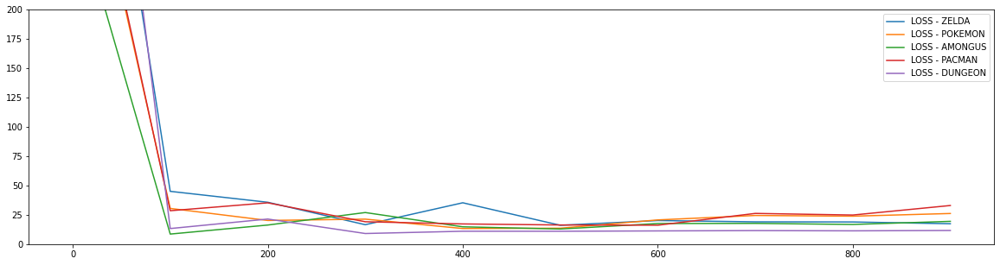

In [53]:
#show the loss across all tilesets
if 5 in EXPERIMENTS:
    plt.figure(figsize=(20,5))
    for t in names:
        TILE = t
        l = mu_loss[TILE][0]
        l2 = np.array(l).flatten()
        x = range(len(l2))
        plt.plot(x[::100],l2[::100],label=f"LOSS - {t.upper()}")
        if BINARY:
            plt.ylim(0,0.5)
        else:
            plt.ylim(0,200)
    plt.legend()
    plt.show()

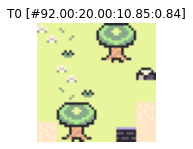

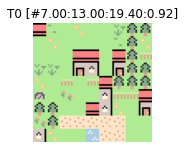

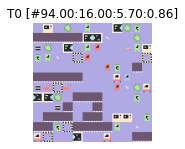

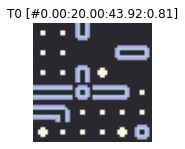

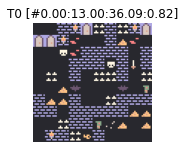

In [54]:
# show the best map generated from the experiments
if 5 in EXPERIMENTS:
    for t in names:
        TILE = t
        mapSet = []
        infoTxt = []
        for tr in range(TRIALS):
            twee =  best_twit_map[t][tr]
            mapSet.append(twee['map'])
            infoTxt.append(f"T{tr} [#{twee['index']:.2f}:{twee['twitter_score']:.2f}:{twee['evo_score']:.2f}:{twee['entropy']:.2f}]")
        showMultiMaps(mapSet,t,'',infoTxt)